In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import random
from scipy.stats import probplot
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import StratifiedGroupKFold, GroupShuffleSplit, StratifiedShuffleSplit
from scipy import stats
from imblearn.over_sampling import SMOTE
from scipy.stats import ttest_1samp
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, mutual_info_classif
from sklearn.ensemble import ExtraTreesClassifier
from scipy.stats import pointbiserialr

In [ ]:
TEST_SIZE = 0.1
RANDOM_STATE = 42
N_FOLDS = 6
CORR_THRESHOLD = 0.8

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. Exploratory Data Analysis - EDA:


In [ ]:
class ExploratoryDataAnalysisTabular:
    def __init__(self, dataset):
        self.dataset = dataset

    def extract_initial_analysis(self):
        """Function to get initial insight about the complete dataset."""
        # checking number of subjects and features:
        print(f'Number of Subjects: {self.dataset.shape[0]}')
        print(f'Number of Features: {self.dataset.shape[1]}')
        # Checking missing values:
        print(f'Number of missing values: {self.dataset.isna().sum().sum()}')
        # Checking how many classes:
        print(f'Classes: {self.dataset["Stress_Level"].unique()}')
        # Checking the number of subject per class:
        print(f'Number of subjects per class:\n {self.dataset["Stress_Level"].value_counts()}')

    def visualize_feature(self, feature):
        """Function to visualize Histogram, Box-Plot and Q-Q Plot in one representation."""
        plt.figure(figsize=(15, 4))
        plt.subplot(1, 3, 1)
        sns.histplot(self.dataset[feature], kde=True)  # Histogram
        plt.subplot(1, 3, 2)
        sns.boxplot(self.dataset[feature])  # Box-Plot
        plt.subplot(1, 3, 3)
        probplot(self.dataset[feature], plot=plt, dist='norm')  # Q-Q Plot
        plt.tight_layout()
        return plt.show()

    def count_outliers(self, feature):
        """Function to count the number of outliers and its percentage."""
        q1 = np.percentile(self.dataset[feature], 25)
        q3 = np.percentile(self.dataset[feature], 75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = np.sum((self.dataset[feature] < lower_bound) | (self.dataset[feature] > upper_bound))

        percentage = (num_outliers / len(self.dataset[feature])) * 100
        return num_outliers, percentage

    def calculate_correlation(self, *features):
        """Function to calculate the correlation between a feature and a target."""
        correlations = pd.DataFrame(columns=['Feature', 'Correlation'])
        for feature in features:
            correlation, pval = pointbiserialr(self.dataset[feature], self.dataset['Stress_Level'])
            correlations = correlations.append({'Feature': feature, 'Correlation': correlation}, ignore_index=True)
        return correlations

    def visualize_correlation(self):
        """Visualize the correlation between multiple features of the dataset as a heatmap."""
        corr = self.dataset.corr()
        sns.heatmap(corr, cmap='RdBu', annot=True, fmt=".2f")
        return plt.show()


In [ ]:
DATASET = pd.read_csv('/content/drive/MyDrive/MachineLearning_Project/pcg_features_With_stress_level.csv')

In [ ]:
DATASET.head()

,MAX,MIN,MEAN,MEDIAN,STD,ENERGY,POWER,AE_MAX,AE_MIN,AE_MEAN,...,CA_MIN,CA_MEAN,CA_MEDIAN,CA_STD,CD_MAX,CD_MIN,CD_MEAN,CD_MEDIAN,CD_STD,Stress_Level
0,0.584746,-0.989883,-0.000789,0.002027,0.056535,6138.000576,0.003197,0.584746,-0.265582,0.060032,...,-1.402961,-0.001116,0.002860,0.000211,0.102568,-0.110090,-2.082197e-07,-3.503422e-07,0.000211,High
1,0.607486,-0.617205,-0.000817,0.004622,0.069224,9201.916890,0.004793,0.607486,-0.063343,0.084502,...,-0.872447,-0.001155,0.006537,0.000183,0.003917,-0.003646,7.548140e-09,8.132405e-08,0.000183,High
2,0.958774,-0.988808,0.000235,-0.001997,0.092992,16603.372243,0.008648,0.958774,-0.743674,0.079078,...,-1.398367,0.000332,-0.002806,0.000322,0.097673,-0.075290,-1.280732e-06,-9.676913e-07,0.000322,Rest
3,0.377058,-0.688211,0.000172,0.001580,0.038216,2804.110828,0.001460,0.377058,-0.025836,0.044219,...,-0.973167,0.000244,0.002234,0.000127,0.016806,-0.025325,4.590091e-08,-4.204741e-07,0.000127,Rest
4,0.994622,-0.990815,-0.012910,-0.002584,0.494585,469979.390960,0.244781,0.994622,-0.530497,0.554603,...,-1.401666,-0.018256,-0.003655,0.001093,0.057569,-0.054559,-1.546283e-06,-2.239015e-06,0.001093,High


In [ ]:
DATASET.describe()

,MAX,MIN,MEAN,MEDIAN,STD,ENERGY,POWER,AE_MAX,AE_MIN,AE_MEAN,...,CA_MAX,CA_MIN,CA_MEAN,CA_MEDIAN,CA_STD,CD_MAX,CD_MIN,CD_MEAN,CD_MEDIAN,CD_STD
count,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,...,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,7.300000e+01,7.300000e+01,73.000000
mean,0.680960,-0.719092,0.000328,0.002005,0.123631,56655.278137,0.029508,0.680960,-0.260831,0.131884,...,0.965071,-1.019271,0.000465,0.002830,0.000652,0.049570,-0.059195,-3.566419e-07,-9.732560e-07,0.000652
std,0.334284,0.334616,0.005209,0.009887,0.119974,111930.033059,0.058297,0.334284,0.268159,0.125797,...,0.475110,0.475425,0.007366,0.013968,0.002108,0.097810,0.129862,8.538500e-07,2.433115e-06,0.002108
min,0.011264,-0.991673,-0.012910,-0.039144,0.000614,34.577279,0.000018,0.011264,-0.987341,0.006325,...,0.015521,-1.470922,-0.018256,-0.055332,0.000107,0.001431,-0.782929,-3.140675e-06,-1.427630e-05,0.000107
25%,0.426655,-0.989822,-0.000840,0.000260,0.047167,4272.827290,0.002225,0.426655,-0.345148,0.054435,...,0.603100,-1.399804,-0.001189,0.000371,0.000164,0.005277,-0.052368,-4.980275e-07,-9.676913e-07,0.000164
50%,0.726375,-0.966977,-0.000786,0.001852,0.088473,15029.781876,0.007828,0.726375,-0.150586,0.090741,...,1.025306,-1.367490,-0.001111,0.002614,0.000255,0.016331,-0.012709,2.175809e-10,-2.127560e-07,0.000255
75%,0.992048,-0.468886,0.000264,0.004120,0.133243,34087.198920,0.017754,0.992048,-0.082090,0.163166,...,1.403549,-0.663099,0.000373,0.005834,0.000358,0.053697,-0.005939,9.340262e-09,8.132405e-08,0.000358
max,0.999311,0.004451,0.038939,0.062019,0.559851,604703.126409,0.314950,0.999311,0.008152,0.659946,...,1.471485,0.006639,0.055070,0.087548,0.017397,0.738344,-0.001388,2.034607e-06,1.851817e-06,0.017397


In [ ]:
ExploratoryDataAnalysisTabular(dataset=DATASET).extract_initial_analysis()

Number of Subjects: 73
Number of Features: 66
Number of missing values: 0
Classes: ['High' 'Rest' 'Medium']
Number of subjects per class:
 Stress_Level
High      34
Medium    25
Rest      14
Name: count, dtype: int64


## 1.2. Distribution, Outliers and Probability Distribution:
For each Feature, the following is applied:
- Histogram
- Box and Whisker plot
- Q-Q Plot

In [ ]:
FEATURES = [feature for feature in DATASET.columns if feature not in ['Stress_Level']]

In [ ]:
FEATURES

['MAX',
 'MIN',
 'MEAN',
 'MEDIAN',
 'STD',
 'ENERGY',
 'POWER',
 'AE_MAX',
 'AE_MIN',
 'AE_MEAN',
 'AE_MEDIAN',
 'AE_STD',
 'RM_MAX',
 'RM_MIN',
 'RM_MEAN',
 'RM_MEDIAN',
 'RM_STD',
 'ZCR_MAX',
 'ZCR_MIN',
 'ZCR_MEAN',
 'ZCR_MEDIAN',
 'ZCR_STD',
 'ZCR_GLOBAL',
 'PEAK_AMP',
 'PEAK_FREQ',
 'BER_MAX',
 'BER_MIN',
 'BER_MEAN',
 'BER_MEDIAN',
 'BER_STD',
 'SC_MAX',
 'SC_MIN',
 'SC_MEAN',
 'SC_MEDIAN',
 'SC_STD',
 'SB_MAX',
 'SB_MIN',
 'SB_MEAN',
 'SB_MEDIAN',
 'SB_STD',
 'MFCC_MAX',
 'MFCC_MIN',
 'MFCC_MEAN',
 'MFCC_MEDIAN',
 'MFCC_STD',
 'DELTA1_MAX',
 'DELTA1_MIN',
 'DELTA1_MEAN',
 'DELTA1_MEDIAN',
 'DELTA1_STD',
 'DELTA2_MAX',
 'DELTA2_MIN',
 'DELTA2_MEAN',
 'DELTA2_MEDIAN',
 'DELTA2_STD',
 'CA_MAX',
 'CA_MIN',
 'CA_MEAN',
 'CA_MEDIAN',
 'CA_STD',
 'CD_MAX',
 'CD_MIN',
 'CD_MEAN',
 'CD_MEDIAN',
 'CD_STD']

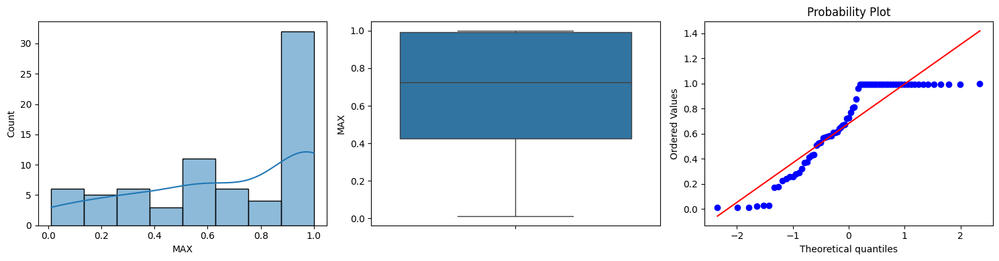

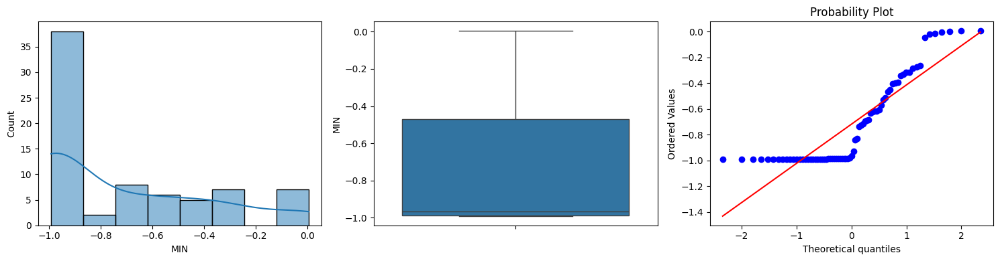

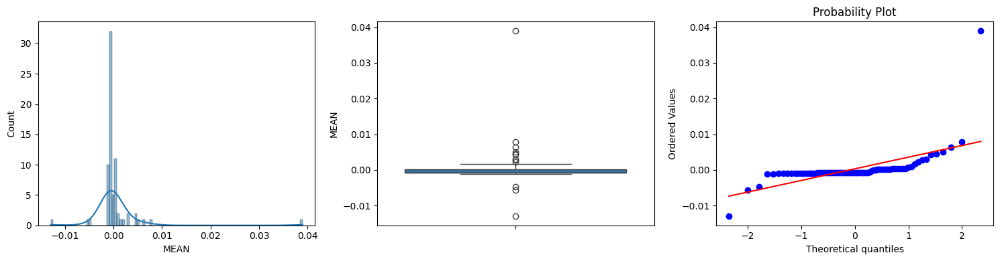

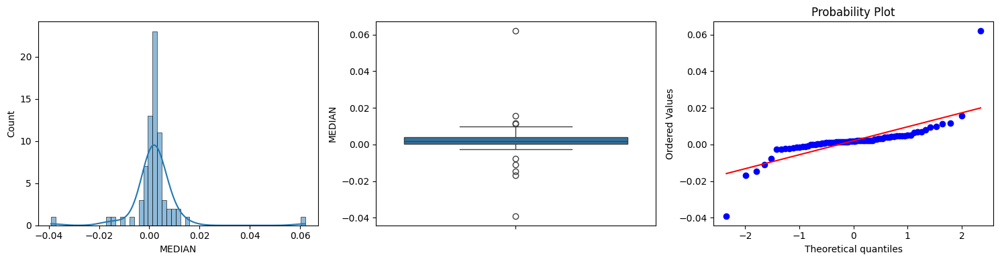

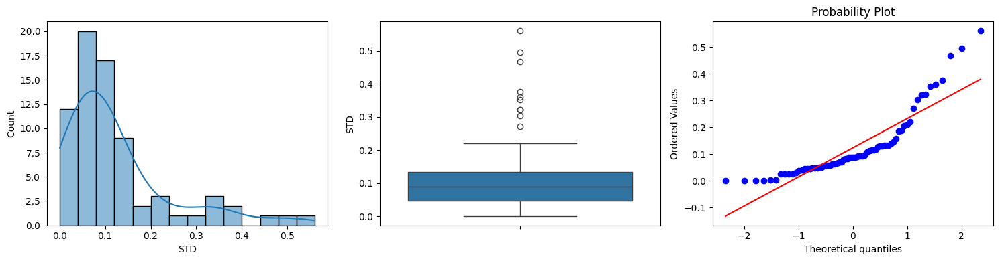

...

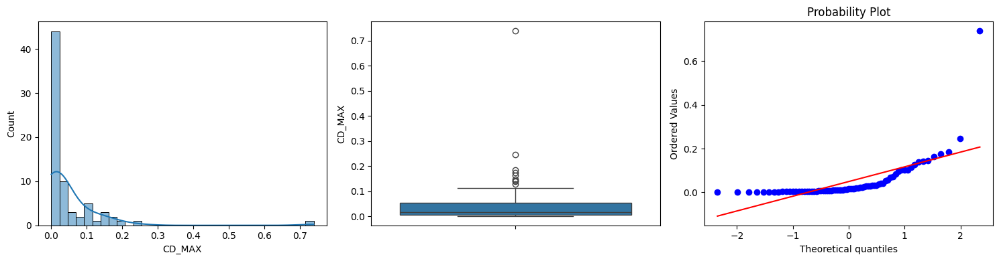

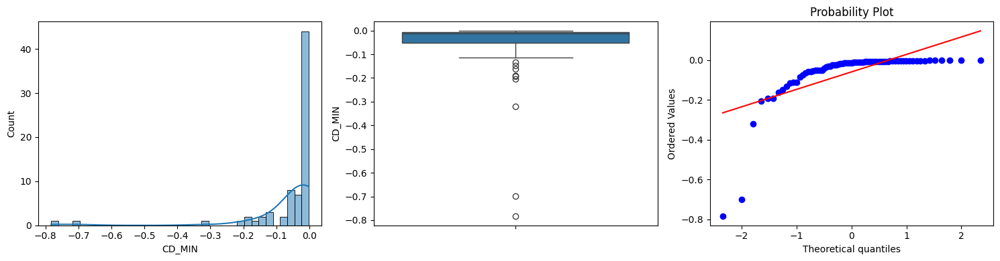

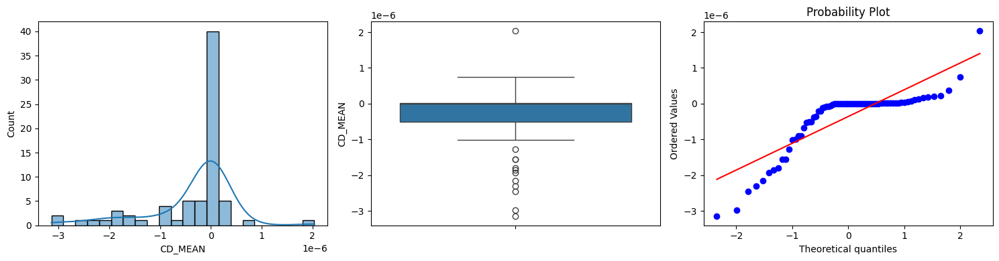

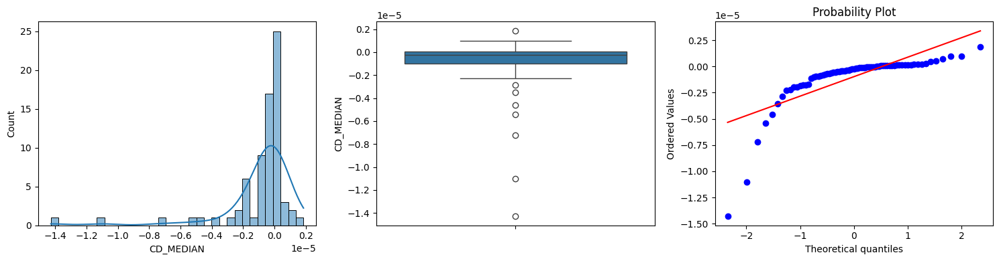

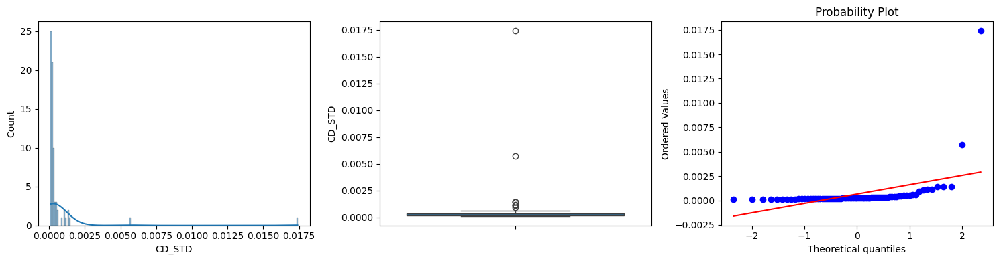

In [ ]:

for feature in FEATURES:
    ExploratoryDataAnalysisTabular(dataset=DATASET).visualize_feature(feature=feature)

# 2. Feature Engineering:


In [ ]:
class FeatureEngineeringTabular:
    def __init__(self, dataset):
        self.dataset = dataset

    def split_dataset(self, test_size: int, rand_state: int):
        """Function to split the dataset into Train, Test and Validation sets."""
        data = self.dataset.copy()
        features = data.drop(["Stress_Level"], axis=1, inplace=False)
        target = data["Stress_Level"]
        x_train, x_test, y_train, y_test = train_test_split(features, target,
                                                            test_size=test_size,
                                                            random_state=rand_state,
                                                            shuffle=True)

        dfs = [x_train, y_train, x_test, y_test]
        # Loop through the list and reset the index for each DataFrame:
        for df in dfs:
            df.reset_index(drop=True, inplace=True)
        return x_train, x_test, y_train, y_test

    def create_cross_validation(self, n_folds: int, rand_state: int):
        """Function to generate the indices for train and test set of each fold of the cross
        validation. It returns two list containing the indices for train and test sets."""
        cv = StratifiedGroupKFold(n_splits=n_folds, shuffle=True, random_state=rand_state)
        train_indices = []
        test_indices = []
        for fold, (train_idx, test_idx) in enumerate(cv.split(self.dataset,
                                                              self.dataset["Stress_Level"],groups=self.dataset.index )):
            train_indices.append(train_idx)
            test_indices.append(test_idx)
        return train_indices, test_indices

    def create_dataframe_from_indices(self, indices_list, index):
        """Function to return a DataFrame for x and y based on the Indices generated from Cross Validation."""
        fold = self.dataset.loc[indices_list[index]]
        fold = fold.reset_index(drop=True)
        x = fold.drop(["Stress_Level"], axis=1, inplace=False)
        y = fold["Stress_Level"]
        return x, y

    def create_dataframe_from_indices2(self, indices_list, index):
        """Function to return a DataFrame for x and y based on the Indices generated from Cross Validation."""
        fold = self.dataset.loc[indices_list[index]]
        fold = fold.reset_index(drop=True)
        x = fold.drop(["Stress_Level"], axis=1, inplace=False)
        y = fold[["Stress_Level"]]
        return x, y

    def apply_gaussian_transformation(self, feature, trans_method: str):
        """Function to apply Gaussian Transformation. trans_method is either 'log', 'reciprocal',
        'square_root', 'cube_root', 'exponential' or 'boxcox' """
        if trans_method == 'log':
            transformed_feature = np.log(self.dataset[feature])
        elif trans_method == 'reciprocal':
            transformed_feature = 1 / self.dataset[feature]
        elif trans_method == 'square_root':
            transformed_feature = np.sqrt(self.dataset[feature])
        elif trans_method == 'cube_root':
            transformed_feature = np.cbrt(self.dataset[feature])
        elif trans_method == 'exponential':
            transformed_feature = self.dataset[feature] ** (1 / 1.2)
        elif trans_method == 'boxcox':
            # BoxCox works only with positive values:
            transformed_feature, parameter = pd.DataFrame(stats.boxcox(self.dataset[feature]))
        elif trans_method == 'none':
            transformed_feature = self.dataset[feature]
        else:
            raise ValueError(f"'{trans_method}' is not a valid method. The 'trans_method' is either 'log', "
                             f"'reciprocal', 'square_root', 'exponential' or 'boxcox'")
        return pd.DataFrame(transformed_feature)

    @staticmethod
    def normalize_data(x_train, x_test):
        """Function to normalize datasets."""
        scaler = MinMaxScaler()
        x_train_normalized = pd.DataFrame(scaler.fit_transform(x_train), columns=x_train.columns)
        x_test_normalized = pd.DataFrame(scaler.transform(x_test), columns=x_test.columns)
        return x_train_normalized, x_test_normalized

    @staticmethod
    def balance_dataset(x_train, y_train, rand_state: int):
        """Function to balance dataset using SMOTE technique."""
        smote = SMOTE(random_state=rand_state)
        x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)
        return x_train_resampled, y_train_resampled

    def replace_missing_values(self, feature: str, replace_method: str):
        if replace_method == 'mean':
            mean = self.dataset[feature].median()
            self.dataset[feature].fillna(mean, inplace=True)
        elif replace_method == 'median':
            median = self.dataset[feature].median()
            self.dataset[feature].fillna(median, inplace=True)
        else:
            raise ValueError(
                f"'{replace_method}' is not a valid method. The 'replace_method' is either 'mean' or 'median'.")
        return self.dataset

In [ ]:
X_TRAIN, X_TEST, Y_TRAIN, Y_TEST = FeatureEngineeringTabular(dataset=DATASET).split_dataset(test_size=TEST_SIZE,
                                                                                            rand_state=RANDOM_STATE)

In [ ]:
print(f'Shape of X_TRAIN:{X_TRAIN.shape}')
print(f'Shape of X_TRAIN:{Y_TRAIN.shape}')
print(f'Shape of X_TRAIN:{X_TEST.shape}')
print(f'Shape of X_TRAIN:{Y_TEST.shape}')

Shape of X_TRAIN:(65, 65)
Shape of X_TRAIN:(65,)
Shape of X_TRAIN:(8, 65)
Shape of X_TRAIN:(8,)


## 2.2. Feature Scaling:
### 2.2.1. Gaussian Transformation:


In [ ]:
# Create lists inclusing all transformed features for X_TRAIN and X_TEST:
X_TRAIN_TRANSFORMED_FEATURES = []
X_TEST_TRANSFORMED_FEATURES = []

### 1. ds_max:
- __Method used:__ cube_root:

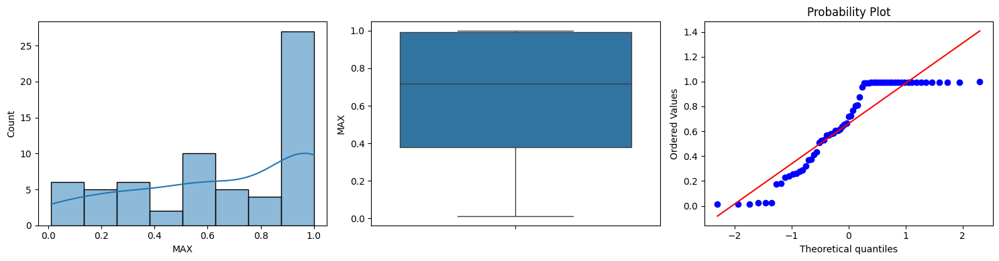

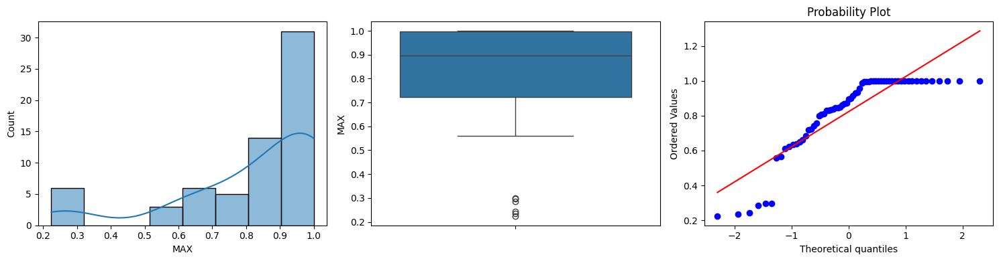

In [ ]:
# Applyig Gaussian Transformation:
DS_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MAX',
                                                                                              trans_method='cube_root')

# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_MAX_TRANSFORMED).visualize_feature(feature='MAX')

In [ ]:
# Counting Outliers:
DS_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('MAX')
DS_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_MAX_TRANSFORMED).count_outliers('MAX')
print(f'Number of outliers before Gaussian Transformation: {DS_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_MAX_TRANSFORMED['MAX'].skew()}")
print(f'Number of missing values: {DS_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 6
Outlier Coefficient: -1.447922872858824
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MAX',
                                                                                                      trans_method='none')
X_TEST_DS_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='MAX',
                                                                                                    trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_MAX_TRANSFORMED)

### 2. ds_min:
- __Method used:__ cube_root:

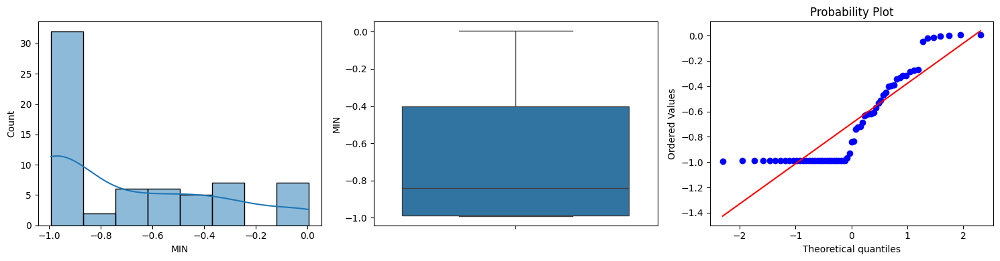

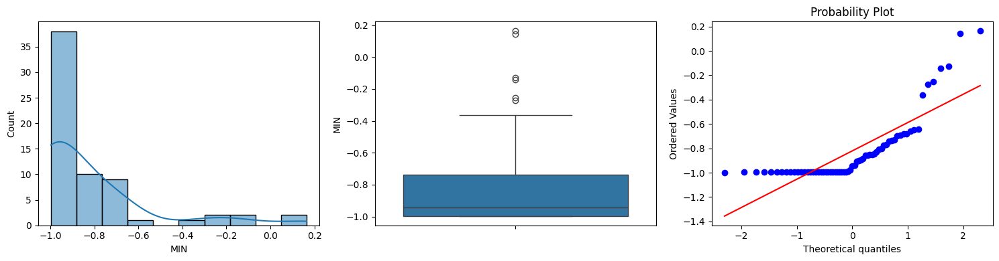

In [ ]:
# Applyig Gaussian Transformation:
DS_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MIN',
                                                                                              trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_MIN_TRANSFORMED).visualize_feature(feature='MIN')

In [ ]:
# Counting Outliers:
DS_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('MIN')
DS_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_MIN_TRANSFORMED).count_outliers('MIN')
print(f'Number of outliers before Gaussian Transformation: {DS_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_MIN_TRANSFORMED['MIN'].skew()}")
print(f'Number of missing values: {DS_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 6
Outlier Coefficient: 2.1299670789649157
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MIN',
                                                                                                      trans_method='none')
X_TEST_DS_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='MIN',
                                                                                                    trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_MIN_TRANSFORMED)

### 3. ds_mean:
- __Method used:__ cube_root:

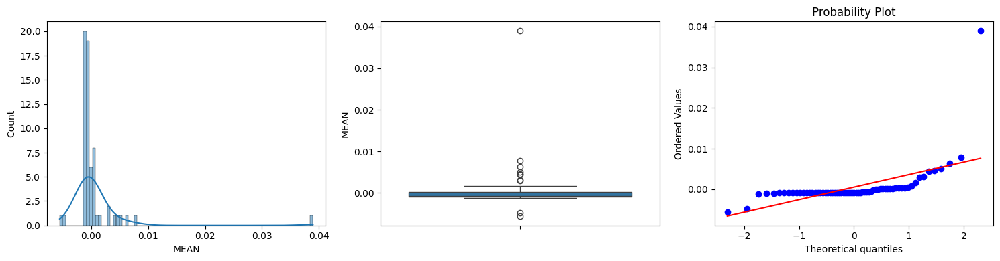

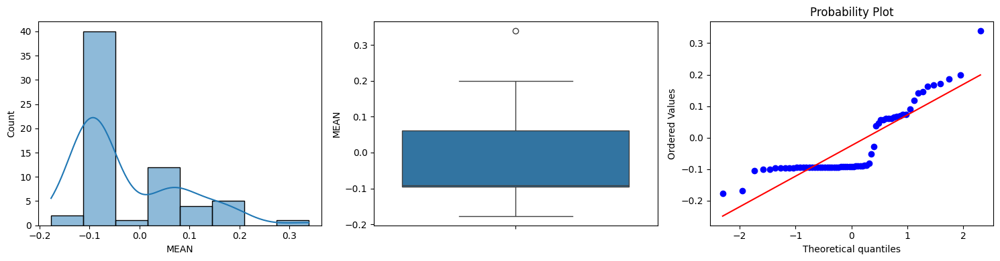

In [ ]:
# Applyig Gaussian Transformation:
DS_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MEAN',
                                                                                        trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_MEAN_TRANSFORMED).visualize_feature(feature='MEAN')

In [ ]:
# Counting Outliers:
DS_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('MEAN')
DS_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_MEAN_TRANSFORMED).count_outliers('MEAN')
print(f'Number of outliers before Gaussian Transformation: {DS_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_MEAN_TRANSFORMED['MEAN'].skew()}")
print(f'Number of missing values: {DS_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 10
Number of outliers after Gaussian Transformation: 1
Outlier Coefficient: 1.1885945572937888
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MEAN',
                                                                                               trans_method='cube_root')
X_TEST_DS_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='MEAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_MEAN_TRANSFORMED)

### 4. ds_median:
- __Method used:__ cube_root:

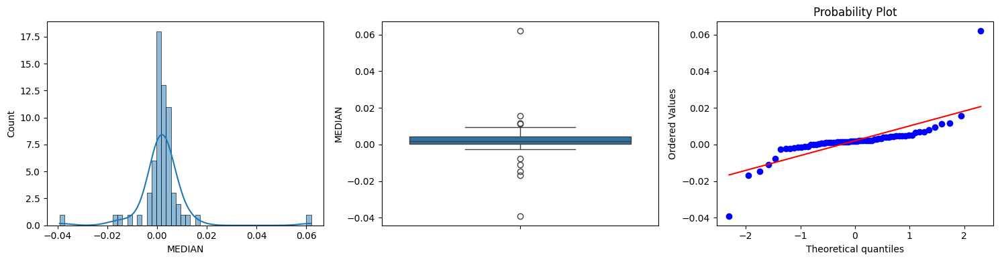

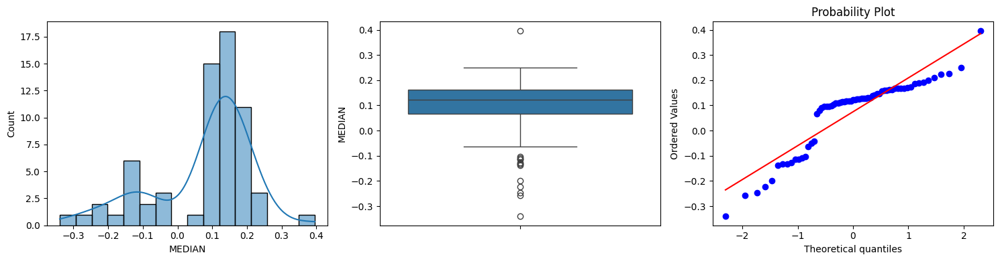

In [ ]:
# Applyig Gaussian Transformation:
DS_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MEDIAN',
                                                                                        trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_MEDIAN_TRANSFORMED).visualize_feature(feature='MEDIAN')

In [ ]:
# Counting Outliers:
DS_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('MEDIAN')
DS_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_MEDIAN_TRANSFORMED).count_outliers('MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {DS_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_MEDIAN_TRANSFORMED['MEDIAN'].skew()}")
print(f'Number of missing values: {DS_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 9
Number of outliers after Gaussian Transformation: 14
Outlier Coefficient: -1.042716478044837
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MEDIAN',
                                                                                               trans_method='none')
X_TEST_DS_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='MEDIAN',
                                                                                             trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_MEDIAN_TRANSFORMED)

### 5. ds_std:
- __Method used:__ cube_root:

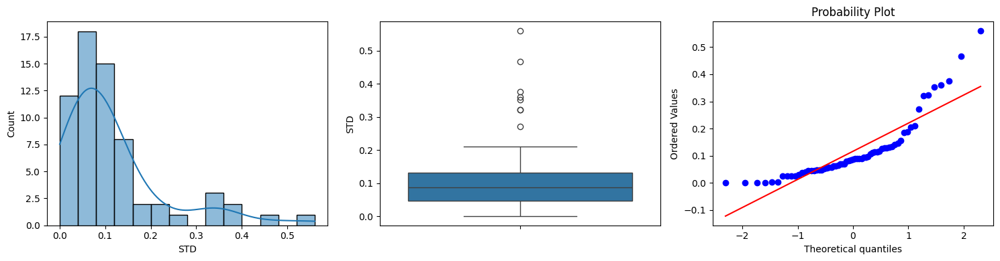

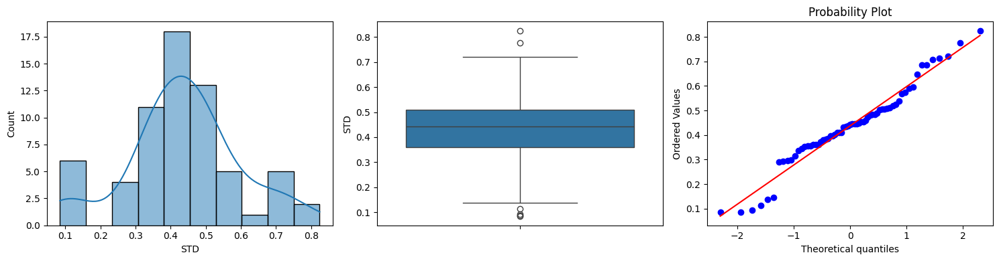

In [ ]:
# Applyig Gaussian Transformation:
DS_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='STD',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DS_STD_TRANSFORMED).visualize_feature(feature='STD')

In [ ]:
# Counting Outliers:
DS_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('STD')
DS_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DS_STD_TRANSFORMED).count_outliers('STD')
print(f'Number of outliers before Gaussian Transformation: {DS_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DS_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DS_STD_TRANSFORMED['STD'].skew()}")
print(f'Number of missing values: {DS_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 6
Outlier Coefficient: -0.06826429372601565
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DS_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='STD',
                                                                                               trans_method='cube_root')
X_TEST_DS_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='STD',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DS_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DS_STD_TRANSFORMED)

### 6. energy:
- __Method used:__ cube_root:

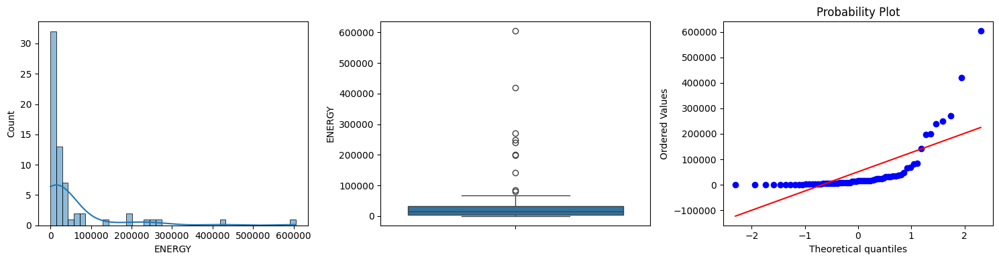

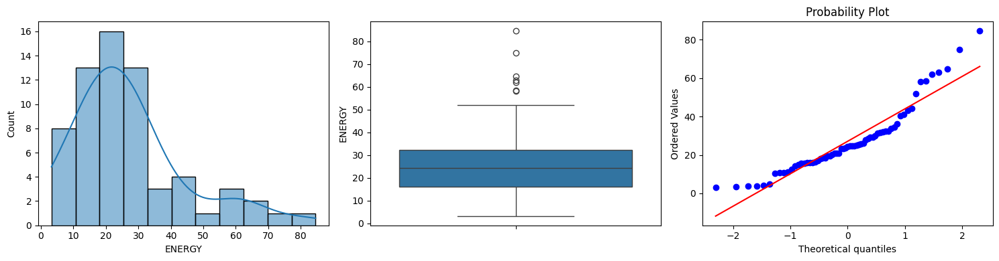

In [ ]:
# Applyig Gaussian Transformation:
ENERGY_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ENERGY',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ENERGY')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ENERGY_TRANSFORMED).visualize_feature(feature='ENERGY')

In [ ]:
# Counting Outliers:
ENERGY_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ENERGY')
ENERGY_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ENERGY_TRANSFORMED).count_outliers('ENERGY')
print(f'Number of outliers before Gaussian Transformation: {ENERGY_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ENERGY_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ENERGY_TRANSFORMED['ENERGY'].skew()}")
print(f'Number of missing values: {ENERGY_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 10
Number of outliers after Gaussian Transformation: 7
Outlier Coefficient: 1.261834764369339
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ENERGY_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ENERGY',
                                                                                               trans_method='cube_root')
X_TEST_ENERGY_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ENERGY',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ENERGY_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ENERGY_TRANSFORMED)

### 7. power:
- __Method used:__ cube_root:

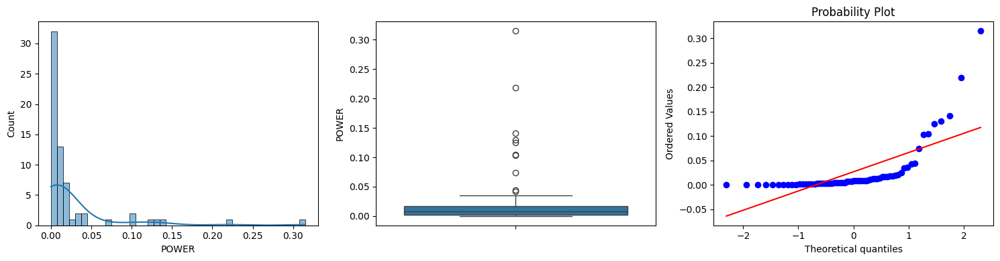

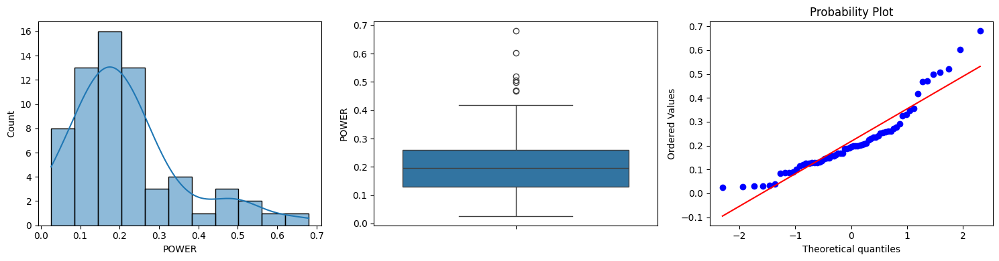

In [ ]:
# Applyig Gaussian Transformation:
POWER_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='POWER',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='POWER')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=POWER_TRANSFORMED).visualize_feature(feature='POWER')

In [ ]:
# Counting Outliers:
POWER_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('POWER')
POWER_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=POWER_TRANSFORMED).count_outliers('POWER')
print(f'Number of outliers before Gaussian Transformation: {POWER_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {POWER_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {POWER_TRANSFORMED['POWER'].skew()}")
print(f'Number of missing values: {POWER_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 10
Number of outliers after Gaussian Transformation: 7
Outlier Coefficient: 1.2618347643693384
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_POWER_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='POWER',
                                                                                               trans_method='cube_root')
X_TEST_POWER_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='POWER',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_POWER_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_POWER_TRANSFORMED)

### 8. ae_max:
- __Method used:__ cube_root:

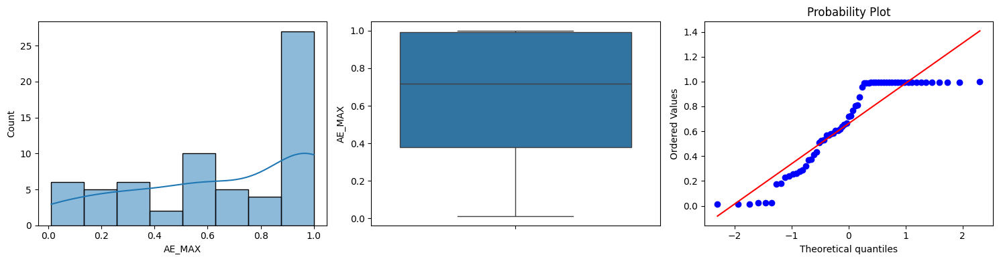

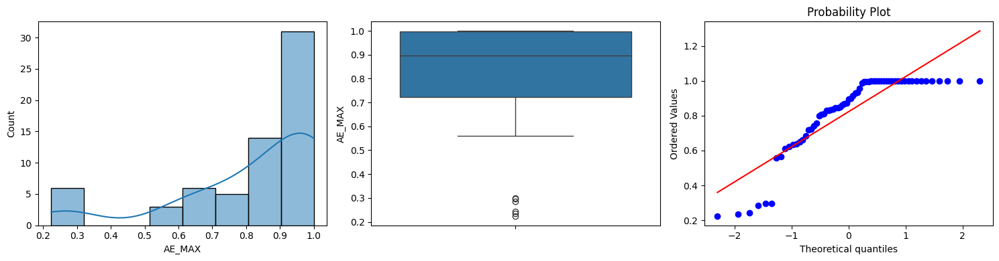

In [ ]:
# Applyig Gaussian Transformation:
AE_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_MAX',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='AE_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=AE_MAX_TRANSFORMED).visualize_feature(feature='AE_MAX')

In [ ]:
# Counting Outliers:
AE_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('AE_MAX')
AE_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_MAX_TRANSFORMED).count_outliers('AE_MAX')
print(f'Number of outliers before Gaussian Transformation: {AE_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_MAX_TRANSFORMED['AE_MAX'].skew()}")
print(f'Number of missing values: {AE_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 6
Outlier Coefficient: -1.447922872858824
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_MAX',
                                                                                               trans_method='none')
X_TEST_AE_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='AE_MAX',
                                                                                             trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_MAX_TRANSFORMED)

### 9. ae_min:
- __Method used:__ cube_root:

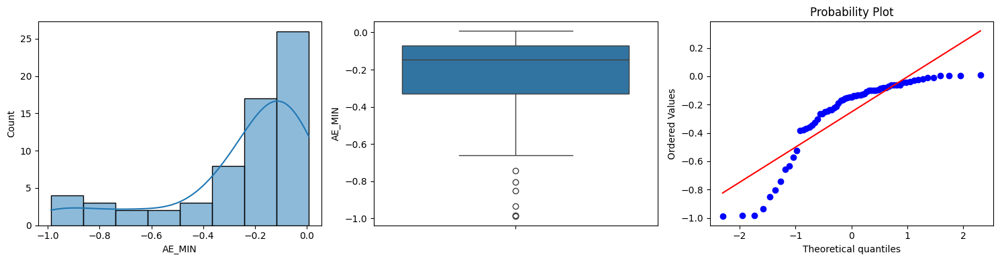

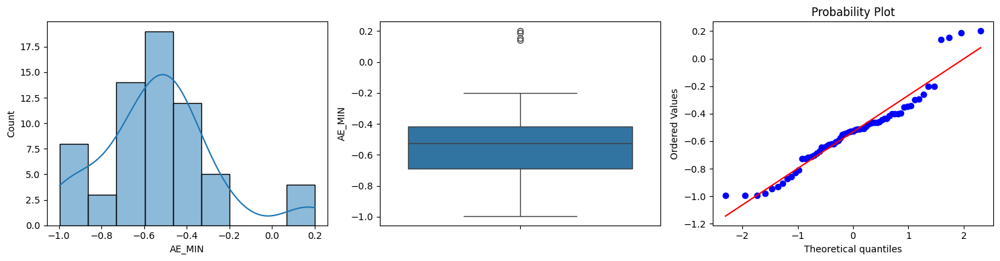

In [ ]:
# Applyig Gaussian Transformation:
AE_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_MIN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='AE_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=AE_MIN_TRANSFORMED).visualize_feature(feature='AE_MIN')

In [ ]:
# Counting Outliers:
AE_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('AE_MIN')
AE_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_MIN_TRANSFORMED).count_outliers('AE_MIN')
print(f'Number of outliers before Gaussian Transformation: {AE_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_MIN_TRANSFORMED['AE_MIN'].skew()}")
print(f'Number of missing values: {AE_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 7
Number of outliers after Gaussian Transformation: 4
Outlier Coefficient: 0.6803213720324709
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_MIN',
                                                                                               trans_method='cube_root')
X_TEST_AE_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='AE_MIN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_MIN_TRANSFORMED)

### 10. ae_mean:
- __Method used:__ cube_root:

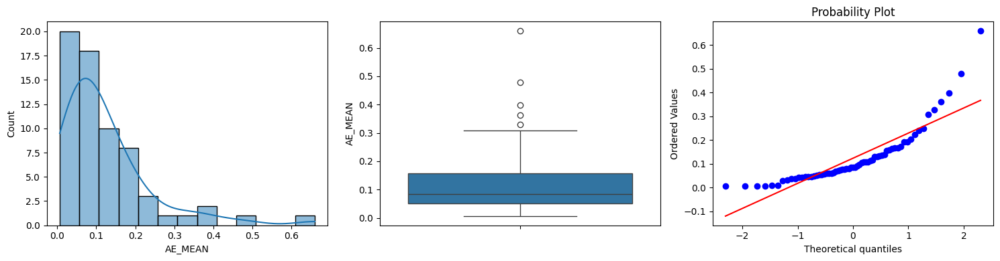

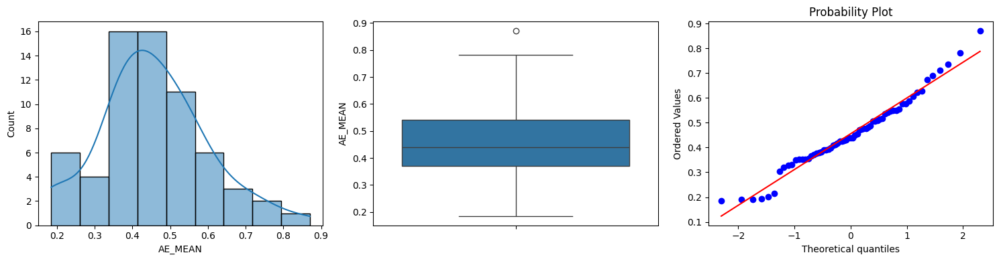

In [ ]:
# Applyig Gaussian Transformation:
AE_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_MEAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='AE_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=AE_MEAN_TRANSFORMED).visualize_feature(feature='AE_MEAN')

In [ ]:
# Counting Outliers:
AE_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('AE_MEAN')
AE_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_MEAN_TRANSFORMED).count_outliers('AE_MEAN')
print(f'Number of outliers before Gaussian Transformation: {AE_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_MEAN_TRANSFORMED['AE_MEAN'].skew()}")
print(f'Number of missing values: {AE_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 5
Number of outliers after Gaussian Transformation: 1
Outlier Coefficient: 0.3779709160279253
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_MEAN',
                                                                                               trans_method='cube_root')
X_TEST_AE_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='AE_MEAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_MEAN_TRANSFORMED)

### 11. ae_median:
- __Method used:__ cube_root:

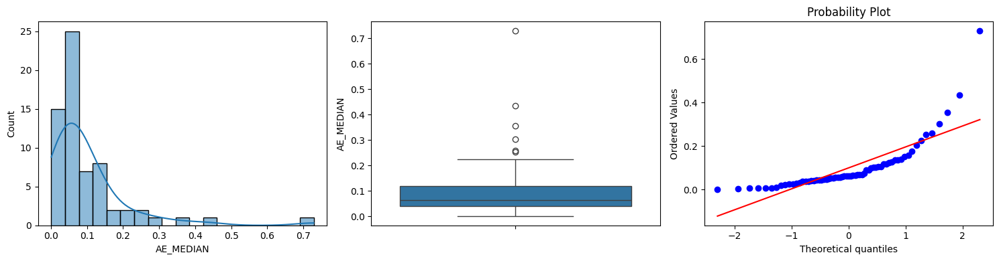

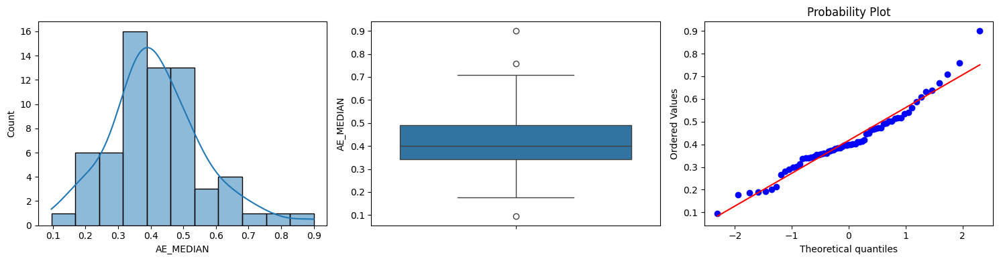

In [ ]:
# Applyig Gaussian Transformation:
AE_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_MEDIAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='AE_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=AE_MEDIAN_TRANSFORMED).visualize_feature(feature='AE_MEDIAN')

In [ ]:
# Counting Outliers:
AE_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('AE_MEDIAN')
AE_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_MEDIAN_TRANSFORMED).count_outliers('AE_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {AE_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_MEDIAN_TRANSFORMED['AE_MEDIAN'].skew()}")
print(f'Number of missing values: {AE_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 6
Number of outliers after Gaussian Transformation: 3
Outlier Coefficient: 0.6442064622385355
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_MEDIAN',
                                                                                               trans_method='cube_root')
X_TEST_AE_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='AE_MEDIAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_MEDIAN_TRANSFORMED)

### 12. ae_std:
- __Method used:__ cube_root:

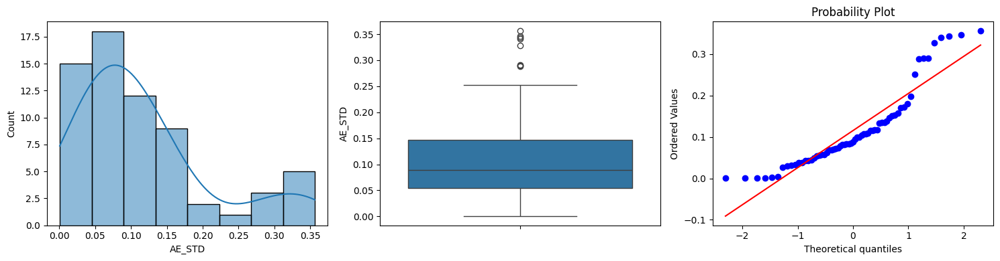

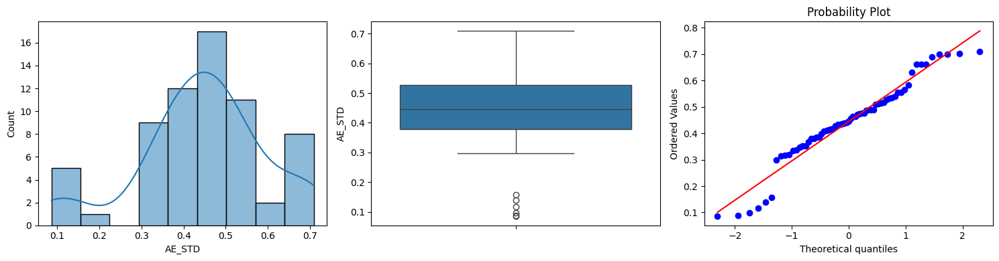

In [ ]:
# Applyig Gaussian Transformation:
AE_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_STD',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='AE_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=AE_STD_TRANSFORMED).visualize_feature(feature='AE_STD')

In [ ]:
# Counting Outliers:
AE_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('AE_STD')
AE_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=AE_STD_TRANSFORMED).count_outliers('AE_STD')
print(f'Number of outliers before Gaussian Transformation: {AE_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {AE_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {AE_STD_TRANSFORMED['AE_STD'].skew()}")
print(f'Number of missing values: {AE_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 6
Outlier Coefficient: -0.49673495166459447
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_AE_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='AE_STD',
                                                                                               trans_method='cube_root')
X_TEST_AE_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='AE_STD',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_AE_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_AE_STD_TRANSFORMED)

### 13. rm_max:
- __Applied Method:__ cube_root:

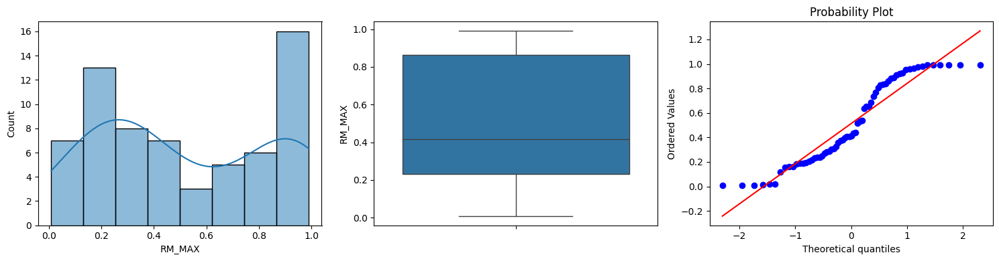

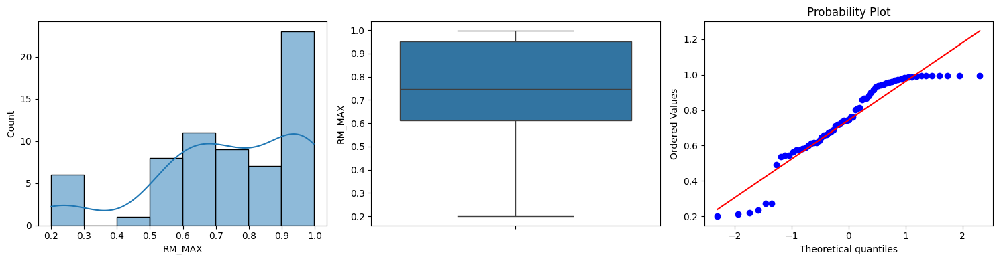

In [ ]:
# Applyig Gaussian Transformation:
RM_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_MAX',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='RM_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_MAX_TRANSFORMED).visualize_feature(feature='RM_MAX')

In [ ]:
# Counting Outliers:
RM_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('RM_MAX')
RM_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_MAX_TRANSFORMED).count_outliers('RM_MAX')
print(f'Number of outliers before Gaussian Transformation: {RM_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_MAX_TRANSFORMED['RM_MAX'].skew()}")
print(f'Number of missing values: {RM_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.8228240849078164
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_MAX',
                                                                                               trans_method='cube_root')
X_TEST_RM_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='RM_MAX',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_MAX_TRANSFORMED)

### 14. rm_min:
- __Applied Method:__ cube_root:

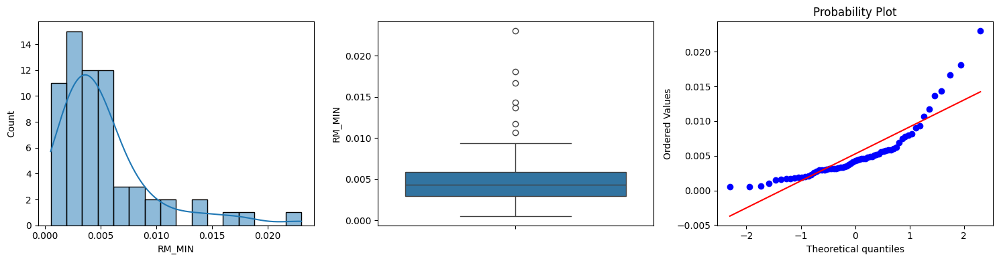

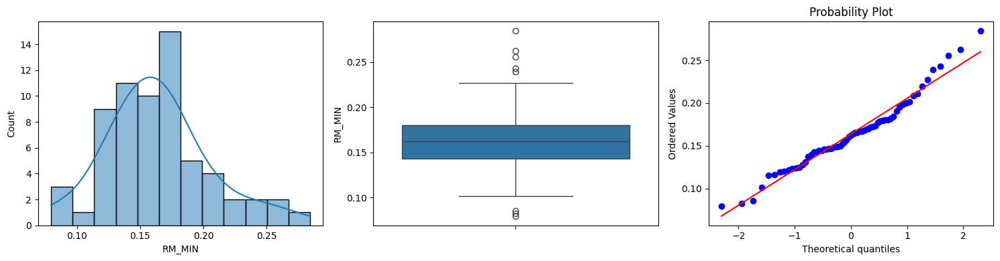

In [ ]:
# Applyig Gaussian Transformation:
RM_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_MIN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='RM_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_MIN_TRANSFORMED).visualize_feature(feature='RM_MIN')

In [ ]:
# Counting Outliers:
RM_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('RM_MIN')
RM_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_MIN_TRANSFORMED).count_outliers('RM_MIN')
print(f'Number of outliers before Gaussian Transformation: {RM_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_MIN_TRANSFORMED['RM_MIN'].skew()}")
print(f'Number of missing values: {RM_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 7
Number of outliers after Gaussian Transformation: 8
Outlier Coefficient: 0.5775686625618349
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_MIN',
                                                                                               trans_method='cube_root')
X_TEST_RM_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='RM_MIN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_MIN_TRANSFORMED)

### 15. rm_mean:
- __Applied Method:__ cube_root:

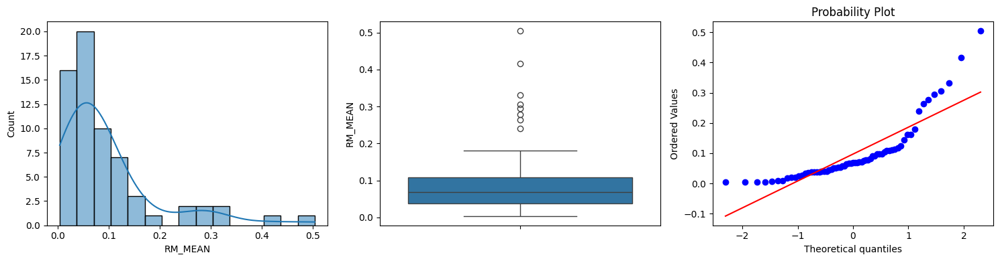

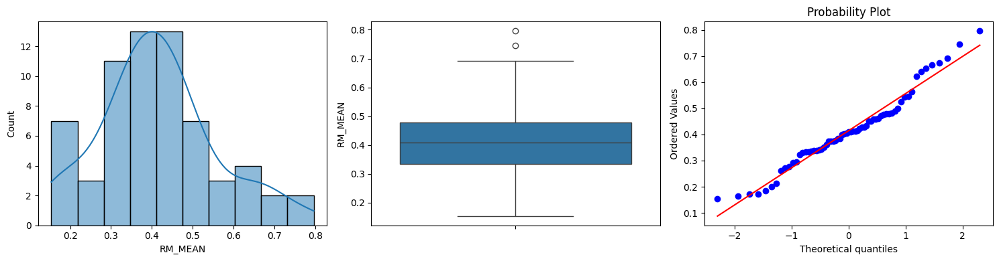

In [ ]:
# Applyig Gaussian Transformation:
RM_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_MEAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='RM_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_MEAN_TRANSFORMED).visualize_feature(feature='RM_MEAN')

In [ ]:
# Counting Outliers:
RM_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('RM_MEAN')
RM_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_MEAN_TRANSFORMED).count_outliers('RM_MEAN')
print(f'Number of outliers before Gaussian Transformation: {RM_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_MEAN_TRANSFORMED['RM_MEAN'].skew()}")
print(f'Number of missing values: {RM_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 2
Outlier Coefficient: 0.46945738993102626
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_MEAN',
                                                                                               trans_method='cube_root')
X_TEST_RM_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='RM_MEAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_MEAN_TRANSFORMED)

### 16. rm_median:
- __Applied Method:__ cube_root:

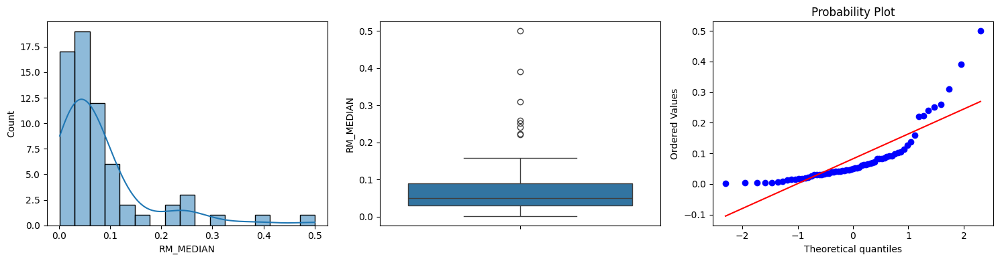

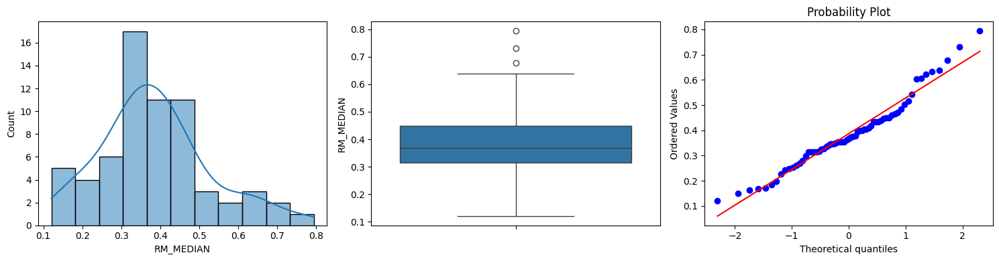

In [ ]:
# Applyig Gaussian Transformation:
RM_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_MEDIAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='RM_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_MEDIAN_TRANSFORMED).visualize_feature(feature='RM_MEDIAN')

In [ ]:
# Counting Outliers:
RM_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('RM_MEDIAN')
RM_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_MEDIAN_TRANSFORMED).count_outliers('RM_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {RM_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_MEDIAN_TRANSFORMED['RM_MEDIAN'].skew()}")
print(f'Number of missing values: {RM_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 3
Outlier Coefficient: 0.6317166108106885
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_MEDIAN',
                                                                                               trans_method='cube_root')
X_TEST_RM_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='RM_MEDIAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_MEDIAN_TRANSFORMED)

### 17. rm_std:
- __Applied Method:__ cube_root:

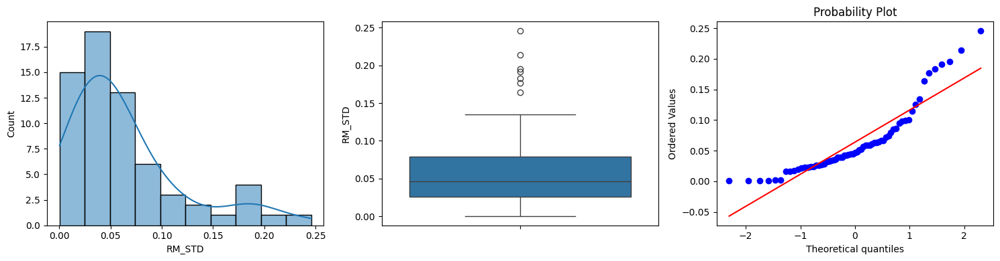

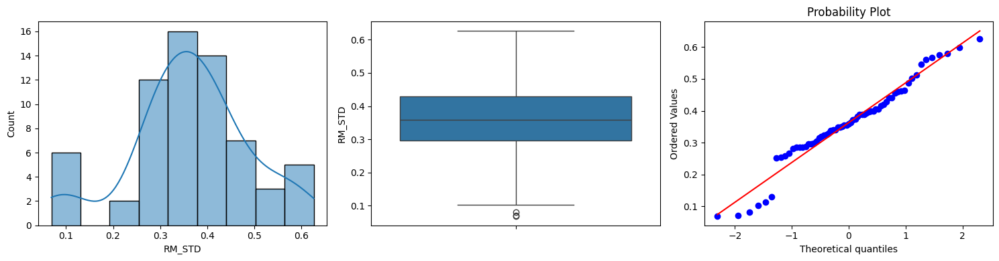

In [ ]:
# Applyig Gaussian Transformation:
RM_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_STD',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='RM_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=RM_STD_TRANSFORMED).visualize_feature(feature='RM_STD')

In [ ]:
# Counting Outliers:
RM_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('RM_STD')
RM_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=RM_STD_TRANSFORMED).count_outliers('RM_STD')
print(f'Number of outliers before Gaussian Transformation: {RM_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {RM_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {RM_STD_TRANSFORMED['RM_STD'].skew()}")
print(f'Number of missing values: {RM_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 7
Number of outliers after Gaussian Transformation: 3
Outlier Coefficient: -0.3202330701662423
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_RM_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='RM_STD',
                                                                                               trans_method='cube_root')
X_TEST_RM_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='RM_STD',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_RM_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_RM_STD_TRANSFORMED)

### 18. zcr:
- __Applied Method:__ exponential

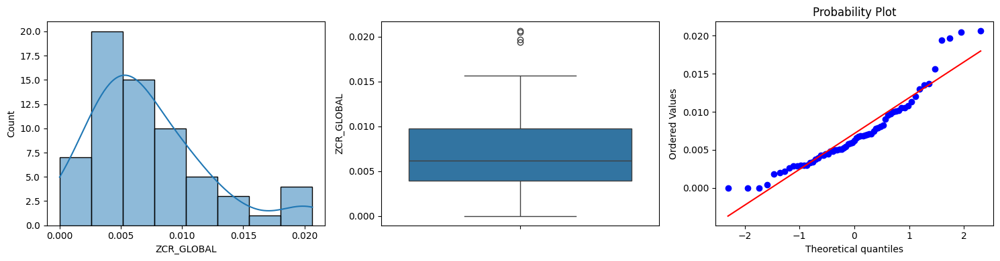

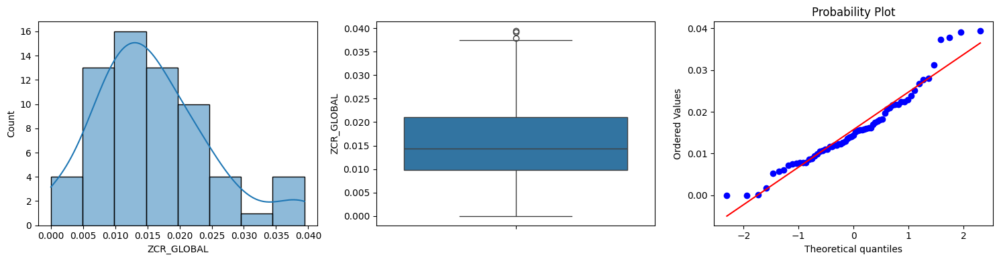

In [ ]:
# Applyig Gaussian Transformation:
ZCR_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_GLOBAL',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ZCR_GLOBAL')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_TRANSFORMED).visualize_feature(feature='ZCR_GLOBAL')

In [ ]:
# Counting Outliers:
ZCR_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ZCR_GLOBAL')
ZCR_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_TRANSFORMED).count_outliers('ZCR_GLOBAL')
print(f'Number of outliers before Gaussian Transformation: {ZCR_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_TRANSFORMED['ZCR_GLOBAL'].skew()}")
print(f'Number of missing values: {ZCR_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 4
Number of outliers after Gaussian Transformation: 3
Outlier Coefficient: 0.7872529229846115
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_GLOBAL',
                                                                                               trans_method='exponential')
X_TEST_ZCR_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ZCR_GLOBAL',
                                                                                             trans_method='exponential')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_TRANSFORMED)

### 19. zcr_max:
- __Applied Method:__ cube_root:

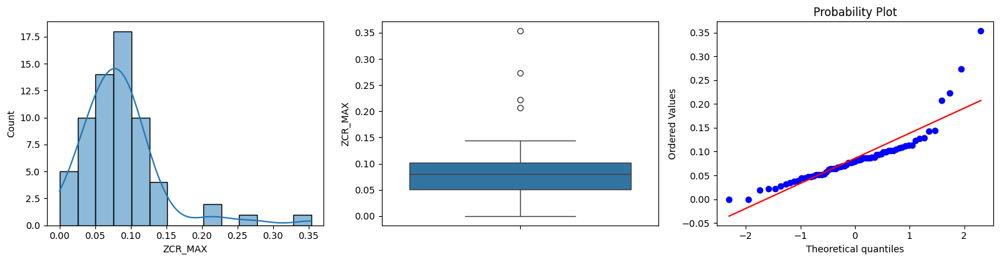

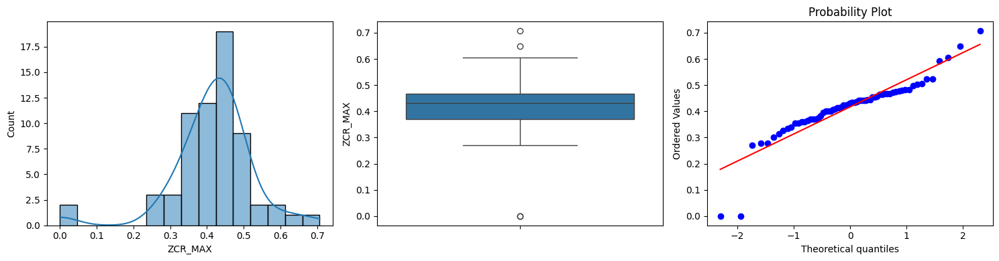

In [ ]:
# Applyig Gaussian Transformation:
ZCR_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_MAX',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ZCR_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_MAX_TRANSFORMED).visualize_feature(feature='ZCR_MAX')

In [ ]:
# Counting Outliers:
ZCR_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ZCR_MAX')
ZCR_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_MAX_TRANSFORMED).count_outliers('ZCR_MAX')
print(f'Number of outliers before Gaussian Transformation: {ZCR_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_MAX_TRANSFORMED['ZCR_MAX'].skew()}")
print(f'Number of missing values: {ZCR_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 4
Number of outliers after Gaussian Transformation: 4
Outlier Coefficient: -1.2599307072448207
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_MAX',
                                                                                               trans_method='cube_root')
X_TEST_ZCR_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ZCR_MAX',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_MAX_TRANSFORMED)

### 20. zcr_min:
- log

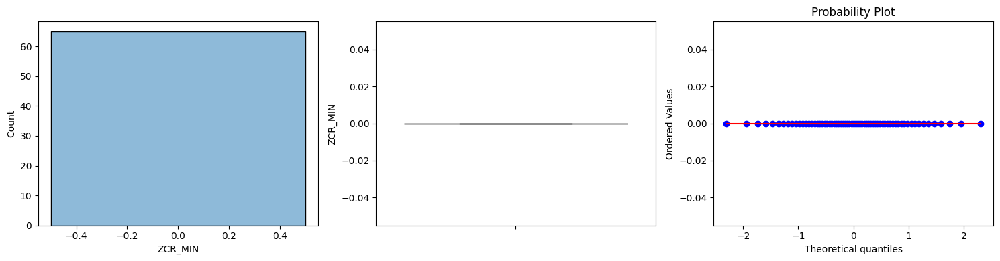

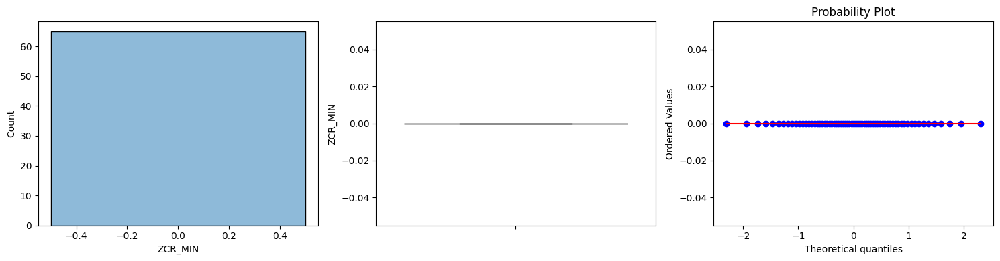

In [ ]:
# Applyig Gaussian Transformation:
ZCR_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_MIN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ZCR_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_MIN_TRANSFORMED).visualize_feature(feature='ZCR_MIN')

In [ ]:
# i won't add it as it zeros for all

### 21. zcr_mean:
- __Applied Method:__ cube_root:

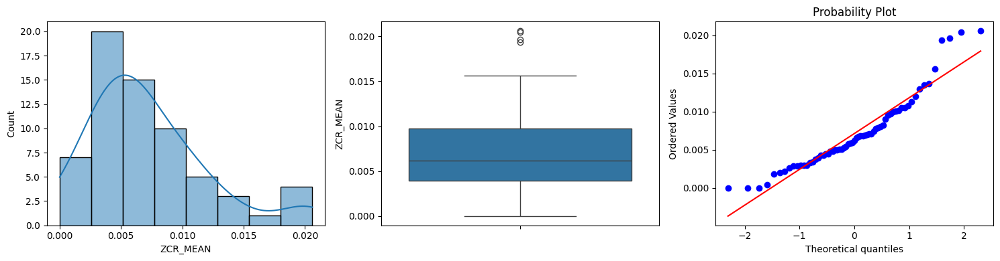

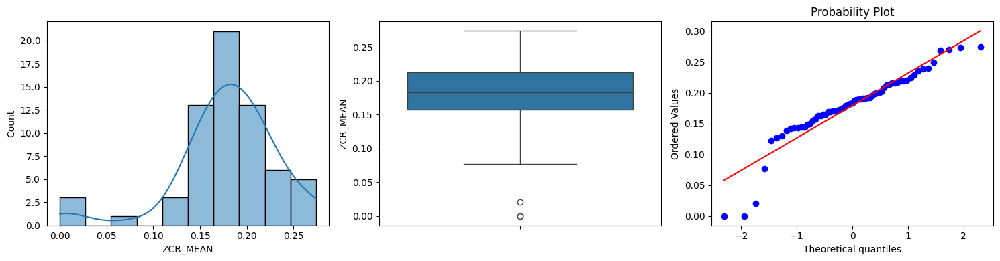

In [ ]:
# Applyig Gaussian Transformation:
ZCR_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_MEAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ZCR_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_MEAN_TRANSFORMED).visualize_feature(feature='ZCR_MEAN')

In [ ]:
# Counting Outliers:
ZCR_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ZCR_MEAN')
ZCR_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_MEAN_TRANSFORMED).count_outliers('ZCR_MEAN')
print(f'Number of outliers before Gaussian Transformation: {ZCR_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_MEAN_TRANSFORMED['ZCR_MEAN'].skew()}")
print(f'Number of missing values: {ZCR_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 4
Number of outliers after Gaussian Transformation: 3
Outlier Coefficient: -1.2647737658120546
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_MEAN',
                                                                                               trans_method='cube_root')
X_TEST_ZCR_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ZCR_MEAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_MEAN_TRANSFORMED)

### 22. zcr_median:
- __Applied Method:__ cube_root:

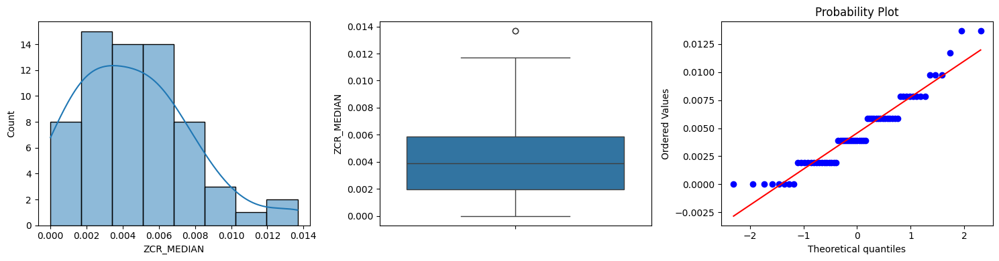

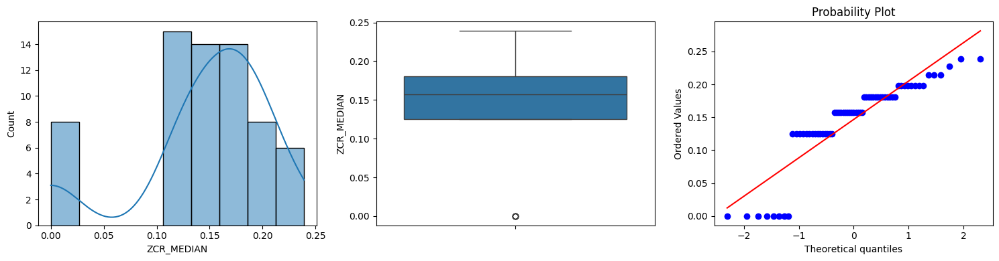

In [ ]:
# Applyig Gaussian Transformation:
ZCR_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_MEDIAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ZCR_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_MEDIAN_TRANSFORMED).visualize_feature(feature='ZCR_MEDIAN')

In [ ]:
# Counting Outliers:
ZCR_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ZCR_MEDIAN')
ZCR_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_MEDIAN_TRANSFORMED).count_outliers('ZCR_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {ZCR_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_MEDIAN_TRANSFORMED['ZCR_MEDIAN'].skew()}")
print(f'Number of missing values: {ZCR_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 2
Number of outliers after Gaussian Transformation: 8
Outlier Coefficient: -1.3312270371779569
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_MEDIAN',
                                                                                               trans_method='none')
X_TEST_ZCR_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ZCR_MEDIAN',
                                                                                             trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_MEDIAN_TRANSFORMED)

### 23. zcr_std:
- __Applied Method:__ cube_root:

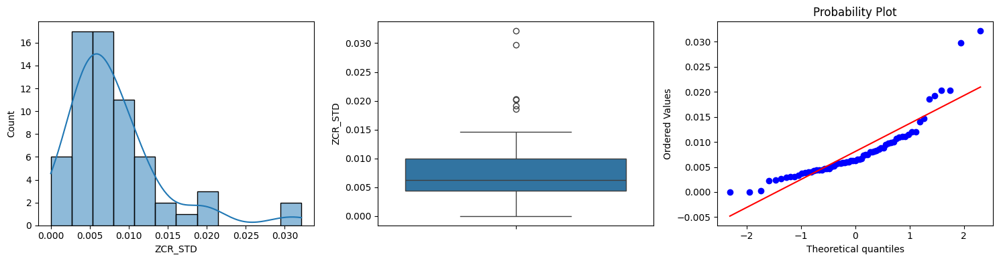

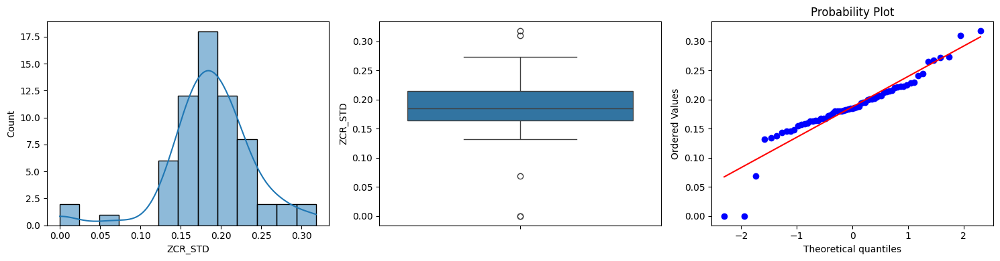

In [ ]:
# Applyig Gaussian Transformation:
ZCR_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_STD',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='ZCR_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=ZCR_STD_TRANSFORMED).visualize_feature(feature='ZCR_STD')

In [ ]:
# Counting Outliers:
ZCR_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('ZCR_STD')
ZCR_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=ZCR_STD_TRANSFORMED).count_outliers('ZCR_STD')
print(f'Number of outliers before Gaussian Transformation: {ZCR_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {ZCR_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {ZCR_STD_TRANSFORMED['ZCR_STD'].skew()}")
print(f'Number of missing values: {ZCR_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 6
Number of outliers after Gaussian Transformation: 5
Outlier Coefficient: -0.8900369481447671
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_ZCR_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='ZCR_STD',
                                                                                               trans_method='cube_root')
X_TEST_ZCR_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='ZCR_STD',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_ZCR_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_ZCR_STD_TRANSFORMED)

### 24. peak_amplitude:
- __Applied Method:__ log:

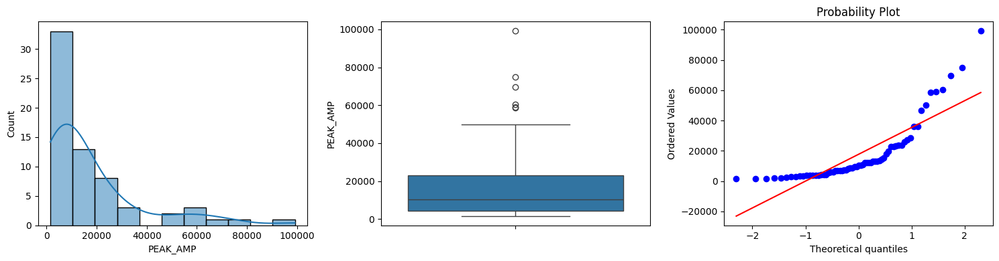

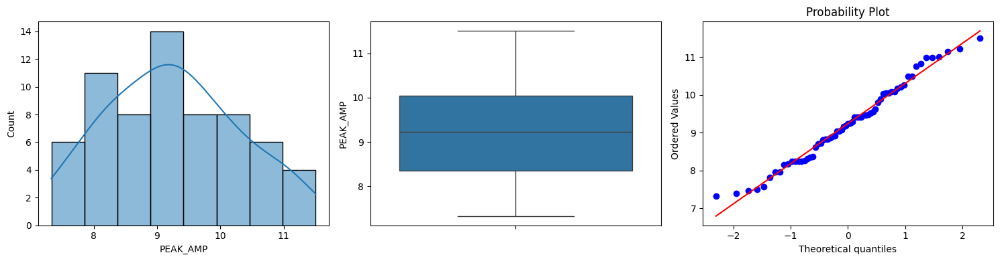

In [ ]:
# Applyig Gaussian Transformation:
PEAK_AMP_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='PEAK_AMP',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='PEAK_AMP')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=PEAK_AMP_TRANSFORMED).visualize_feature(feature='PEAK_AMP')

In [ ]:
# Counting Outliers:
PEAK_AMP_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('PEAK_AMP')
PEAK_AMP_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=PEAK_AMP_TRANSFORMED).count_outliers('PEAK_AMP')
print(f'Number of outliers before Gaussian Transformation: {PEAK_AMP_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {PEAK_AMP_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {PEAK_AMP_TRANSFORMED['PEAK_AMP'].skew()}")
print(f'Number of missing values: {PEAK_AMP_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 6
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.18373323433389974
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_PEAK_AMP_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='PEAK_AMP',
                                                                                               trans_method='log')
X_TEST_PEAK_AMP_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='PEAK_AMP',
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_PEAK_AMP_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_PEAK_AMP_TRANSFORMED)

### 25. peak_frequency:
- __Applied Method:__ log:

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


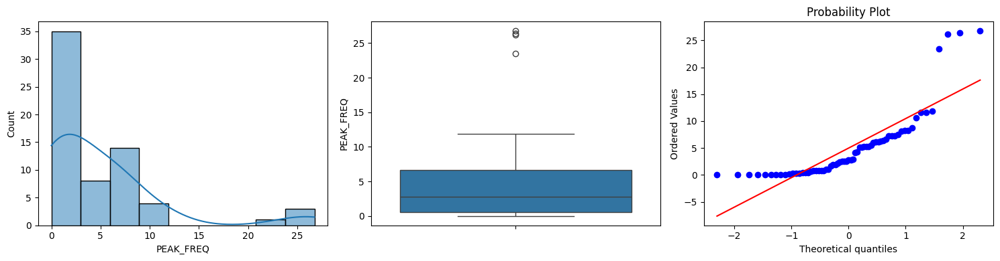

/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2767: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


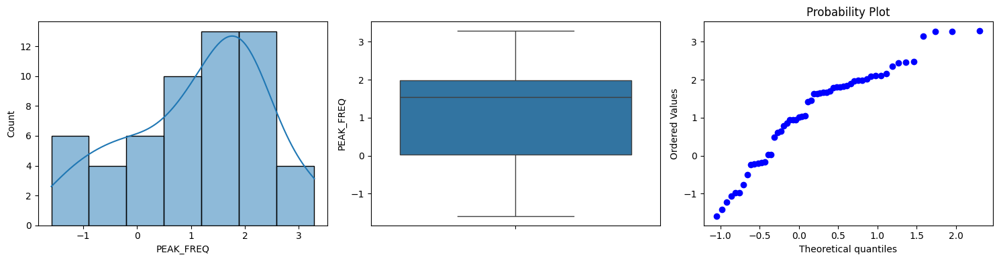

In [ ]:
# Applyig Gaussian Transformation:
PEAK_FREQ_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='PEAK_FREQ',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='PEAK_FREQ')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=PEAK_FREQ_TRANSFORMED).visualize_feature(feature='PEAK_FREQ')

In [ ]:
# Counting Outliers:
PEAK_FREQ_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('PEAK_FREQ')
PEAK_FREQ_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=PEAK_FREQ_TRANSFORMED).count_outliers('PEAK_FREQ')
print(f'Number of outliers before Gaussian Transformation: {PEAK_FREQ_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {PEAK_FREQ_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {PEAK_FREQ_TRANSFORMED['PEAK_FREQ'].skew()}")
print(f'Number of missing values: {PEAK_FREQ_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 4
Number of outliers after Gaussian Transformation: 9
Outlier Coefficient: nan
Number of missing values: 0


/usr/local/lib/python3.11/dist-packages/pandas/core/nanops.py:1256: RuntimeWarning: invalid value encountered in subtract
  adjusted = values - mean


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_PEAK_FREQ_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='PEAK_FREQ',
                                                                                               trans_method='none')
X_TEST_PEAK_FREQ_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='PEAK_FREQ',
                                                                                             trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_PEAK_FREQ_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_PEAK_FREQ_TRANSFORMED)

### 26. ber_max:
- __Applied Method:__ log:

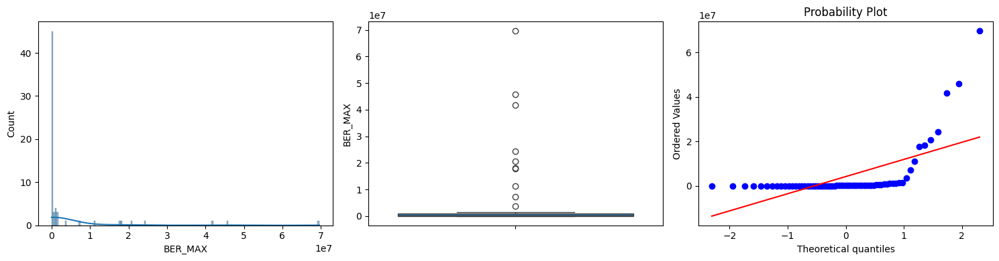

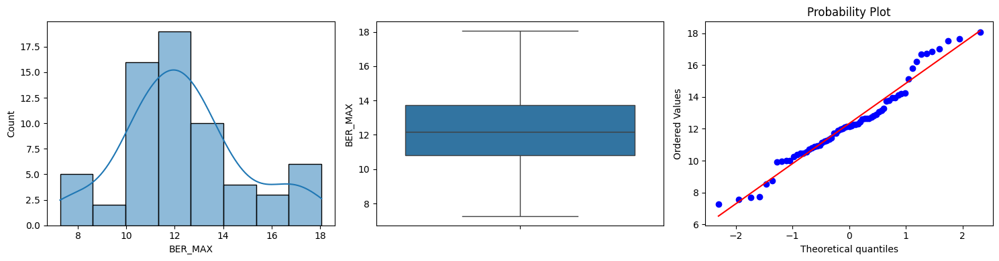

In [ ]:
# Applyig Gaussian Transformation:
BER_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_MAX',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='BER_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_MAX_TRANSFORMED).visualize_feature(feature='BER_MAX')

In [ ]:
# Counting Outliers:
BER_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('BER_MAX')
BER_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_MAX_TRANSFORMED).count_outliers('BER_MAX')
print(f'Number of outliers before Gaussian Transformation: {BER_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_MAX_TRANSFORMED['BER_MAX'].skew()}")
print(f'Number of missing values: {BER_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 10
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.353827749491387
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_MAX',
                                                                                               trans_method='log')
X_TEST_BER_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='BER_MAX',
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_MAX_TRANSFORMED)

### 27. ber_min:
- __Applied Method:__ log:

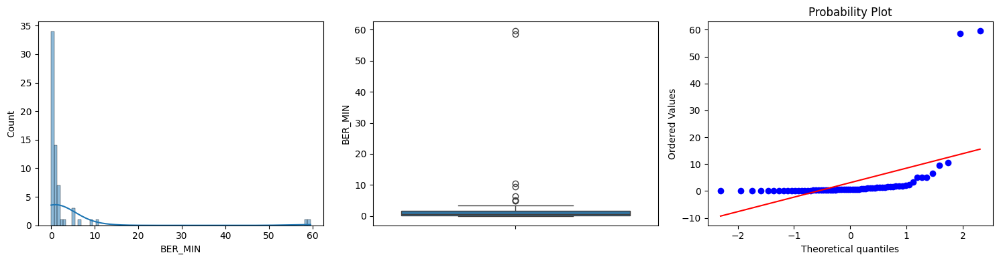

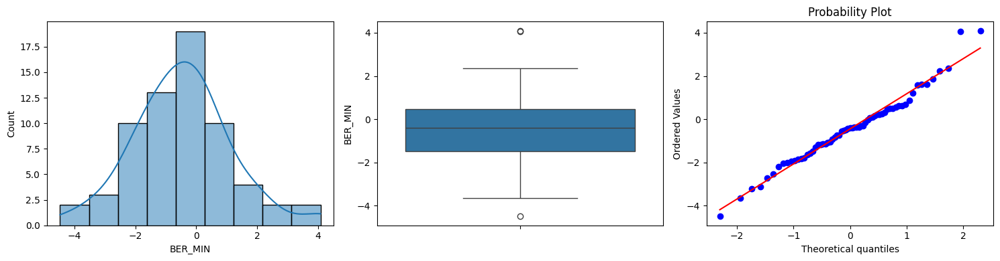

In [ ]:
# Applyig Gaussian Transformation:
BER_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_MIN',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='BER_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_MIN_TRANSFORMED).visualize_feature(feature='BER_MIN')

In [ ]:
# Counting Outliers:
BER_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('BER_MIN')
BER_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_MIN_TRANSFORMED).count_outliers('BER_MIN')
print(f'Number of outliers before Gaussian Transformation: {BER_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_MIN_TRANSFORMED['BER_MIN'].skew()}")
print(f'Number of missing values: {BER_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 3
Outlier Coefficient: 0.3405433231943547
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_MIN',
                                                                                               trans_method='log')
X_TEST_BER_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='BER_MIN',
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_MIN_TRANSFORMED)

### 28. ber_mean:
- __Applied Method:__ log:

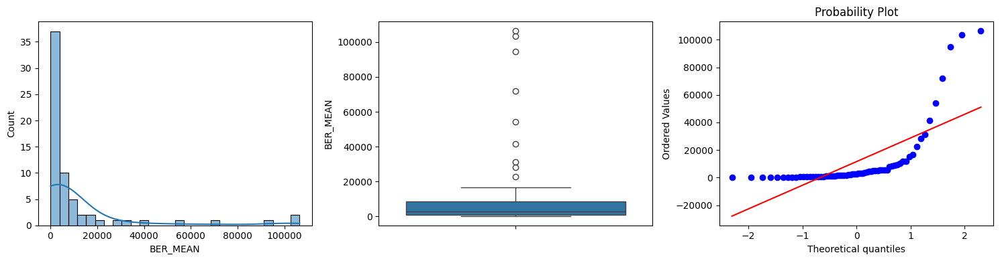

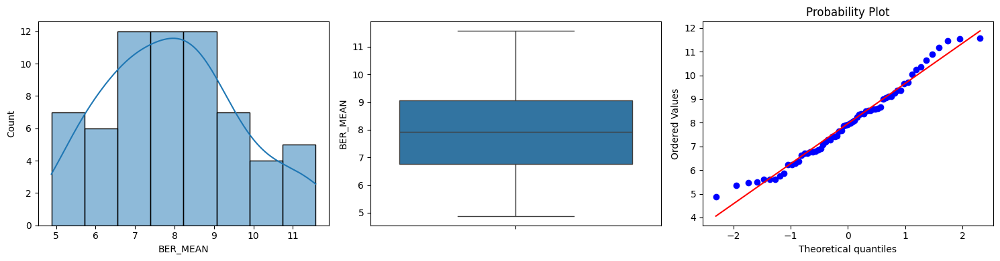

In [ ]:
# Applyig Gaussian Transformation:
BER_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_MEAN',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='BER_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_MEAN_TRANSFORMED).visualize_feature(feature='BER_MEAN')

In [ ]:
# Counting Outliers:
BER_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('BER_MEAN')
BER_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_MEAN_TRANSFORMED).count_outliers('BER_MEAN')
print(f'Number of outliers before Gaussian Transformation: {BER_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_MEAN_TRANSFORMED['BER_MEAN'].skew()}")
print(f'Number of missing values: {BER_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 9
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.3380394238416132
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_MEAN',
                                                                                               trans_method='log')
X_TEST_BER_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='BER_MEAN',
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_MEAN_TRANSFORMED)

### 29. ber_median:
- __Applied Method:__ log:

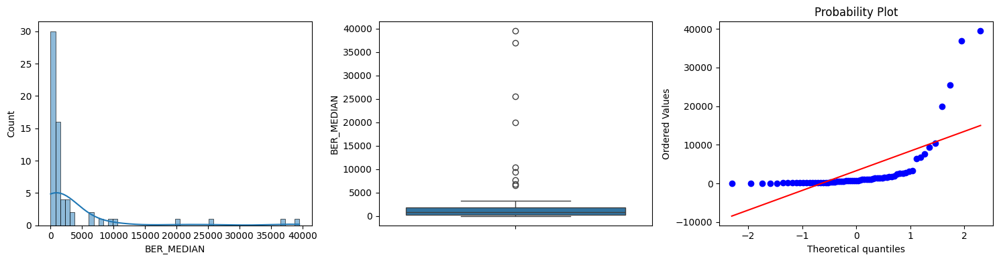

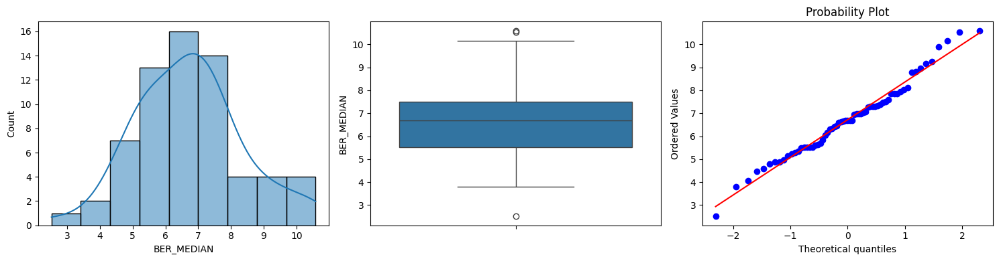

In [ ]:
# Applyig Gaussian Transformation:
BER_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_MEDIAN',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='BER_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_MEDIAN_TRANSFORMED).visualize_feature(feature='BER_MEDIAN')

In [ ]:
# Counting Outliers:
BER_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('BER_MEDIAN')
BER_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_MEDIAN_TRANSFORMED).count_outliers('BER_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {BER_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_MEDIAN_TRANSFORMED['BER_MEDIAN'].skew()}")
print(f'Number of missing values: {BER_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 9
Number of outliers after Gaussian Transformation: 3
Outlier Coefficient: 0.2575122037733429
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_MEDIAN',
                                                                                               trans_method='log')
X_TEST_BER_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='BER_MEDIAN',
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_MEDIAN_TRANSFORMED)

### 30. ber_std:
- __Applied Method:__ log:

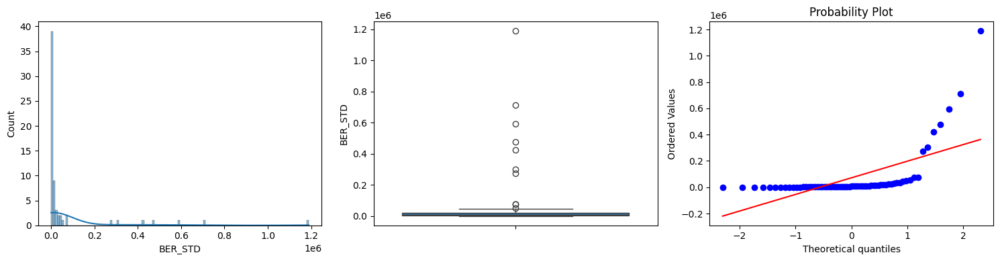

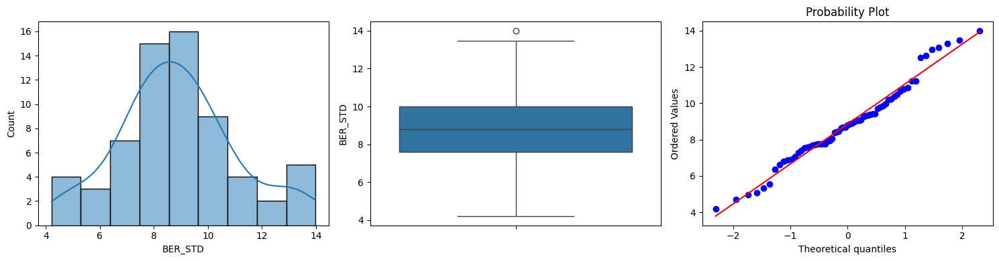

In [ ]:
# Applyig Gaussian Transformation:
BER_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_STD',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='BER_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=BER_STD_TRANSFORMED).visualize_feature(feature='BER_STD')

In [ ]:
# Counting Outliers:
BER_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('BER_STD')
BER_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=BER_STD_TRANSFORMED).count_outliers('BER_STD')
print(f'Number of outliers before Gaussian Transformation: {BER_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {BER_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {BER_STD_TRANSFORMED['BER_STD'].skew()}")
print(f'Number of missing values: {BER_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 10
Number of outliers after Gaussian Transformation: 1
Outlier Coefficient: 0.28673597950601915
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_BER_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='BER_STD',
                                                                                               trans_method='log')
X_TEST_BER_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='BER_STD',
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_BER_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_BER_STD_TRANSFORMED)

### 31. sc_max:
- __Applied Method:__ log:

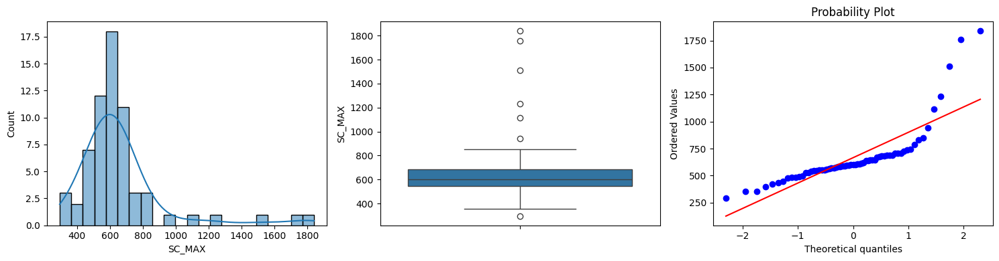

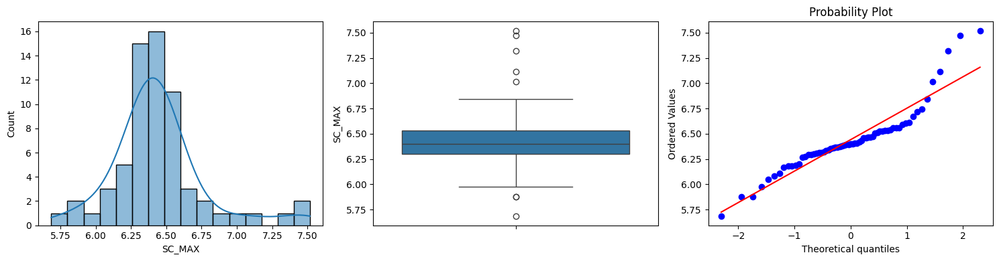

In [ ]:
# Applyig Gaussian Transformation:
SC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SC_MAX',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SC_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_MAX_TRANSFORMED).visualize_feature(feature='SC_MAX')

In [ ]:
# Counting Outliers:
SC_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SC_MAX')
SC_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_MAX_TRANSFORMED).count_outliers('SC_MAX')
print(f'Number of outliers before Gaussian Transformation: {SC_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_MAX_TRANSFORMED['SC_MAX'].skew()}")
print(f'Number of missing values: {SC_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 7
Number of outliers after Gaussian Transformation: 8
Outlier Coefficient: 1.1835698730527922
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_SC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SC_MAX',
                                                                                               trans_method='log')
X_TEST_SC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='SC_MAX',
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_SC_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_SC_MAX_TRANSFORMED)

### 32. sc_min:
- __Applied Method:__ No method:

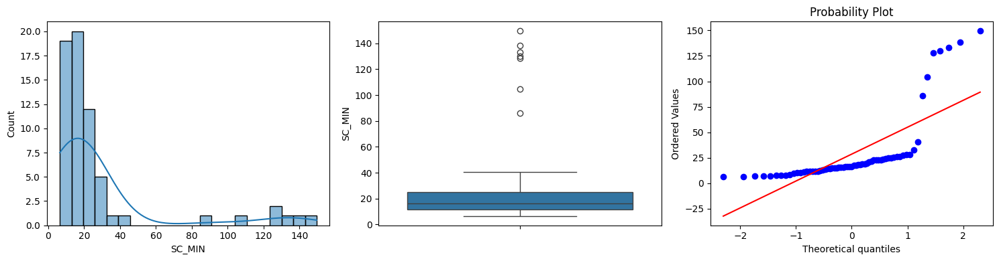

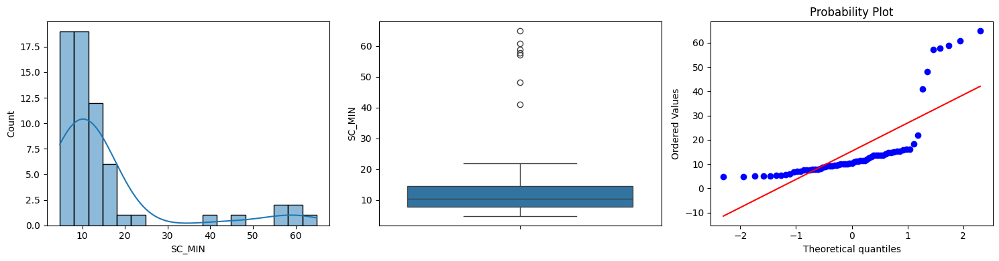

In [ ]:
# Applyig Gaussian Transformation:
SC_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SC_MIN',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SC_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_MIN_TRANSFORMED).visualize_feature(feature='SC_MIN')

In [ ]:
# Counting Outliers:
SC_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SC_MIN')
SC_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_MIN_TRANSFORMED).count_outliers('SC_MIN')
print(f'Number of outliers before Gaussian Transformation: {SC_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_MIN_TRANSFORMED['SC_MIN'].skew()}")
print(f'Number of missing values: {SC_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 7
Number of outliers after Gaussian Transformation: 7
Outlier Coefficient: 2.43695017689553
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['SC_MIN'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['SC_MIN'])

### 33. sc_mean:
- __Applied Method:__ No method:

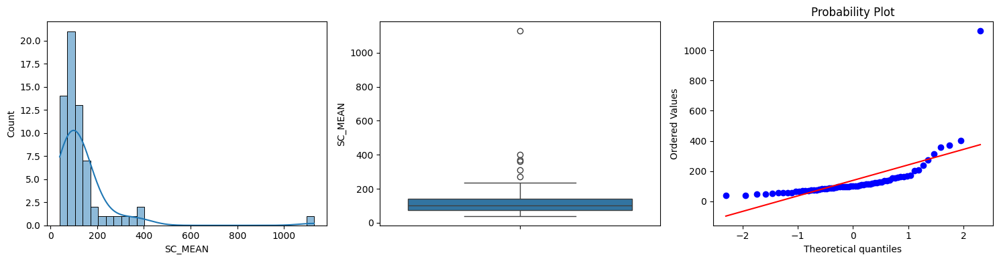

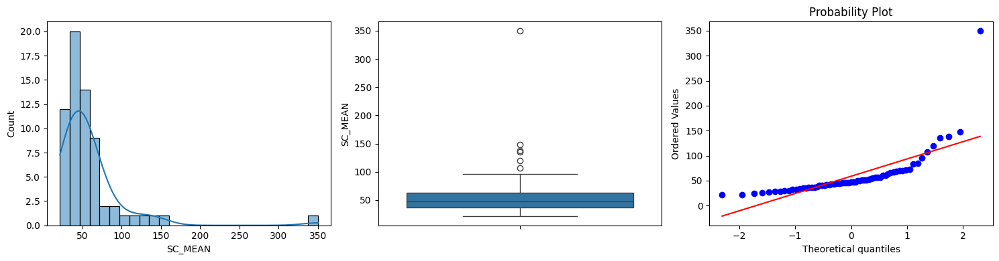

In [ ]:
# Applyig Gaussian Transformation:
SC_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SC_MEAN',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SC_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_MEAN_TRANSFORMED).visualize_feature(feature='SC_MEAN')

In [ ]:
# Counting Outliers:
SC_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SC_MEAN')
SC_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_MEAN_TRANSFORMED).count_outliers('SC_MEAN')
print(f'Number of outliers before Gaussian Transformation: {SC_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_MEAN_TRANSFORMED['SC_MEAN'].skew()}")
print(f'Number of missing values: {SC_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 6
Number of outliers after Gaussian Transformation: 6
Outlier Coefficient: 4.462230751416878
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['SC_MEAN'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['SC_MEAN'])

### 34. sc_median:
- __Applied Method:__ No method:

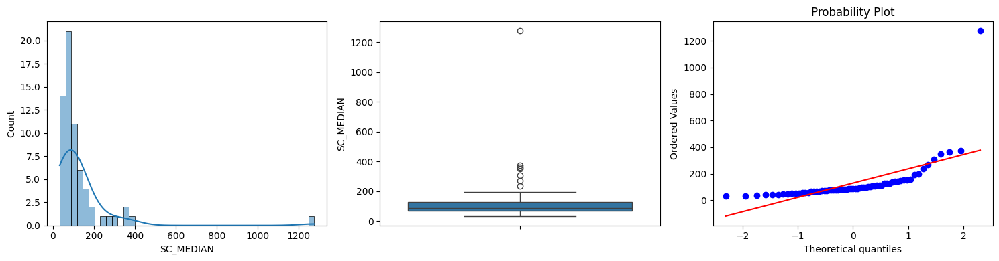

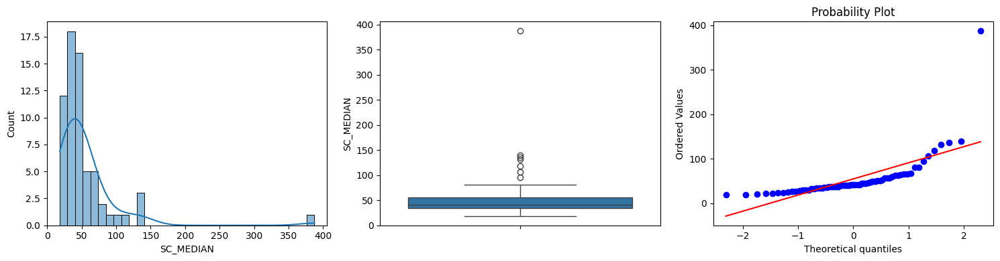

In [ ]:
# Applyig Gaussian Transformation:
SC_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SC_MEDIAN',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SC_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_MEDIAN_TRANSFORMED).visualize_feature(feature='SC_MEDIAN')

In [ ]:
# Counting Outliers:
SC_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SC_MEDIAN')
SC_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_MEDIAN_TRANSFORMED).count_outliers('SC_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {SC_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_MEDIAN_TRANSFORMED['SC_MEDIAN'].skew()}")
print(f'Number of missing values: {SC_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 7
Number of outliers after Gaussian Transformation: 7
Outlier Coefficient: 4.927370685675901
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['SC_MEDIAN'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['SC_MEDIAN'])

### 35. sc_std:
- __Applied Method:__ log:

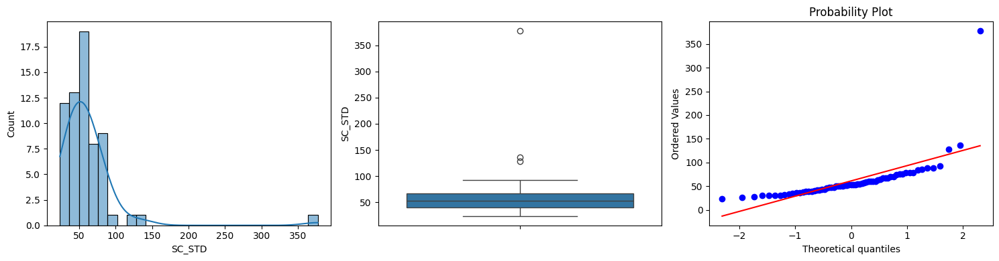

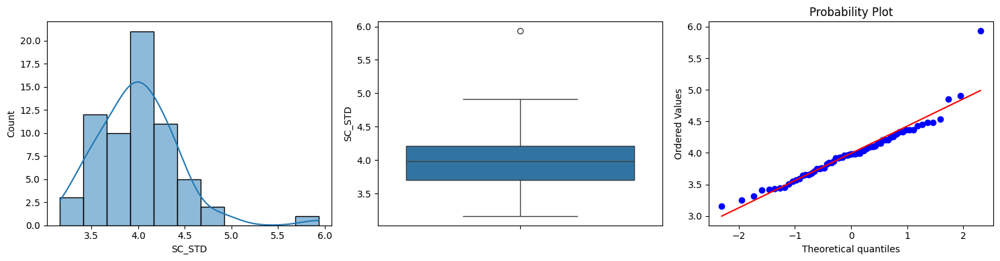

In [ ]:
# Applyig Gaussian Transformation:
SC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SC_STD',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SC_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SC_STD_TRANSFORMED).visualize_feature(feature='SC_STD')

In [ ]:
# Counting Outliers:
SC_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SC_STD')
SC_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SC_STD_TRANSFORMED).count_outliers('SC_STD')
print(f'Number of outliers before Gaussian Transformation: {SC_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SC_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SC_STD_TRANSFORMED['SC_STD'].skew()}")
print(f'Number of missing values: {SC_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 3
Number of outliers after Gaussian Transformation: 1
Outlier Coefficient: 1.2773993196485398
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_SC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SC_STD',
                                                                                               trans_method='log')
X_TEST_SC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='SC_STD',
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_SC_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_SC_STD_TRANSFORMED)

### 36. sb_max:
- __Applied Method:__ Does not require:

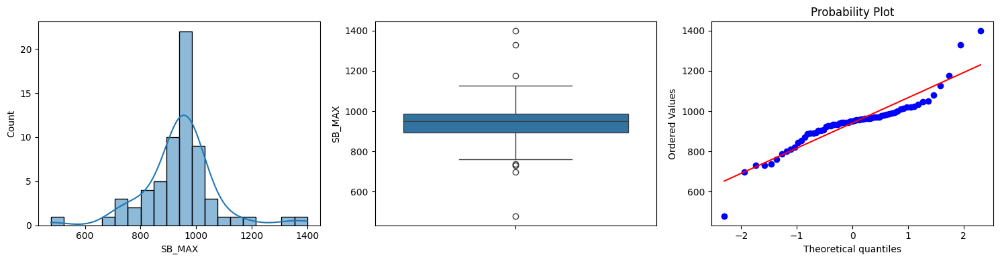

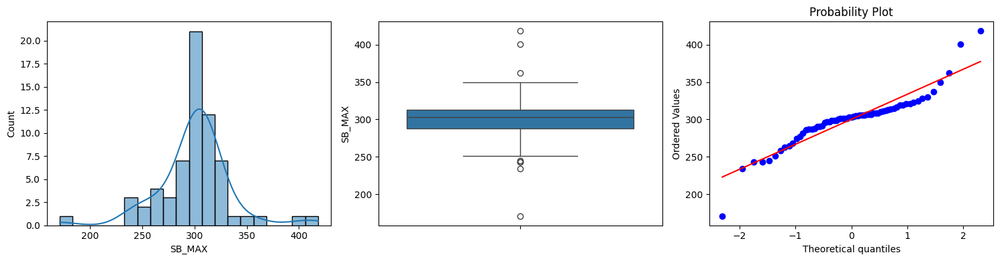

In [ ]:
# Applyig Gaussian Transformation:
SB_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SB_MAX',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SB_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_MAX_TRANSFORMED).visualize_feature(feature='SB_MAX')

In [ ]:
# Counting Outliers:
SB_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SB_MAX')
SB_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_MAX_TRANSFORMED).count_outliers('SB_MAX')
print(f'Number of outliers before Gaussian Transformation: {SB_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_MAX_TRANSFORMED['SB_MAX'].skew()}")
print(f'Number of missing values: {SB_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 8
Outlier Coefficient: -0.06141541445759401
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['SB_MAX'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['SB_MAX'])

### 37. sb_min:
- __Applied Method:__ No mehtod:

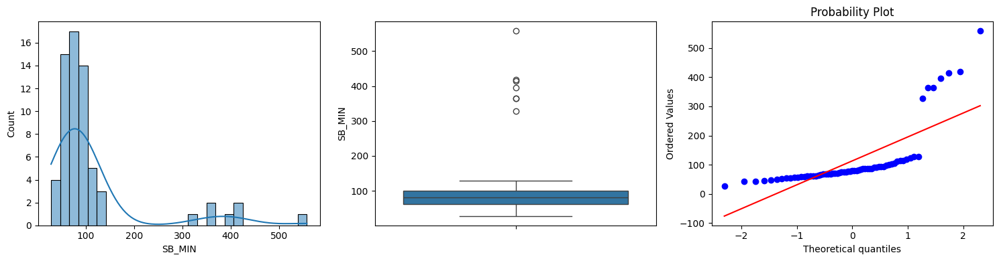

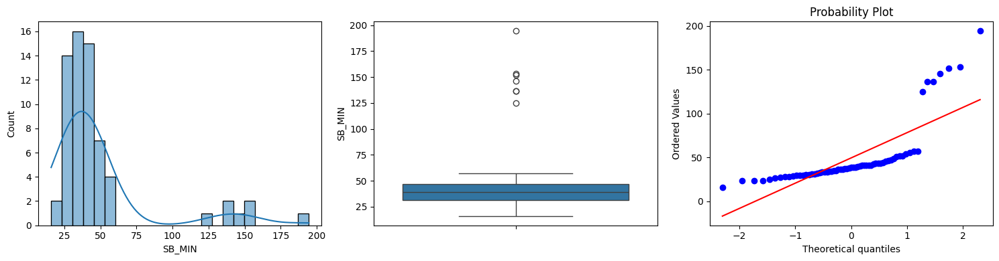

In [ ]:
# Applyig Gaussian Transformation:
SB_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SB_MIN',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SB_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_MIN_TRANSFORMED).visualize_feature(feature='SB_MIN')

In [ ]:
# Counting Outliers:
SB_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SB_MIN')
SB_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_MIN_TRANSFORMED).count_outliers('SB_MIN')
print(f'Number of outliers before Gaussian Transformation: {SB_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_MIN_TRANSFORMED['SB_MIN'].skew()}")
print(f'Number of missing values: {SB_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 7
Number of outliers after Gaussian Transformation: 7
Outlier Coefficient: 2.5127187920452996
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['SB_MIN'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['SB_MIN'])

### 38. sb_mean:
- __Applied Method:__ No method:

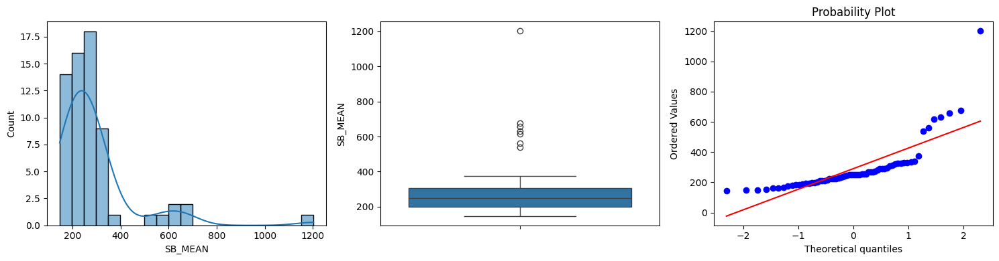

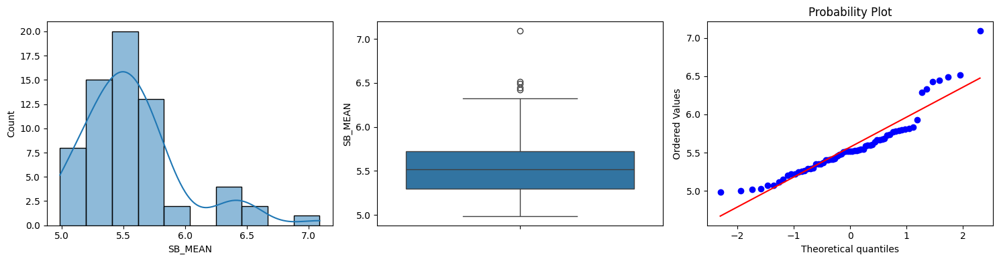

In [ ]:
# Applyig Gaussian Transformation:
SB_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SB_MEAN',
                                                                                       trans_method='log')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SB_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_MEAN_TRANSFORMED).visualize_feature(feature='SB_MEAN')

In [ ]:
# Counting Outliers:
SB_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SB_MEAN')
SB_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_MEAN_TRANSFORMED).count_outliers('SB_MEAN')
print(f'Number of outliers before Gaussian Transformation: {SB_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_MEAN_TRANSFORMED['SB_MEAN'].skew()}")
print(f'Number of missing values: {SB_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 7
Number of outliers after Gaussian Transformation: 5
Outlier Coefficient: 1.3933315427464517
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_SB_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SB_MEAN',
                                                                                               trans_method='log')
X_TEST_SB_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='SB_MEAN',
                                                                                             trans_method='log')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_SB_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_SB_MEAN_TRANSFORMED)

### 39. sb_median:
- __Applied Method:__ No method:

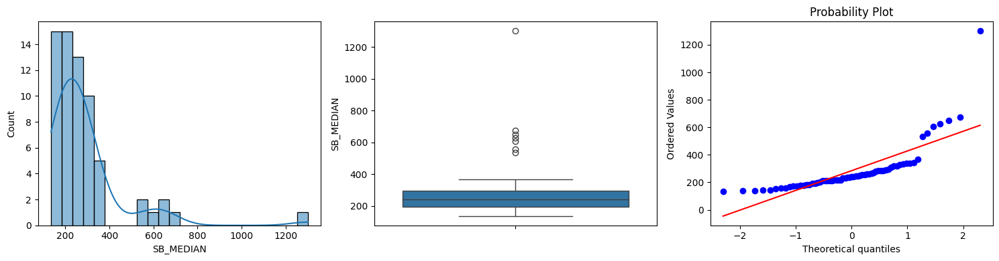

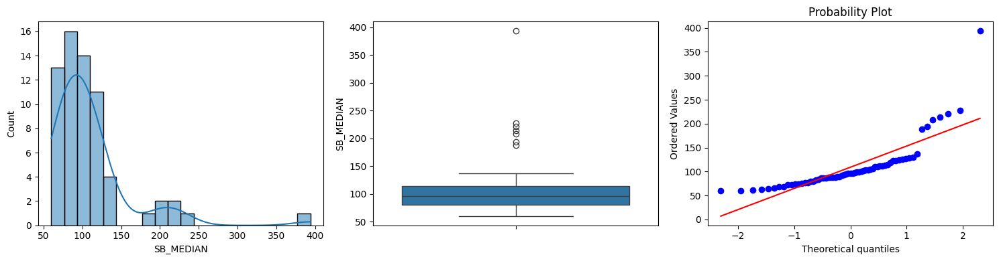

In [ ]:
# Applyig Gaussian Transformation:
SB_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SB_MEDIAN',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SB_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_MEDIAN_TRANSFORMED).visualize_feature(feature='SB_MEDIAN')

In [ ]:
# Counting Outliers:
SB_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SB_MEDIAN')
SB_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_MEDIAN_TRANSFORMED).count_outliers('SB_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {SB_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_MEDIAN_TRANSFORMED['SB_MEDIAN'].skew()}")
print(f'Number of missing values: {SB_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 7
Number of outliers after Gaussian Transformation: 7
Outlier Coefficient: 3.0853424778780347
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['SB_MEDIAN'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['SB_MEDIAN'])

### 40. sb_std:
- __Applied Method:__ square_root:

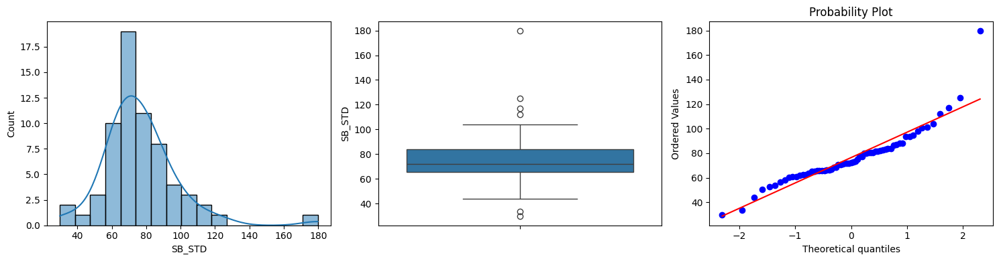

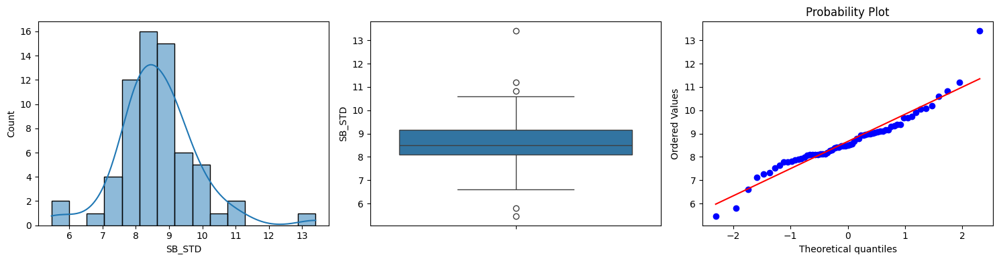

In [ ]:
# Applyig Gaussian Transformation:
SB_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SB_STD',
                                                                                       trans_method='square_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='SB_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=SB_STD_TRANSFORMED).visualize_feature(feature='SB_STD')

In [ ]:
# Counting Outliers:
SB_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('SB_STD')
SB_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=SB_STD_TRANSFORMED).count_outliers('SB_STD')
print(f'Number of outliers before Gaussian Transformation: {SB_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {SB_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {SB_STD_TRANSFORMED['SB_STD'].skew()}")
print(f'Number of missing values: {SB_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 6
Number of outliers after Gaussian Transformation: 5
Outlier Coefficient: 0.7136742957818168
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_SB_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='SB_STD',
                                                                                               trans_method='square_root')
X_TEST_SB_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='SB_STD',
                                                                                             trans_method='square_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_SB_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_SB_STD_TRANSFORMED)

### 41. mfcc_max:
- __Applied Method:__ No method:

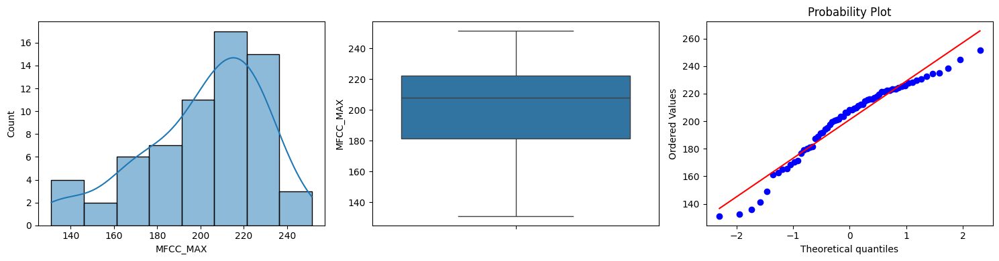

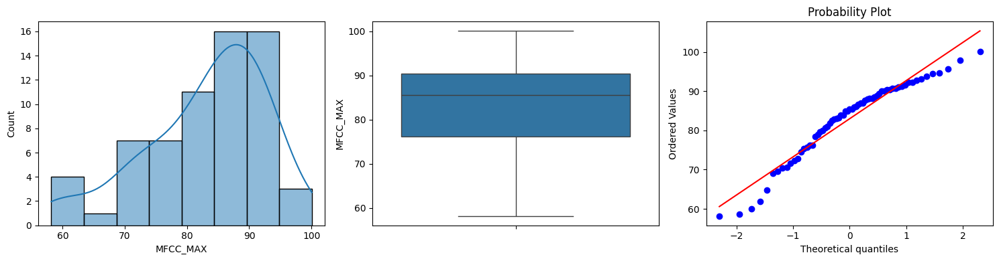

In [ ]:
# Applyig Gaussian Transformation:
MFCC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MFCC_MAX',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='MFCC_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_MAX_TRANSFORMED).visualize_feature(feature='MFCC_MAX')

In [ ]:
# Counting Outliers:
MFCC_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('MFCC_MAX')
MFCC_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_MAX_TRANSFORMED).count_outliers('MFCC_MAX')
print(f'Number of outliers before Gaussian Transformation: {MFCC_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_MAX_TRANSFORMED['MFCC_MAX'].skew()}")
print(f'Number of missing values: {MFCC_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.8250263338731348
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_MFCC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MFCC_MAX',
                                                                                               trans_method='exponential')
X_TEST_MFCC_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='MFCC_MAX',
                                                                                             trans_method='exponential')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_MFCC_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_MFCC_MAX_TRANSFORMED)

### 42. mfcc_min:
__Applied Method:__ No method

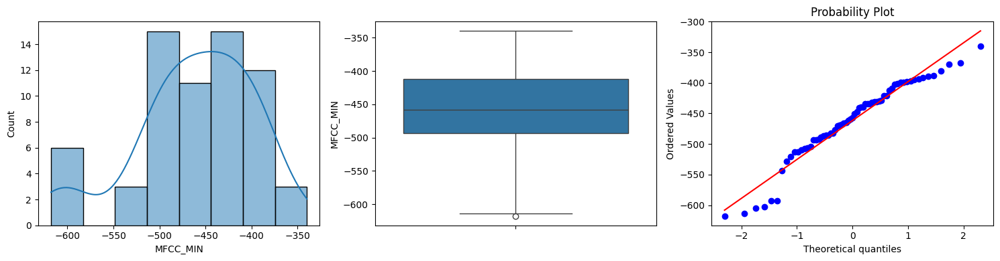

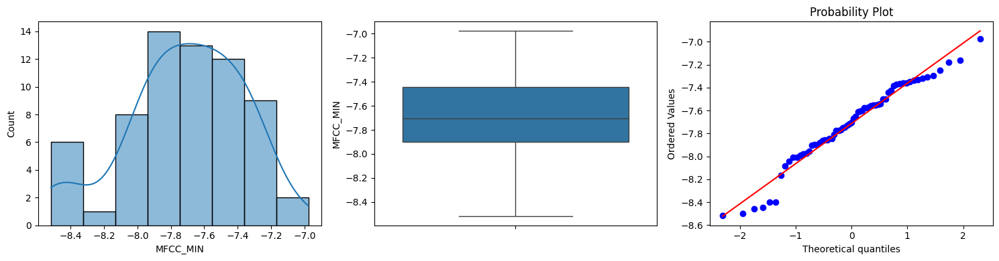

In [ ]:
# Applyig Gaussian Transformation:
MFCC_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MFCC_MIN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='MFCC_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_MIN_TRANSFORMED).visualize_feature(feature='MFCC_MIN')

In [ ]:
# Counting Outliers:
MFCC_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('MFCC_MIN')
MFCC_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_MIN_TRANSFORMED).count_outliers('MFCC_MIN')
print(f'Number of outliers before Gaussian Transformation: {MFCC_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_MIN_TRANSFORMED['MFCC_MIN'].skew()}")
print(f'Number of missing values: {MFCC_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 1
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.4994329985476944
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_MFCC_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MFCC_MIN',
                                                                                               trans_method='cube_root')
X_TEST_MFCC_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='MFCC_MIN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_MFCC_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_MFCC_MIN_TRANSFORMED)

### 43. mfcc_mean:
- __Applied Method:__ log:

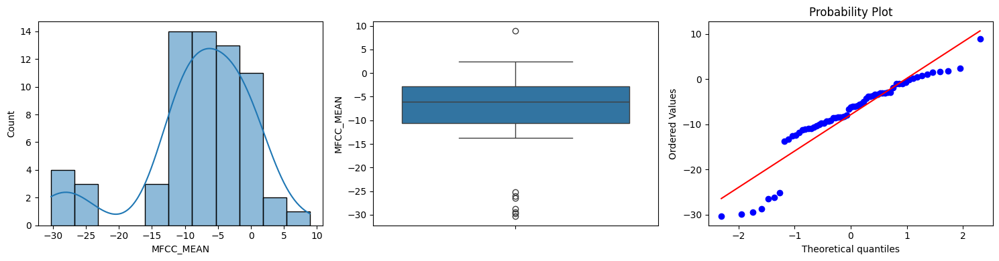

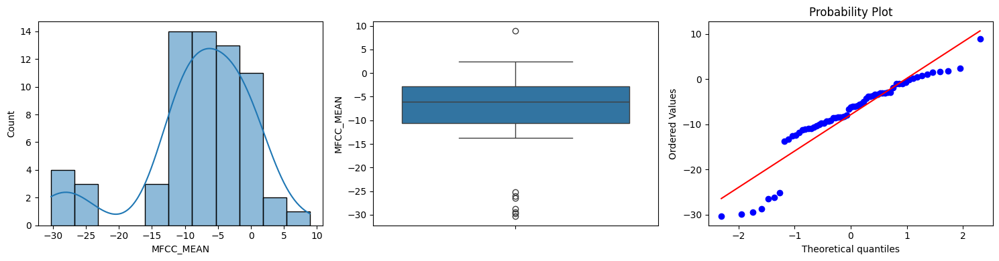

In [ ]:
# Applyig Gaussian Transformation:
MFCC_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MFCC_MEAN',
                                                                                       trans_method='none')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='MFCC_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_MEAN_TRANSFORMED).visualize_feature(feature='MFCC_MEAN')

In [ ]:
# Counting Outliers:
MFCC_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('MFCC_MEAN')
MFCC_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_MEAN_TRANSFORMED).count_outliers('MFCC_MEAN')
print(f'Number of outliers before Gaussian Transformation: {MFCC_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_MEAN_TRANSFORMED['MFCC_MEAN'].skew()}")
print(f'Number of missing values: {MFCC_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 8
Outlier Coefficient: -1.2194644923139246
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_MFCC_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MFCC_MEAN',
                                                                                               trans_method='none')
X_TEST_MFCC_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='MFCC_MEAN',
                                                                                             trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_MFCC_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_MFCC_MEAN_TRANSFORMED)

### 44. mfcc_median:
- __Applied Method:__ square_root:

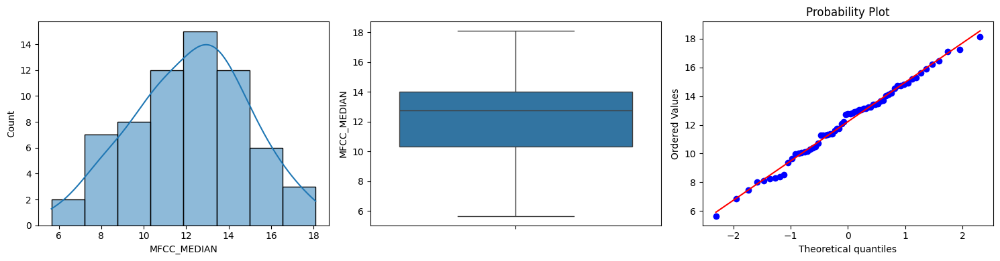

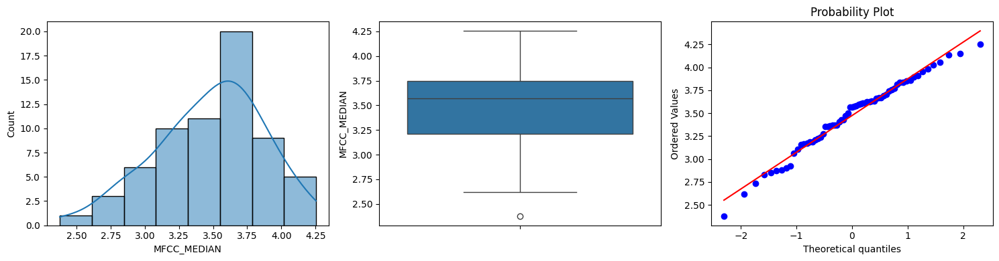

In [ ]:
# Applyig Gaussian Transformation:
MFCC_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MFCC_MEDIAN',
                                                                                       trans_method='square_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='MFCC_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_MEDIAN_TRANSFORMED).visualize_feature(feature='MFCC_MEDIAN')

In [ ]:
# Counting Outliers:
MFCC_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('MFCC_MEDIAN')
MFCC_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_MEDIAN_TRANSFORMED).count_outliers('MFCC_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {MFCC_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_MEDIAN_TRANSFORMED['MFCC_MEDIAN'].skew()}")
print(f'Number of missing values: {MFCC_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 1
Outlier Coefficient: -0.45718316396962294
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['MFCC_MEDIAN'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['MFCC_MEDIAN'])

### 45. mfcc_std:
- __Applied Method:__ No method:

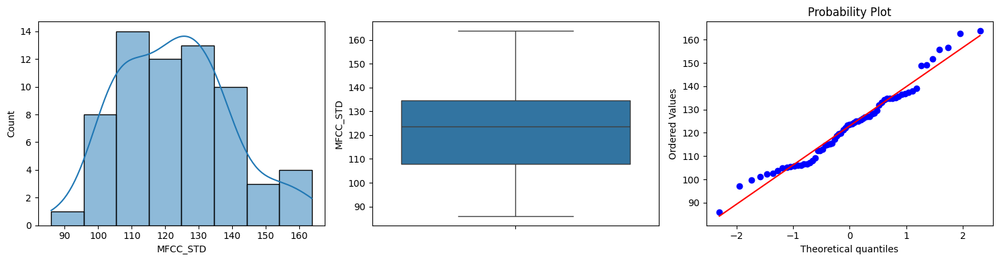

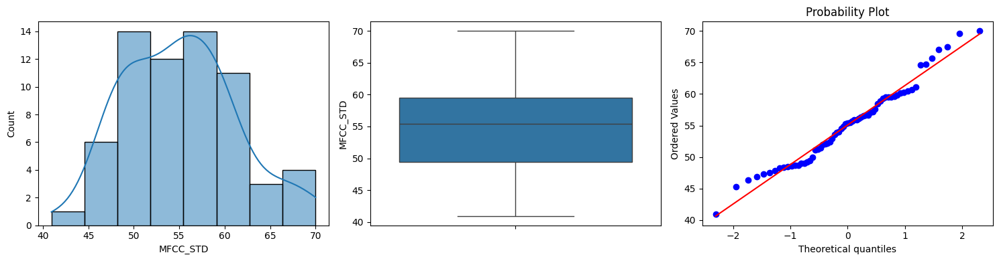

In [ ]:
# Applyig Gaussian Transformation:
MFCC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MFCC_STD',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='MFCC_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=MFCC_STD_TRANSFORMED).visualize_feature(feature='MFCC_STD')

In [ ]:
# Counting Outliers:
MFCC_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('MFCC_STD')
MFCC_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=MFCC_STD_TRANSFORMED).count_outliers('MFCC_STD')
print(f'Number of outliers before Gaussian Transformation: {MFCC_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {MFCC_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {MFCC_STD_TRANSFORMED['MFCC_STD'].skew()}")
print(f'Number of missing values: {MFCC_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.35377293040030827
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_MFCC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='MFCC_STD',
                                                                                               trans_method='square_root')
X_TEST_MFCC_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='MFCC_STD',
                                                                                             trans_method='square_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_MFCC_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_MFCC_STD_TRANSFORMED)

### 46. delta_1_max:
- __Applied Method:__ square_root
- There is only one NaN value to be handled by replacing it with the median.

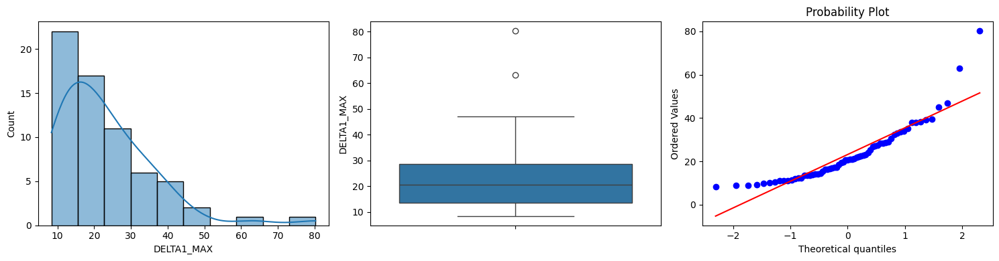

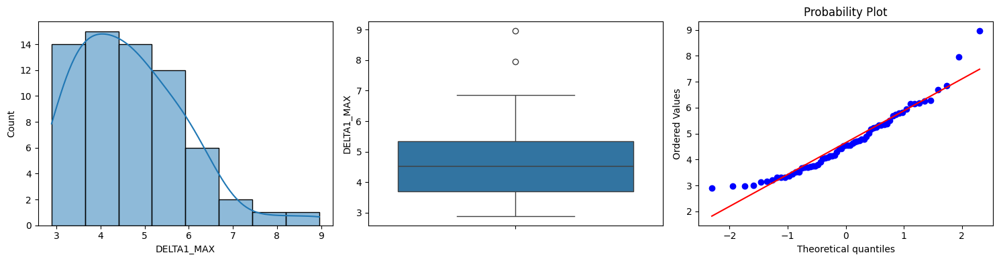

In [ ]:
# Applyig Gaussian Transformation:
DELTA_1_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_MAX',
                                                                                       trans_method='square_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA1_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_MAX_TRANSFORMED).visualize_feature(feature='DELTA1_MAX')

In [ ]:
# Counting Outliers:
DELTA_1_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA1_MAX')
DELTA_1_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_MAX_TRANSFORMED).count_outliers('DELTA1_MAX')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_MAX_TRANSFORMED['DELTA1_MAX'].skew()}")
print(f'Number of missing values: {DELTA_1_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 2
Number of outliers after Gaussian Transformation: 2
Outlier Coefficient: 0.9598561566630409
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_MAX',
                                                                                               trans_method='square_root')
X_TEST_DELTA_1_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='DELTA1_MAX',
                                                                                             trans_method='square_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_MAX_TRANSFORMED)

### 47. delta_1_min:
- __Applied Method:__ cube_root:

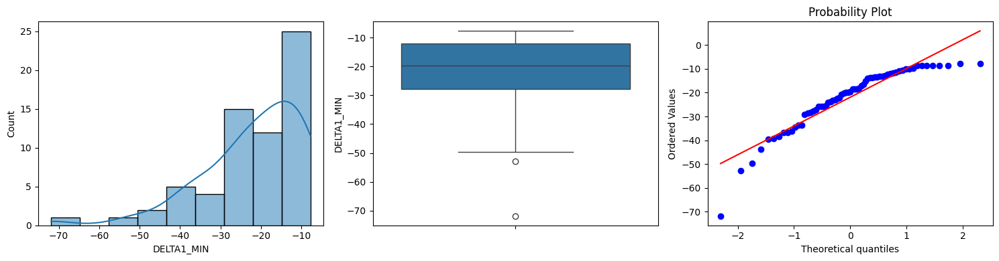

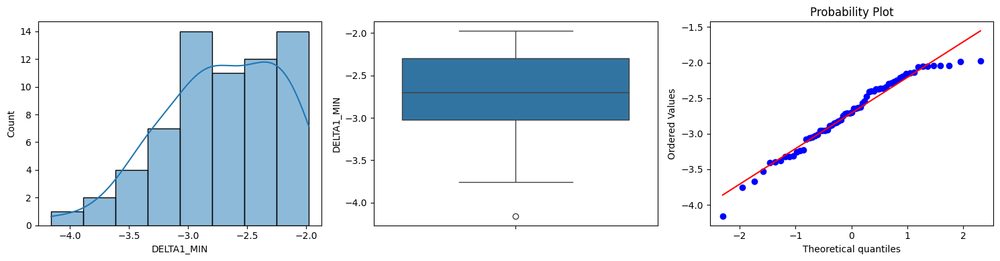

In [ ]:
# Applyig Gaussian Transformation:
DELTA_1_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_MIN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA1_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_MIN_TRANSFORMED).visualize_feature(feature='DELTA1_MIN')

In [ ]:
# Counting Outliers:
DELTA_1_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA1_MIN')
DELTA_1_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_MIN_TRANSFORMED).count_outliers('DELTA1_MIN')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_MIN_TRANSFORMED['DELTA1_MIN'].skew()}")
print(f'Number of missing values: {DELTA_1_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 2
Number of outliers after Gaussian Transformation: 1
Outlier Coefficient: -0.5308205833098372
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_MIN',
                                                                                               trans_method='cube_root')
X_TEST_DELTA_1_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='DELTA1_MIN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_MIN_TRANSFORMED)

### 48. delta_1_mean:
- __Applied Method:__ cube_root:

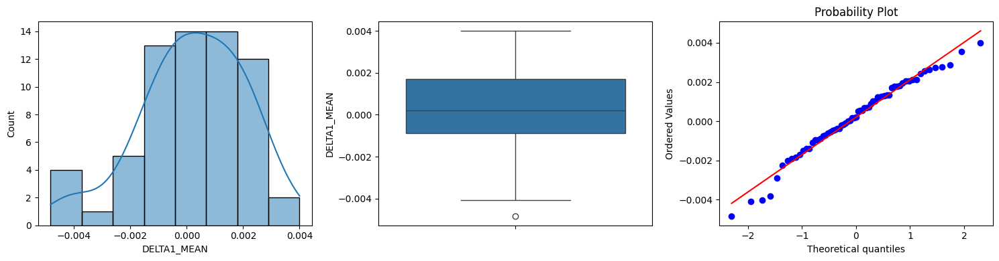

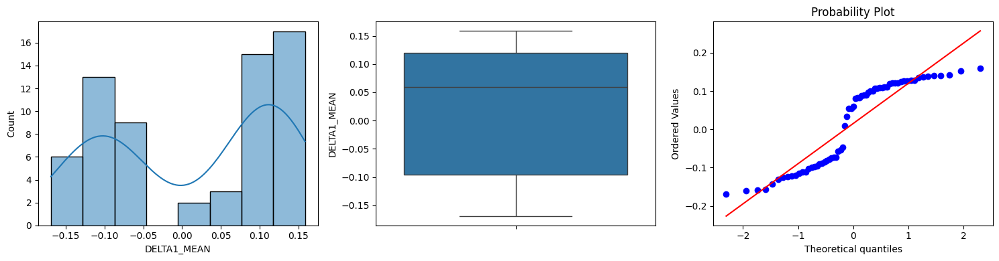

In [ ]:
# Applyig Gaussian Transformation:
DELTA_1_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_MEAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA1_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_MEAN_TRANSFORMED).visualize_feature(feature='DELTA1_MEAN')

In [ ]:
# Counting Outliers:
DELTA_1_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA1_MEAN')
DELTA_1_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_MEAN_TRANSFORMED).count_outliers('DELTA1_MEAN')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_MEAN_TRANSFORMED['DELTA1_MEAN'].skew()}")
print(f'Number of missing values: {DELTA_1_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 1
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.26622372476757145
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_MEAN',
                                                                                               trans_method='cube_root')
X_TEST_DELTA_1_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='DELTA1_MEAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_MEAN_TRANSFORMED)

### 49. delta_1_median:
- __Applied Method:__ cube_root:

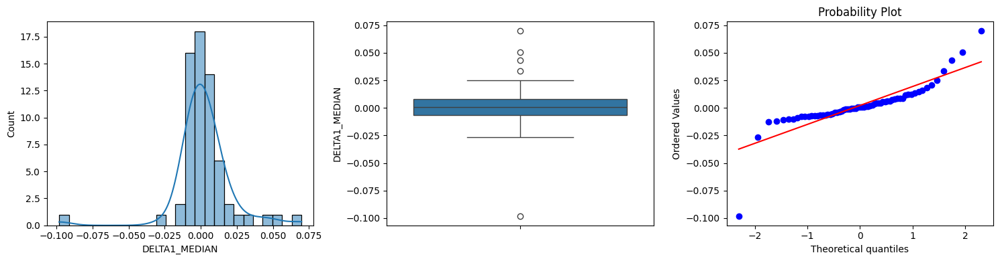

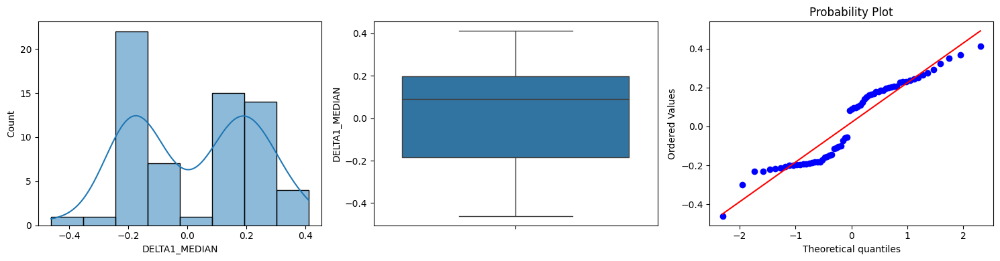

In [ ]:
# Applyig Gaussian Transformation:
DELTA_1_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_MEDIAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA1_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_MEDIAN_TRANSFORMED).visualize_feature(feature='DELTA1_MEDIAN')

In [ ]:
# Counting Outliers:
DELTA_1_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA1_MEDIAN')
DELTA_1_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_MEDIAN_TRANSFORMED).count_outliers('DELTA1_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_MEDIAN_TRANSFORMED['DELTA1_MEDIAN'].skew()}")
print(f'Number of missing values: {DELTA_1_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 5
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.05608724478643925
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_MEDIAN',
                                                                                               trans_method='cube_root')
X_TEST_DELTA_1_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='DELTA1_MEDIAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_MEDIAN_TRANSFORMED)

### 50. delta_1_std:
- __Applied Method:__ square_root:

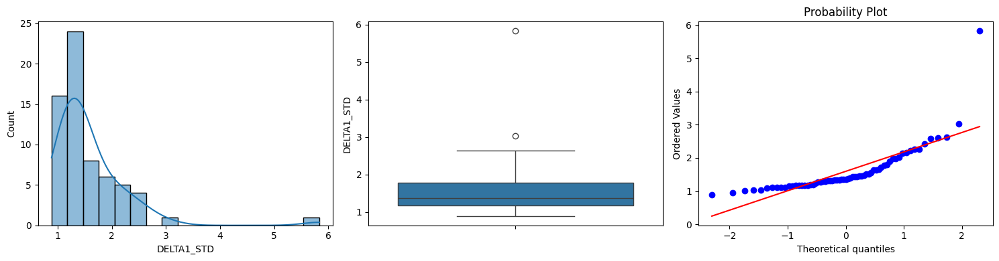

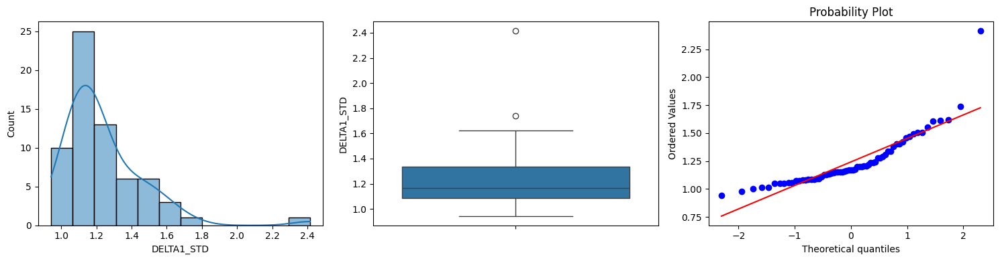

In [ ]:
# Applyig Gaussian Transformation:
DELTA_1_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_STD',
                                                                                       trans_method='square_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA1_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_1_STD_TRANSFORMED).visualize_feature(feature='DELTA1_STD')

In [ ]:
# Counting Outliers:
DELTA_1_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA1_STD')
DELTA_1_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_1_STD_TRANSFORMED).count_outliers('DELTA1_STD')
print(f'Number of outliers before Gaussian Transformation: {DELTA_1_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_1_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_1_STD_TRANSFORMED['DELTA1_STD'].skew()}")
print(f'Number of missing values: {DELTA_1_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 2
Number of outliers after Gaussian Transformation: 2
Outlier Coefficient: 2.386247949801195
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_1_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA1_STD',
                                                                                               trans_method='square_root')
X_TEST_DELTA_1_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='DELTA1_STD',
                                                                                             trans_method='square_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_1_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_1_STD_TRANSFORMED)

### 51. delta_2_max:
- __Applied Method:__ exponential:

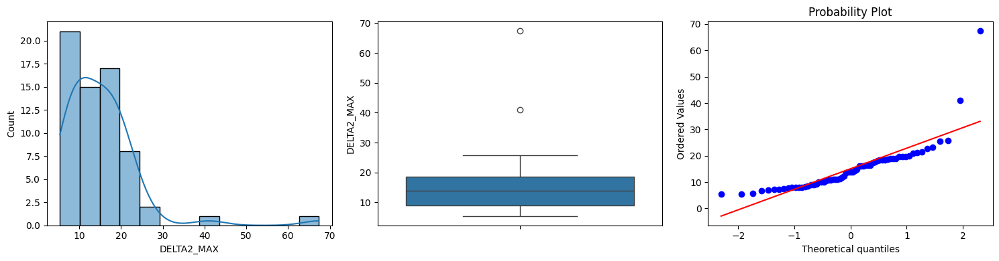

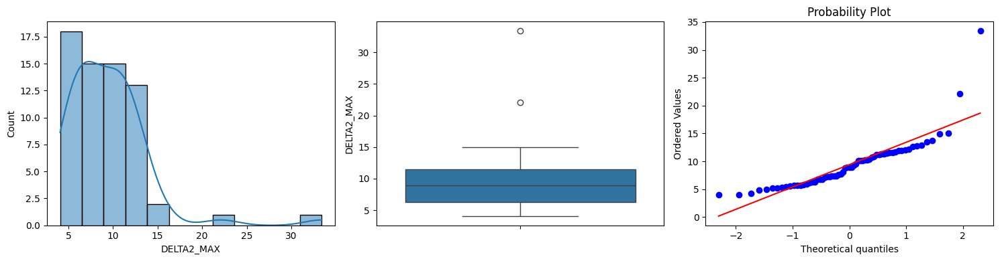

In [ ]:
# Applyig Gaussian Transformation:
DELTA_2_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA2_MAX',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA2_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_MAX_TRANSFORMED).visualize_feature(feature='DELTA2_MAX')

In [ ]:
# Counting Outliers:
DELTA_2_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA2_MAX')
DELTA_2_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_MAX_TRANSFORMED).count_outliers('DELTA2_MAX')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_MAX_TRANSFORMED['DELTA2_MAX'].skew()}")
print(f'Number of missing values: {DELTA_2_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 2
Number of outliers after Gaussian Transformation: 2
Outlier Coefficient: 2.695426545651765
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_2_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA2_MAX',
                                                                                               trans_method='exponential')
X_TEST_DELTA_2_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='DELTA2_MAX',
                                                                                             trans_method='exponential')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_2_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_2_MAX_TRANSFORMED)

### 52. delta_2_min:
- __Applied Method:__ No method:

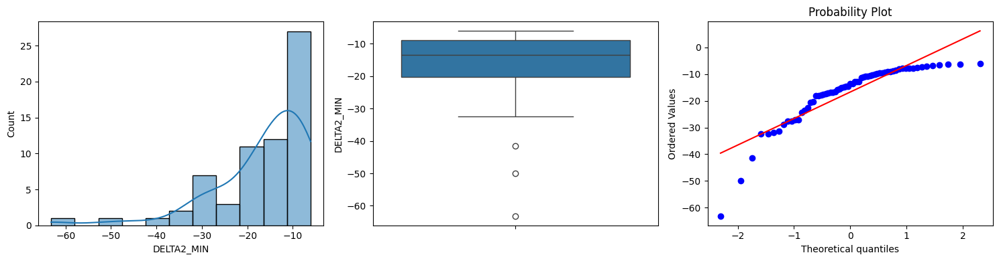

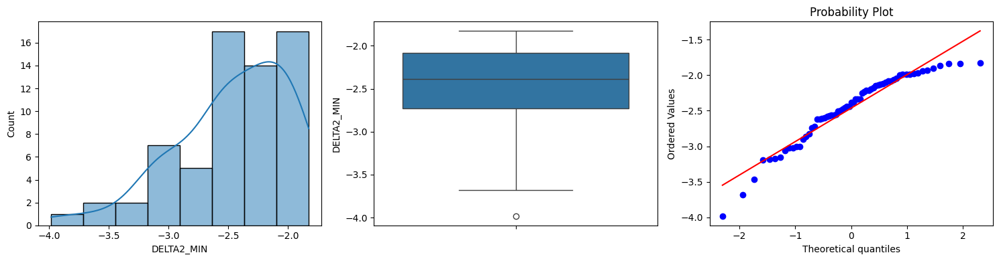

In [ ]:
# Applyig Gaussian Transformation:
DELTA_2_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA2_MIN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA2_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_MIN_TRANSFORMED).visualize_feature(feature='DELTA2_MIN')

In [ ]:
# Counting Outliers:
DELTA_2_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA2_MIN')
DELTA_2_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_MIN_TRANSFORMED).count_outliers('DELTA2_MIN')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_MIN_TRANSFORMED['DELTA2_MIN'].skew()}")
print(f'Number of missing values: {DELTA_2_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 3
Number of outliers after Gaussian Transformation: 1
Outlier Coefficient: -0.9266173581796604
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA2_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA2_MIN',
                                                                                               trans_method='cube_root')
X_TEST_DELTA2_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='DELTA2_MIN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA2_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA2_MIN_TRANSFORMED)

### 53. delta_2_mean:
- __Applied Method:__ No method:

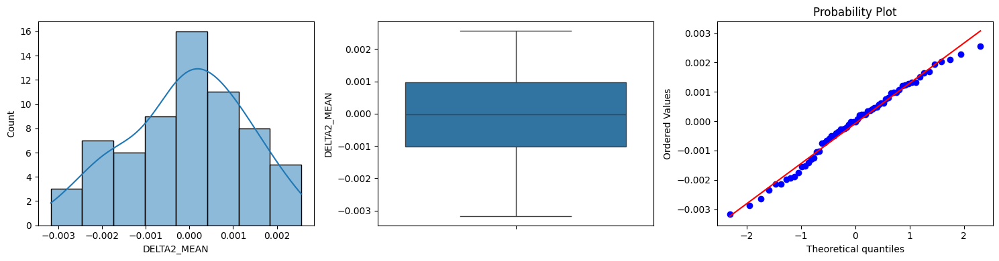

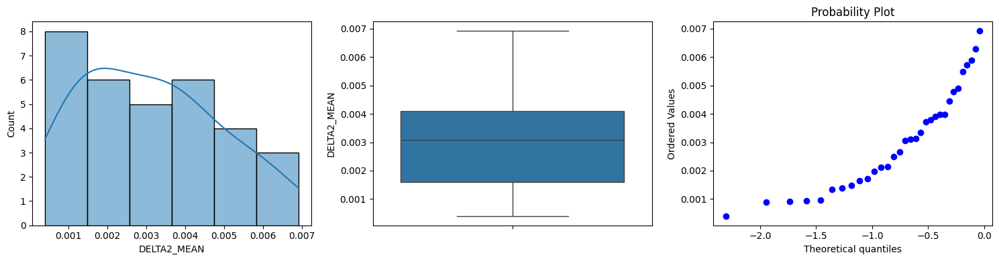

In [ ]:
# Applyig Gaussian Transformation:
DELTA_2_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA2_MEAN',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA2_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_MEAN_TRANSFORMED).visualize_feature(feature='DELTA2_MEAN')

In [ ]:
# Counting Outliers:
DELTA_2_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA2_MEAN')
DELTA_2_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_MEAN_TRANSFORMED).count_outliers('DELTA2_MEAN')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_MEAN_TRANSFORMED['DELTA2_MEAN'].skew()}")
print(f'Number of missing values: {DELTA_2_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 0.41902601355880614
Number of missing values: 33


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['DELTA2_MEAN'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['DELTA2_MEAN'])

### 54. delta_2_median:
- __Applied Method:__ No method:

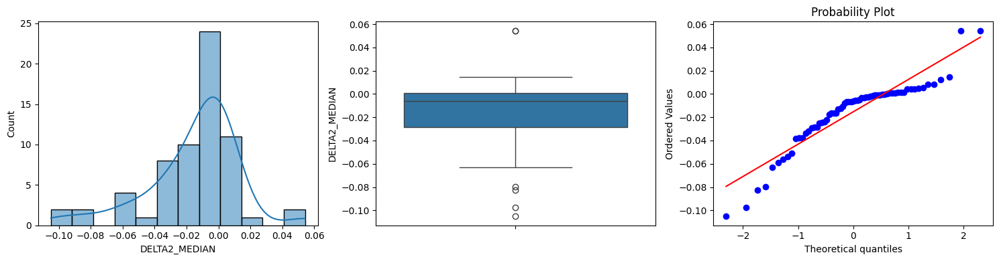

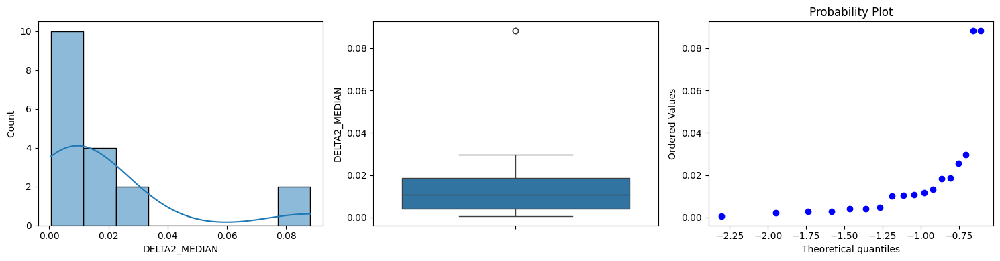

In [ ]:
# Applyig Gaussian Transformation:
DELTA_2_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA2_MEDIAN',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA2_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_MEDIAN_TRANSFORMED).visualize_feature(feature='DELTA2_MEDIAN')

In [ ]:
# Counting Outliers:
DELTA_2_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA2_MEDIAN')
DELTA_2_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_MEDIAN_TRANSFORMED).count_outliers('DELTA2_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_MEDIAN_TRANSFORMED['DELTA2_MEDIAN'].skew()}")
print(f'Number of missing values: {DELTA_2_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 6
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: 2.2518975139411537
Number of missing values: 47


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN['DELTA2_MEDIAN'])
X_TEST_TRANSFORMED_FEATURES.append(X_TEST['DELTA2_MEDIAN'])

### 55. delta_2_std:
- __Applied Method:__:
- square_root => 36 outliers but Normal Distribution
- exponential => 32 outliers but skewed

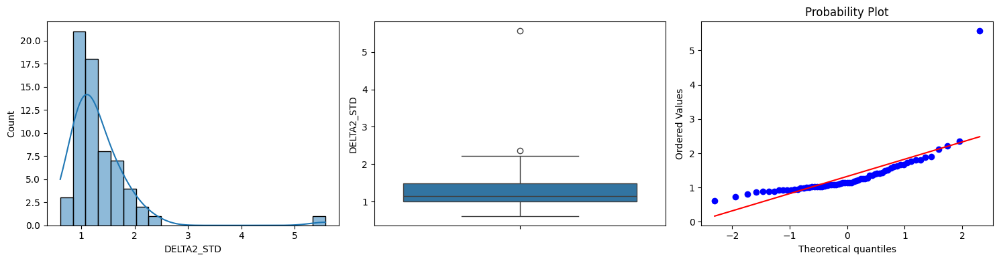

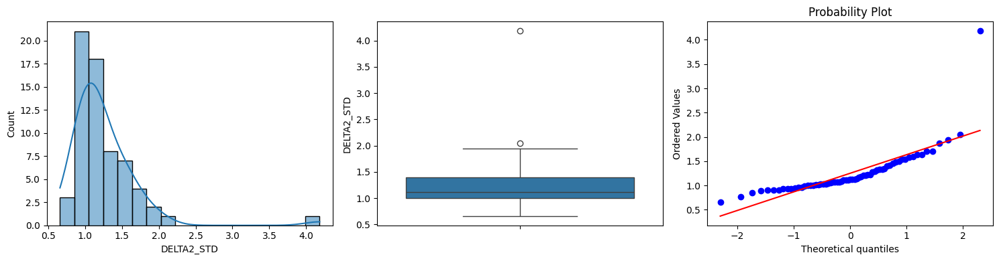

In [ ]:
# Applyig Gaussian Transformation:
DELTA_2_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA2_STD',
                                                                                       trans_method='exponential')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='DELTA2_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=DELTA_2_STD_TRANSFORMED).visualize_feature(feature='DELTA2_STD')

In [ ]:
# Counting Outliers:
DELTA_2_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('DELTA2_STD')
DELTA_2_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=DELTA_2_STD_TRANSFORMED).count_outliers('DELTA2_STD')
print(f'Number of outliers before Gaussian Transformation: {DELTA_2_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {DELTA_2_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {DELTA_2_STD_TRANSFORMED['DELTA2_STD'].skew()}")
print(f'Number of missing values: {DELTA_2_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 2
Number of outliers after Gaussian Transformation: 2
Outlier Coefficient: 4.020611651430057
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_DELTA_2_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='DELTA2_STD',
                                                                                               trans_method='exponential')
X_TEST_DELTA_2_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='DELTA2_STD',
                                                                                             trans_method='exponential')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_DELTA_2_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_DELTA_2_STD_TRANSFORMED)

### 56. ca_max:
- __Applied Method:__ cube_root:

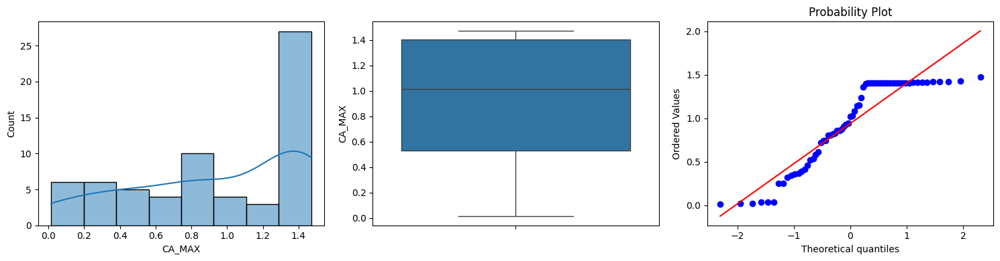

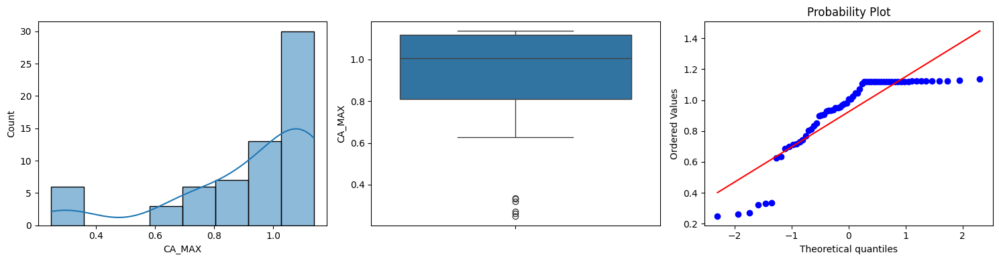

In [ ]:
# Applyig Gaussian Transformation:
CA_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_MAX',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CA_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_MAX_TRANSFORMED).visualize_feature(feature='CA_MAX')

In [ ]:
# Counting Outliers:
CA_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CA_MAX')
CA_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_MAX_TRANSFORMED).count_outliers('CA_MAX')
print(f'Number of outliers before Gaussian Transformation: {CA_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_MAX_TRANSFORMED['CA_MAX'].skew()}")
print(f'Number of missing values: {CA_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 6
Outlier Coefficient: -1.4423804341684716
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_MAX',
                                                                                               trans_method='none')
X_TEST_CA_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CA_MAX',
                                                                                             trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_MAX_TRANSFORMED)

### 57. ca_min:
- __Applied Method:__ cube_root:

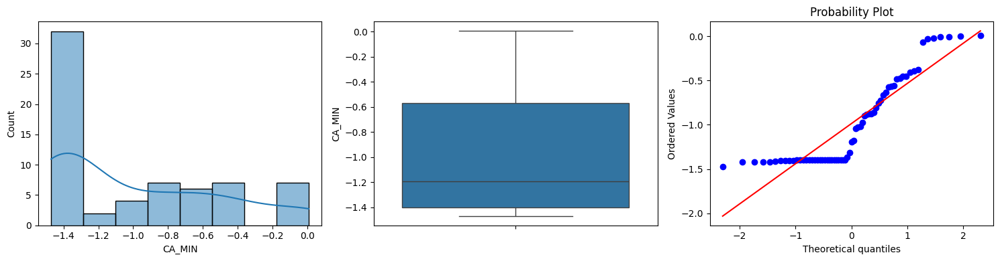

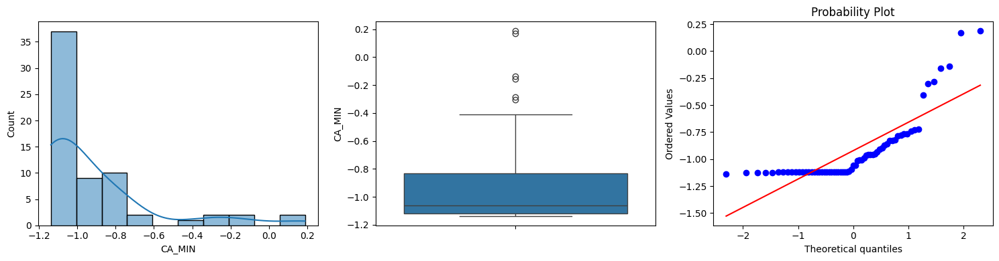

In [ ]:
# Applyig Gaussian Transformation:
CA_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_MIN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CA_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_MIN_TRANSFORMED).visualize_feature(feature='CA_MIN')

In [ ]:
# Counting Outliers:
CA_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CA_MIN')
CA_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_MIN_TRANSFORMED).count_outliers('CA_MIN')
print(f'Number of outliers before Gaussian Transformation: {CA_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_MIN_TRANSFORMED['CA_MIN'].skew()}")
print(f'Number of missing values: {CA_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 0
Number of outliers after Gaussian Transformation: 6
Outlier Coefficient: 2.130074206070657
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_MIN',
                                                                                               trans_method='none')
X_TEST_CA_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CA_MIN',
                                                                                             trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_MIN_TRANSFORMED)

### 58. ca_mean:
- __Applied Method:__ cube_root:

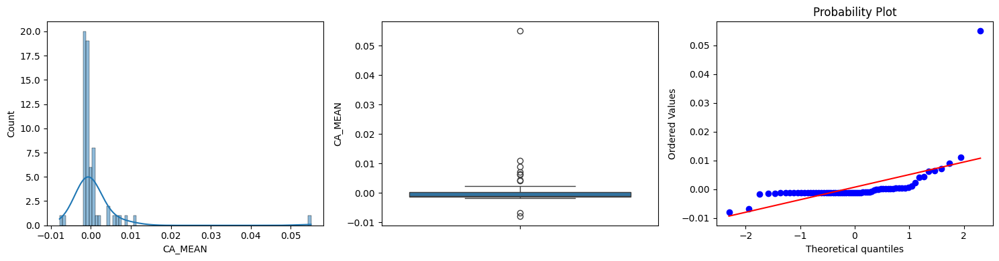

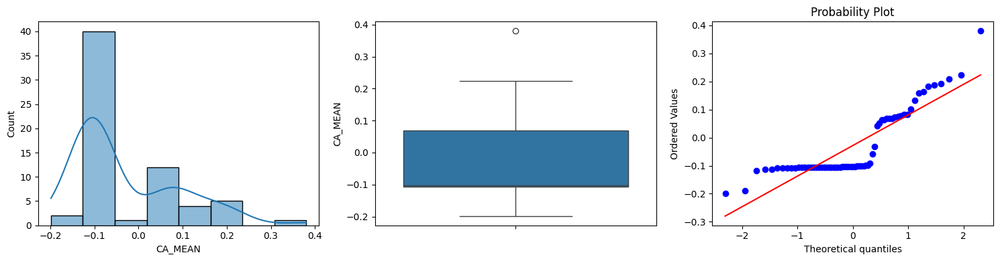

In [ ]:
# Applyig Gaussian Transformation:
CA_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_MEAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CA_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_MEAN_TRANSFORMED).visualize_feature(feature='CA_MEAN')

In [ ]:
# Counting Outliers:
CA_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CA_MEAN')
CA_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_MEAN_TRANSFORMED).count_outliers('CA_MEAN')
print(f'Number of outliers before Gaussian Transformation: {CA_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_MEAN_TRANSFORMED['CA_MEAN'].skew()}")
print(f'Number of missing values: {CA_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 10
Number of outliers after Gaussian Transformation: 1
Outlier Coefficient: 1.1885984551736954
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_MEAN',
                                                                                               trans_method='cube_root')
X_TEST_CA_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CA_MEAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_MEAN_TRANSFORMED)

### 59. ca_median:
- __Applied Method:__ cube_root:

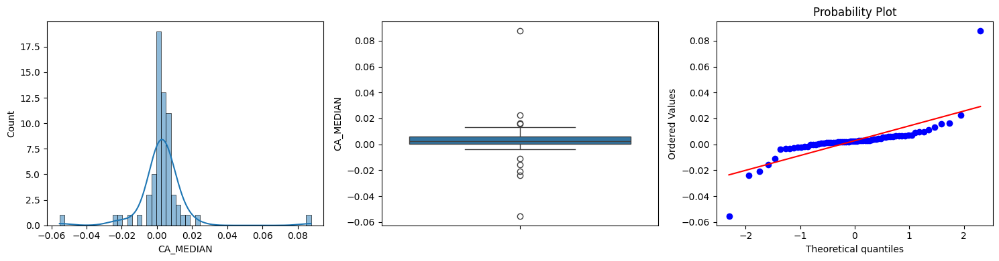

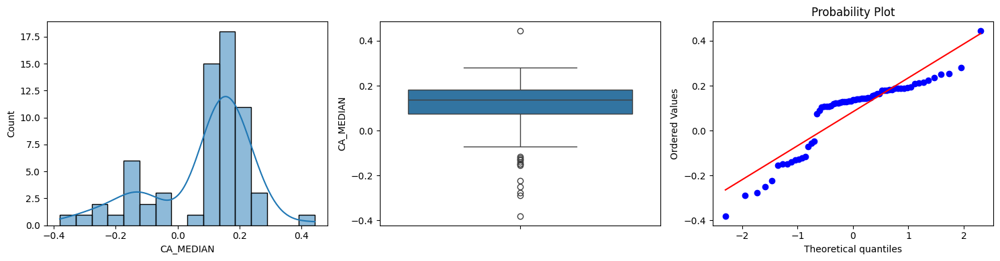

In [ ]:
# Applyig Gaussian Transformation:
CA_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_MEDIAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CA_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_MEDIAN_TRANSFORMED).visualize_feature(feature='CA_MEDIAN')

In [ ]:
# Counting Outliers:
CA_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CA_MEDIAN')
CA_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_MEDIAN_TRANSFORMED).count_outliers('CA_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {CA_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_MEDIAN_TRANSFORMED['CA_MEDIAN'].skew()}")
print(f'Number of missing values: {CA_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 9
Number of outliers after Gaussian Transformation: 14
Outlier Coefficient: -1.0426579419703634
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_MEDIAN',
                                                                                               trans_method='none')
X_TEST_CA_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CA_MEDIAN',
                                                                                             trans_method='none')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_MEDIAN_TRANSFORMED)

### 60. ca_std:
- __Applied Method:__ cube_root

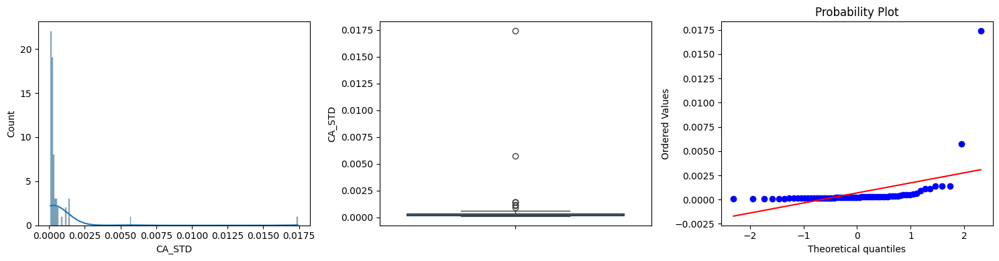

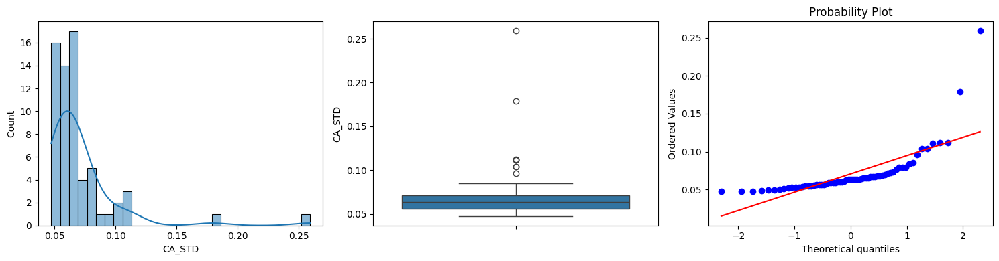

In [ ]:
# Applyig Gaussian Transformation:
CA_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_STD',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CA_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CA_STD_TRANSFORMED).visualize_feature(feature='CA_STD')

In [ ]:
# Counting Outliers:
CA_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CA_STD')
CA_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CA_STD_TRANSFORMED).count_outliers('CA_STD')
print(f'Number of outliers before Gaussian Transformation: {CA_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CA_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CA_STD_TRANSFORMED['CA_STD'].skew()}")
print(f'Number of missing values: {CA_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 8
Outlier Coefficient: 4.073154467514711
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CA_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CA_STD',
                                                                                               trans_method='cube_root')
X_TEST_CA_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CA_STD',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CA_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CA_STD_TRANSFORMED)

### 61. cd_max:
- __Applied Method:__ cube_root

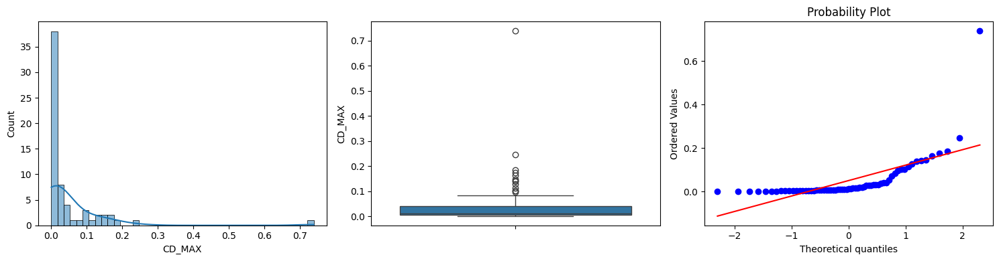

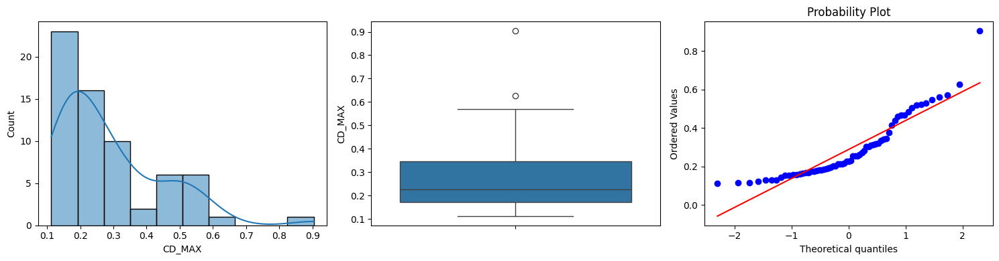

In [ ]:
# Applyig Gaussian Transformation:
CD_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_MAX',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CD_MAX')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_MAX_TRANSFORMED).visualize_feature(feature='CD_MAX')

In [ ]:
# Counting Outliers:
CD_MAX_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CD_MAX')
CD_MAX_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_MAX_TRANSFORMED).count_outliers('CD_MAX')
print(f'Number of outliers before Gaussian Transformation: {CD_MAX_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_MAX_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_MAX_TRANSFORMED['CD_MAX'].skew()}")
print(f'Number of missing values: {CD_MAX_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 13
Number of outliers after Gaussian Transformation: 2
Outlier Coefficient: 1.3918413072440425
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_MAX',
                                                                                               trans_method='cube_root')
X_TEST_CD_MAX_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CD_MAX',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_MAX_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_MAX_TRANSFORMED)

### 62. cd_min:
- __Applied Method:__ cube_root

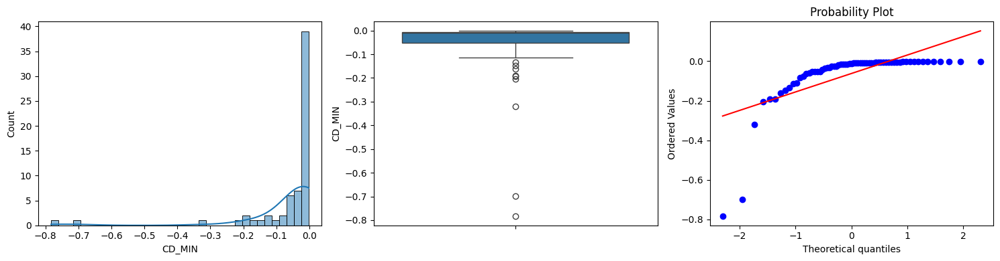

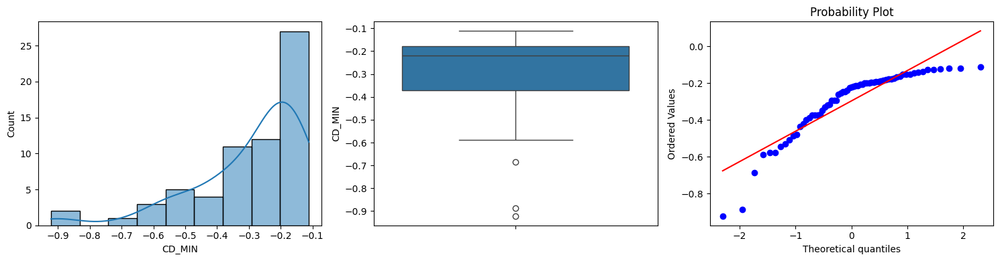

In [ ]:
# Applyig Gaussian Transformation:
CD_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_MIN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CD_MIN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_MIN_TRANSFORMED).visualize_feature(feature='CD_MIN')

In [ ]:
# Counting Outliers:
CD_MIN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CD_MIN')
CD_MIN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_MIN_TRANSFORMED).count_outliers('CD_MIN')
print(f'Number of outliers before Gaussian Transformation: {CD_MIN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_MIN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_MIN_TRANSFORMED['CD_MIN'].skew()}")
print(f'Number of missing values: {CD_MIN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 9
Number of outliers after Gaussian Transformation: 3
Outlier Coefficient: -1.624540738422531
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_MIN',
                                                                                               trans_method='cube_root')
X_TEST_CD_MIN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CD_MIN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_MIN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_MIN_TRANSFORMED)

### 63. cd_mean:
- __Applied Method:__ cube_root

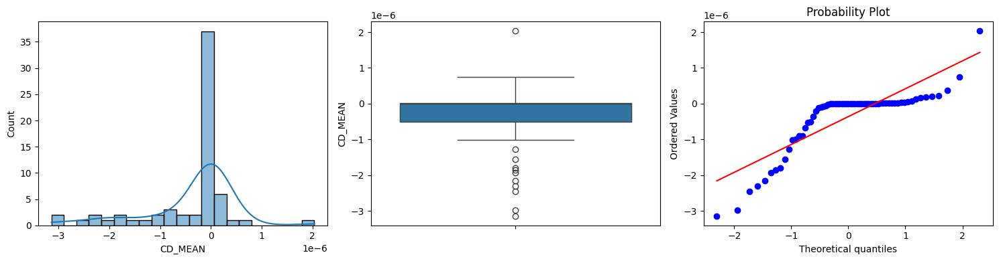

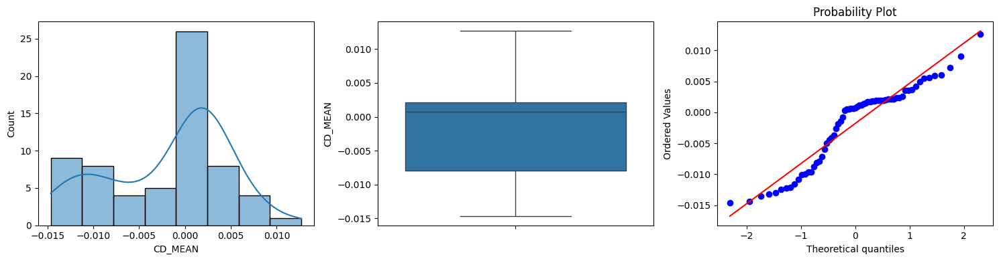

In [ ]:
# Applyig Gaussian Transformation:
CD_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_MEAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CD_MEAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_MEAN_TRANSFORMED).visualize_feature(feature='CD_MEAN')

In [ ]:
# Counting Outliers:
CD_MEAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CD_MEAN')
CD_MEAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_MEAN_TRANSFORMED).count_outliers('CD_MEAN')
print(f'Number of outliers before Gaussian Transformation: {CD_MEAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_MEAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_MEAN_TRANSFORMED['CD_MEAN'].skew()}")
print(f'Number of missing values: {CD_MEAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 11
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.4502751698192168
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_MEAN',
                                                                                               trans_method='cube_root')
X_TEST_CD_MEAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CD_MEAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_MEAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_MEAN_TRANSFORMED)

### 64. cd_median:
- __Applied Method:__ cube_root

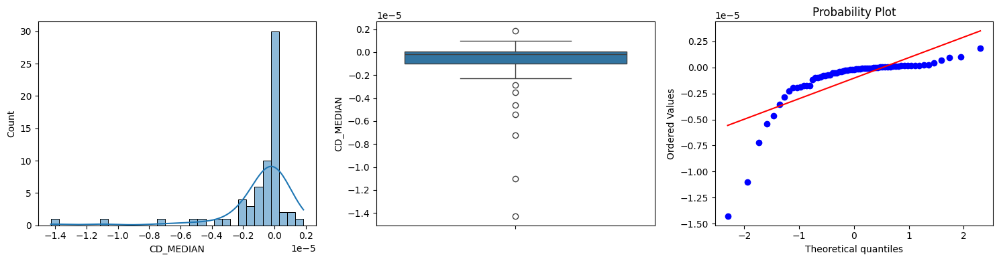

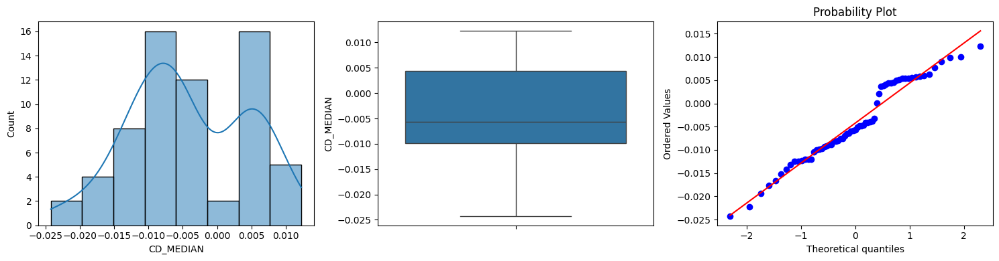

In [ ]:
# Applyig Gaussian Transformation:
CD_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_MEDIAN',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CD_MEDIAN')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_MEDIAN_TRANSFORMED).visualize_feature(feature='CD_MEDIAN')

In [ ]:
# Counting Outliers:
CD_MEDIAN_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CD_MEDIAN')
CD_MEDIAN_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_MEDIAN_TRANSFORMED).count_outliers('CD_MEDIAN')
print(f'Number of outliers before Gaussian Transformation: {CD_MEDIAN_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_MEDIAN_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_MEDIAN_TRANSFORMED['CD_MEDIAN'].skew()}")
print(f'Number of missing values: {CD_MEDIAN_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 0
Outlier Coefficient: -0.0377421507822503
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_MEDIAN',
                                                                                               trans_method='cube_root')
X_TEST_CD_MEDIAN_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CD_MEDIAN',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_MEDIAN_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_MEDIAN_TRANSFORMED)

### 65. cd_std:
- __Applied Method:__ cube_root

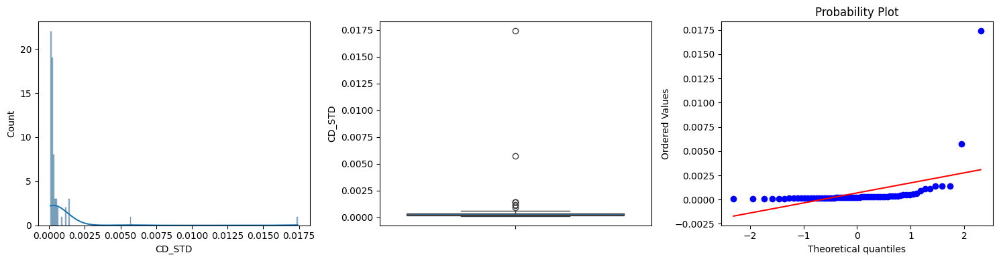

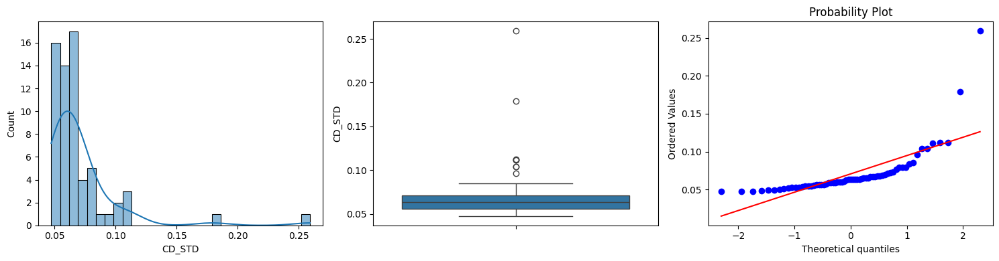

In [ ]:
# Applyig Gaussian Transformation:
CD_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_STD',
                                                                                       trans_method='cube_root')
# Plots before applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=X_TRAIN).visualize_feature(feature='CD_STD')
# Plots after applying Gaussian Transformation:
ExploratoryDataAnalysisTabular(dataset=CD_STD_TRANSFORMED).visualize_feature(feature='CD_STD')

In [ ]:
# Counting Outliers:
CD_STD_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=X_TRAIN).count_outliers('CD_STD')
CD_STD_TRANSFORMED_OUTLIERS, _ = ExploratoryDataAnalysisTabular(dataset=CD_STD_TRANSFORMED).count_outliers('CD_STD')
print(f'Number of outliers before Gaussian Transformation: {CD_STD_OUTLIERS}')
print(f'Number of outliers after Gaussian Transformation: {CD_STD_TRANSFORMED_OUTLIERS}')
print(f"Outlier Coefficient: {CD_STD_TRANSFORMED['CD_STD'].skew()}")
print(f'Number of missing values: {CD_STD_TRANSFORMED.isna().sum().sum()}')

Number of outliers before Gaussian Transformation: 8
Number of outliers after Gaussian Transformation: 8
Outlier Coefficient: 4.073154467514711
Number of missing values: 0


In [ ]:
# Appending the transformed features to X_TRAIN_FEATURES and X_TEST_FEATURES separately:
X_TRAIN_CD_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TRAIN).apply_gaussian_transformation(feature='CD_STD',
                                                                                               trans_method='cube_root')
X_TEST_CD_STD_TRANSFORMED = FeatureEngineeringTabular(dataset=X_TEST).apply_gaussian_transformation(feature='CD_STD',
                                                                                             trans_method='cube_root')


X_TRAIN_TRANSFORMED_FEATURES.append(X_TRAIN_CD_STD_TRANSFORMED)
X_TEST_TRANSFORMED_FEATURES.append(X_TEST_CD_STD_TRANSFORMED)

In [ ]:
# Creating a new DataFrame including all the transformed data:
X_TRAIN_TRANSFORMED = pd.concat(X_TRAIN_TRANSFORMED_FEATURES, axis=1)
X_TEST_TRANSFORMED = pd.concat(X_TEST_TRANSFORMED_FEATURES, axis=1)

In [ ]:
X_TRAIN_TRANSFORMED.head()

,MAX,MIN,MEAN,MEDIAN,STD,ENERGY,POWER,AE_MAX,AE_MIN,AE_MEDIAN,...,CA_MIN,CA_MEAN,CA_MEDIAN,CA_STD,CD_MAX,CD_MIN,CD_MEAN,CD_MEDIAN,CD_STD,AE_MEAN
0,0.991787,-0.989809,0.045418,0.001276,0.525692,34.347650,0.276352,0.991787,-0.712520,0.471556,...,-1.418172,0.050947,0.001793,0.111379,0.484203,-0.484971,-0.013212,-0.015224,0.111379,0.549021
1,0.510257,-0.572095,-0.096051,0.000915,0.401891,20.076054,0.161527,0.510257,-0.414997,0.382800,...,-0.808987,-0.107813,0.001297,0.063727,0.144423,-0.141931,0.001954,0.008944,0.063727,0.456359
2,0.993596,-0.990206,0.091322,-0.014868,0.706675,62.068900,0.499391,0.993596,-0.870401,0.631760,...,-1.401546,0.102465,-0.021018,0.083437,0.377268,-0.372444,-0.012155,-0.009101,0.083437,0.690250
3,0.999311,-0.989797,-0.093388,0.011106,0.509510,32.265968,0.259604,0.999311,-0.724548,0.516920,...,-1.403874,-0.104830,0.015666,0.096487,0.527547,-0.921667,-0.014644,0.009855,0.096487,0.536214
4,0.990468,-0.739709,0.068433,0.000488,0.295867,10.880526,0.087542,0.990468,-0.342731,0.289625,...,-1.044439,0.076811,0.000688,0.053053,0.302268,-0.388555,0.005008,-0.005970,0.053053,0.329500


In [ ]:
X_TEST_TRANSFORMED.head()

,MAX,MIN,MEAN,MEDIAN,STD,ENERGY,POWER,AE_MAX,AE_MIN,AE_MEDIAN,...,CA_MIN,CA_MEAN,CA_MEDIAN,CA_STD,CD_MAX,CD_MIN,CD_MEAN,CD_MEDIAN,CD_STD,AE_MEAN
0,0.994622,-0.990815,-0.234587,-0.002584,0.790825,77.748665,0.625546,0.994622,-0.809520,0.791756,...,-1.401666,-0.263311,-0.003655,0.103009,0.386127,-0.379275,-0.011564,-0.013082,0.103009,0.821601
1,0.992854,-0.987829,0.097157,0.003323,0.604217,45.375504,0.365080,0.992854,-0.701458,0.536658,...,-1.396995,0.109046,0.004707,0.077608,0.409447,-0.384523,-0.007927,-0.008417,0.077608,0.592438
2,0.992177,-0.990939,0.131066,0.009710,0.672357,56.187689,0.452072,0.992177,-0.921223,0.654921,...,-1.401465,0.147125,0.013723,0.062603,0.276328,-0.271902,0.004713,-0.009906,0.062603,0.694480
3,0.584746,-0.989883,-0.092411,0.002027,0.383802,18.309464,0.147313,0.584746,-0.642786,0.313013,...,-1.402961,-0.103730,0.002860,0.059500,0.468099,-0.479272,-0.005927,-0.007050,0.059500,0.391556
4,0.426655,-0.686894,-0.094369,0.002060,0.367706,16.806473,0.135221,0.426655,-0.452626,0.366952,...,-0.970520,-0.105927,0.002910,0.050530,0.171711,-0.145938,0.002665,0.004788,0.050530,0.383719


### Checking Train and Test sets after applying Gaussian Transformation:
- In some cases, Gaussian Transformation creates NaN Values.
- In this part, Train and Test datasets are checked if they contain any missing values.
- If there are missing values, then they are replced with the median.

In [ ]:
print(f'Number of missing values in X_TRAIN_TRANSFORMED:{X_TRAIN_TRANSFORMED.isna().sum().sum()}')
print(f'Number of missing values in X_TEST_TRANSFORMED:{X_TEST_TRANSFORMED.isna().sum().sum()}')

Number of missing values in X_TRAIN_TRANSFORMED:0
Number of missing values in X_TEST_TRANSFORMED:0


### 2.2.2. Normalization:
- Using 'MinMaxScaler' on all Features so that all values are between 0 and 1.
- fit_transform and transform are used for X_train and X_test respectively to make sure that the normalization parameters of the X_train are applied on the X_test and therefore it leads to avoid Data Leakage.

__Note:__
- For Demonistration purpose, Normalization is applied on a complete Dataset. But in data-preparation.py, Normalization is applied on Train and Test sets separately.

In [ ]:
X_TRAIN_NORMALIZED, X_TEST_NORMALIZED = FeatureEngineeringTabular(dataset=DATASET).normalize_data(x_train=X_TRAIN_TRANSFORMED, x_test=X_TEST_TRANSFORMED)

In [ ]:
# Displaying X_TRAIN_NORMALIZED:
X_TRAIN_NORMALIZED.describe()

,MAX,MIN,MEAN,MEDIAN,STD,ENERGY,POWER,AE_MAX,AE_MIN,AE_MEDIAN,...,CA_MIN,CA_MEAN,CA_MEDIAN,CA_STD,CD_MAX,CD_MIN,CD_MEAN,CD_MEDIAN,CD_STD,AE_MEAN
count,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,...,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000
mean,0.659139,0.297727,0.294203,0.406825,0.476934,0.293416,0.293416,0.659139,0.386910,0.399669,...,0.328471,0.294204,0.407132,0.109685,0.222263,0.771674,0.470423,0.547770,0.109685,0.394822
std,0.345633,0.345665,0.209449,0.102979,0.215456,0.215170,0.215170,0.345633,0.224294,0.179761,...,0.331287,0.209446,0.103002,0.150190,0.200494,0.218586,0.241729,0.235200,0.150190,0.208657
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370220,0.001871,0.160020,0.389748,0.372286,0.158278,0.158278,0.370220,0.255834,0.307439,...,0.048156,0.160016,0.390081,0.039708,0.076564,0.677314,0.245330,0.393219,0.039708,0.272258
50%,0.716586,0.149599,0.164039,0.405246,0.484753,0.260379,0.260379,0.716586,0.392449,0.377671,...,0.189132,0.164045,0.405558,0.075307,0.145420,0.865144,0.562547,0.508656,0.075307,0.370256
75%,0.992628,0.590583,0.460514,0.428577,0.574294,0.356781,0.356781,0.992628,0.485177,0.492761,...,0.609512,0.460506,0.428927,0.111231,0.294435,0.917440,0.613212,0.782492,0.111231,0.518956
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
# Displaying X_TEST_NORMALIZED:
X_TEST_NORMALIZED.describe()

,MAX,MIN,MEAN,MEDIAN,STD,ENERGY,POWER,AE_MAX,AE_MIN,AE_MEDIAN,...,CA_MIN,CA_MEAN,CA_MEDIAN,CA_STD,CD_MAX,CD_MIN,CD_MEAN,CD_MEDIAN,CD_STD,AE_MEAN
count,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000
mean,0.829398,0.077950,0.305822,0.406228,0.606921,0.423857,0.423857,0.829398,0.277647,0.511756,...,0.120446,0.305813,0.406551,0.088591,0.258751,0.774721,0.393466,0.524150,0.088591,0.536145
std,0.235893,0.138084,0.248268,0.036007,0.197782,0.257261,0.257261,0.235893,0.126810,0.192650,...,0.131988,0.248262,0.036045,0.081911,0.122190,0.135766,0.202136,0.204433,0.081911,0.216349
min,0.420416,0.000737,-0.111820,0.361393,0.382455,0.166639,0.166639,0.420416,0.062271,0.270406,...,0.045996,-0.111812,0.361679,0.014499,0.074612,0.546090,0.112784,0.305882,0.014499,0.289895
25%,0.646175,0.001563,0.158933,0.387066,0.474449,0.251518,0.251518,0.646175,0.223295,0.413145,...,0.046974,0.158929,0.387381,0.031929,0.197512,0.667907,0.264604,0.423370,0.031929,0.410895
50%,0.992376,0.002860,0.318292,0.404588,0.559470,0.340117,0.340117,0.992376,0.280443,0.469077,...,0.049083,0.318272,0.404888,0.064208,0.224531,0.820089,0.347693,0.453057,0.064208,0.492322
75%,0.992952,0.082802,0.491154,0.410423,0.725464,0.551265,0.551265,0.992952,0.358940,0.585237,...,0.125299,0.491135,0.410772,0.111346,0.353000,0.855160,0.518786,0.551978,0.111346,0.631489
max,0.995255,0.305965,0.597017,0.482922,0.954870,0.916187,0.916187,0.995255,0.453742,0.865653,...,0.338668,0.597027,0.483303,0.262446,0.449243,0.957556,0.708641,0.888895,0.262446,0.928490


## 2.3. Balancing Datasets:
- Balancing Dataset so that the number of subject per classes are equal.
- It is applied only on Train Dataset.

__Note:__
- For demonstration purpose, balancing train set is applied only on Holdout Cross-Validation.
- In data-preparation.py, Balancing train sets are applied on all Folds of the Cross-Validation.

In [ ]:
X_TRAIN_RESAMPLED, Y_TRAIN_RESAMPLED = FeatureEngineeringTabular(dataset=DATASET).balance_dataset(x_train=X_TRAIN_NORMALIZED,
                                                                                           y_train=Y_TRAIN,
                                                                                           rand_state=RANDOM_STATE)
print(f'Length before sampling: {len(X_TRAIN_NORMALIZED)}')
print(f'Length after sampling: {len(X_TRAIN_RESAMPLED)}')

Length before sampling: 65
Length after sampling: 90


In [ ]:
print(X_TRAIN_RESAMPLED.columns.tolist())


['MAX', 'MIN', 'MEAN', 'MEDIAN', 'STD', 'ENERGY', 'POWER', 'AE_MAX', 'AE_MIN', 'AE_MEDIAN', 'AE_STD', 'RM_MAX', 'RM_MIN', 'RM_MEAN', 'RM_MEDIAN', 'RM_STD', 'ZCR_GLOBAL', 'ZCR_MAX', 'ZCR_MEAN', 'ZCR_MEDIAN', 'ZCR_STD', 'PEAK_AMP', 'PEAK_FREQ', 'BER_MAX', 'BER_MIN', 'BER_MEAN', 'BER_MEDIAN', 'BER_STD', 'SC_MAX', 'SC_MIN', 'SC_MEAN', 'SC_MEDIAN', 'SC_STD', 'SB_MAX', 'SB_MIN', 'SB_MEAN', 'SB_MEDIAN', 'SB_STD', 'MFCC_MAX', 'MFCC_MIN', 'MFCC_MEAN', 'MFCC_MEDIAN', 'MFCC_STD', 'DELTA1_MAX', 'DELTA1_MIN', 'DELTA1_MEAN', 'DELTA1_MEDIAN', 'DELTA1_STD', 'DELTA2_MAX', 'DELTA2_MIN', 'DELTA2_MEAN', 'DELTA2_MEDIAN', 'DELTA2_STD', 'CA_MAX', 'CA_MIN', 'CA_MEAN', 'CA_MEDIAN', 'CA_STD', 'CD_MAX', 'CD_MIN', 'CD_MEAN', 'CD_MEDIAN', 'CD_STD', 'AE_MEAN']


# 3. Feature Selection:




In [ ]:
class FeatureSelectionTabular:
    def __init__(self, x_train, x_test, y_train, y_test):
        self.x_train = x_train
        self.x_test = x_test
        self.y_train = y_train
        self.y_test = y_test

    def conduct_one_sample_ttest(self, *features, sample_size, alpha=0.05):
        """Function to conduct One Sample T-Test on all the features on a dataframe individually.
        If the P-Value is less or equal to 0.05, then this feature is dropped from the dataframe
        and its name is added to a list of dropped features."""
        x_train = self.x_train.copy()
        x_test = self.x_test.copy()
        dropped_features = []
        for feature in features:
            population_mean = np.mean(self.x_train[feature])
            # Creating a random Sample from the Population:
            sample = np.random.choice(self.x_train[feature], sample_size)
            # Calculating the P-Value:
            _, p_value = ttest_1samp(a=sample, popmean=population_mean)
            if p_value < alpha:
                x_train = self.x_train.drop(feature, axis=1)
                x_test = self.x_test.drop(feature, axis=1)
                dropped_features.append(feature)
        return x_train, x_test, dropped_features

    def get_top_features(self, method: str, num_features, plot=False):
        """Function to get the top ranked features (Continuous Features) to the target (Categorical). It returns
        a list of the top ranked features. method is either chi2, mutual_info, feature_importance."""
        if method == 'chi2':
            ranked_features = SelectKBest(score_func=chi2, k=len(self.x_train.columns))
            ranked_features.fit(self.x_train, self.y_train)
            features_scores = pd.DataFrame(ranked_features.scores_, columns=['Scores'])

        elif method == 'mutual_info':
            ranked_features = mutual_info_classif(self.x_train, self.y_train)
            features_scores = pd.DataFrame(ranked_features, columns=['Scores'])

        elif method == 'feature_importance':
            ranked_features = ExtraTreesClassifier()
            ranked_features.fit(self.x_train, self.y_train)
            features_scores = pd.DataFrame(ranked_features.feature_importances_, columns=['Scores'])
        else:
            raise ValueError(f"Invalid representation type: {method}. 'method' is either 'chi2',"
                             f"'mutual_info' or 'feature_importance'")

        features_columns = pd.DataFrame(self.x_train.columns)
        top_ranked_features = pd.concat([features_columns, features_scores], axis=1)
        top_ranked_features = top_ranked_features.nlargest(num_features, 'Scores')
        if plot:
            plt.figure(figsize=(30, 10))
            plt.bar(top_ranked_features.iloc[:, 0], top_ranked_features['Scores'])
            return plt.show()
        else:
            return top_ranked_features

    def drop_correlated_features(self, threshold: float, top_features: list, drop=False):
        """Function to calculate the correlation between every pair of features and remove
        the correlated feature with higher skewness coefficient."""
        correlated_features = []  # Set of all the names of correlated columns
        corr_matrix = self.x_train.corr()
        skewness = self.x_train.skew()
        for i in range(len(corr_matrix.columns)):
            for j in range(i):
                if i == j:
                    pass
                else:
                    if abs(corr_matrix.iloc[i, j]) > threshold:
                        col_feature = corr_matrix.columns[i]  # Getting the name of column
                        row_feature = corr_matrix.iloc[j].name  # Getting the name of the row
                        # Dropping the feature from the pair, which has higher skewness
                        if abs(skewness[col_feature]) > abs(skewness[row_feature]):
                            correlated_features.append(col_feature)
                        else:
                            correlated_features.append(row_feature)
                    else:
                        pass

        correlated_features = list(set(correlated_features))
        # Remove any feature from correlated_features, which exists in the top_ranked_features:
        correlated_features = [feature for feature in correlated_features if feature not in top_features]
        if drop:
            x_train = self.x_train.drop(correlated_features, axis=1)
            x_test = self.x_test.drop(correlated_features, axis=1)
            return x_train, x_test, correlated_features
        else:
            return correlated_features


In [ ]:
FEATURES=['MAX', 'MIN', 'MEAN', 'MEDIAN', 'STD', 'ENERGY', 'POWER', 'AE_MAX', 'AE_MIN', 'AE_MEDIAN', 'AE_STD', 'RM_MAX', 'RM_MIN', 'RM_MEAN', 'RM_MEDIAN', 'RM_STD', 'ZCR_GLOBAL', 'ZCR_MAX', 'ZCR_MEAN', 'ZCR_MEDIAN', 'ZCR_STD', 'PEAK_AMP', 'PEAK_FREQ', 'BER_MAX', 'BER_MIN', 'BER_MEAN', 'BER_MEDIAN', 'BER_STD', 'SC_MAX', 'SC_MIN', 'SC_MEAN', 'SC_MEDIAN', 'SC_STD', 'SB_MAX', 'SB_MIN', 'SB_MEAN', 'SB_MEDIAN', 'SB_STD', 'MFCC_MAX', 'MFCC_MIN', 'MFCC_MEAN', 'MFCC_MEDIAN', 'MFCC_STD', 'DELTA1_MAX', 'DELTA1_MIN', 'DELTA1_MEAN', 'DELTA1_MEDIAN', 'DELTA1_STD', 'DELTA2_MAX', 'DELTA2_MIN', 'DELTA2_MEAN', 'DELTA2_MEDIAN', 'DELTA2_STD', 'CA_MAX', 'CA_MIN', 'CA_MEAN', 'CA_MEDIAN', 'CA_STD', 'CD_MAX', 'CD_MIN', 'CD_MEAN', 'CD_MEDIAN', 'CD_STD', 'AE_MEAN']
X_TRAIN_SELECTED, X_TEST_SELECTED, DROPPED_FEATURES = FeatureSelectionTabular(x_train=X_TRAIN_RESAMPLED,
                                                                              x_test=X_TEST,
                                                                              y_train=Y_TRAIN_RESAMPLED,
                                                                              y_test=Y_TEST).conduct_one_sample_ttest(*FEATURES,
                                                                                                                      sample_size=4)

In [ ]:
X_TRAIN_SELECTED

,MAX,MIN,MEAN,MEDIAN,STD,ENERGY,POWER,AE_MAX,AE_MIN,AE_MEDIAN,...,CA_MAX,CA_MIN,CA_MEDIAN,CA_STD,CD_MAX,CD_MIN,CD_MEAN,CD_MEDIAN,CD_STD,AE_MEAN
0,0.992386,0.001871,0.430983,0.399553,0.596186,0.382384,0.382384,0.992386,0.236624,0.467531,...,0.957906,0.035701,0.399806,0.301989,0.469598,0.539056,0.052427,0.247277,0.301989,0.530968
1,0.505030,0.421210,0.156740,0.395981,0.428703,0.206853,0.206853,0.505030,0.485177,0.357176,...,0.484942,0.447992,0.396336,0.076848,0.040120,0.962503,0.607633,0.908707,0.076848,0.395832
2,0.994216,0.001473,0.519970,0.239970,0.841029,0.723337,0.723337,0.994216,0.104728,0.666721,...,0.954950,0.046953,0.240157,0.169974,0.334433,0.677959,0.091123,0.414842,0.169974,0.736932
3,1.000000,0.001883,0.161902,0.496726,0.574294,0.356781,0.356781,1.000000,0.226575,0.523935,...,0.952801,0.045378,0.496905,0.231633,0.524384,0.000000,0.000000,0.933619,0.231633,0.512290
4,0.991051,0.252944,0.475599,0.391764,0.285268,0.093754,0.093754,0.991051,0.545548,0.241327,...,0.958923,0.288640,0.392074,0.026418,0.239634,0.658072,0.719466,0.500538,0.026418,0.210824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,0.574861,0.259729,0.486310,0.452824,0.493319,0.269889,0.269889,0.574861,0.347510,0.361557,...,0.551810,0.294107,0.453266,0.059052,0.188375,0.774278,0.545130,0.064051,0.059052,0.345767
86,0.893435,0.063428,0.220755,0.439062,0.550671,0.331044,0.331044,0.893435,0.112427,0.349531,...,0.857389,0.106915,0.439501,0.084187,0.265886,0.675255,0.257667,0.312331,0.084187,0.292076
87,0.994564,0.003563,0.012678,0.039362,0.789319,0.647067,0.647067,0.994564,0.004263,0.490695,...,0.954297,0.050059,0.039401,0.143911,0.371775,0.676411,0.117337,0.492867,0.143911,0.516145
88,0.728103,0.166294,0.301262,0.280959,0.611344,0.421200,0.421200,0.728103,0.216851,0.413100,...,0.698751,0.205106,0.281235,0.089859,0.261011,0.737385,0.381170,0.225999,0.089859,0.414982


In [ ]:
X_TEST_SELECTED

,MAX,MIN,MEAN,MEDIAN,STD,ENERGY,POWER,AE_MAX,AE_MIN,AE_MEAN,...,DELTA2_STD,CA_MAX,CA_MIN,CA_MEDIAN,CA_STD,CD_MAX,CD_MIN,CD_MEAN,CD_MEDIAN,CD_STD
0,0.994622,-0.990815,-0.012910,-0.002584,0.494585,469979.390960,0.244781,0.994622,-0.530497,0.554603,...,1.278328,1.410251,-1.401666,-0.003655,0.001093,0.057569,-0.054559,-1.546283e-06,-2.239015e-06,0.001093
1,0.992854,-0.987829,0.000917,0.003323,0.220586,93425.277307,0.048659,0.992854,-0.345148,0.207936,...,1.630248,1.405153,-1.396995,0.004707,0.000467,0.068642,-0.056855,-4.980275e-07,-5.963554e-07,0.000467
2,0.992177,-0.990939,0.002252,0.009710,0.303948,177387.702489,0.092389,0.992177,-0.781798,0.334949,...,1.066661,1.403649,-1.401465,0.013723,0.000245,0.021100,-0.020102,1.046688e-07,-9.721111e-07,0.000245
3,0.584746,-0.989883,-0.000789,0.002027,0.056535,6138.000576,0.003197,0.584746,-0.265582,0.060032,...,1.670121,0.826181,-1.402961,0.002860,0.000211,0.102568,-0.110090,-2.082197e-07,-3.503422e-07,0.000211
4,0.426655,-0.686894,-0.000840,0.002060,0.049717,4747.115210,0.002472,0.426655,-0.092729,0.056499,...,0.983206,0.603100,-0.970520,0.002910,0.000129,0.005063,-0.003108,1.891696e-08,1.097580e-07,0.000129
5,0.671372,-0.695650,0.000337,-0.000729,0.133243,34087.198920,0.017754,0.671372,-0.310768,0.141413,...,1.124456,0.949454,-0.983780,-0.001043,0.000163,0.015031,-0.010003,-3.805424e-07,-4.050050e-07,0.000163
6,0.991858,-0.989820,0.000301,0.000260,0.115037,25408.440630,0.013234,0.991858,-0.196157,0.143922,...,1.652049,1.402951,-1.399804,0.000371,0.000326,0.022381,-0.014296,-8.326875e-08,-5.140672e-07,0.000326
7,0.991698,-0.980372,-0.000901,0.001544,0.092964,16594.933376,0.008643,0.991698,-0.141680,0.118901,...,0.860817,1.402546,-1.386453,0.002178,0.000149,0.026684,-0.012709,-3.507045e-09,5.554886e-07,0.000149


In [ ]:
DROPPED_FEATURES

['BER_MAX', 'BER_MEAN', 'MFCC_MAX', 'DELTA1_MAX', 'CA_MEAN']

## 3.2. Correlation between Input Feature and Output Target:


In [ ]:
# Getting the Top Ranked Features:
TOP_RANKED_FEATURES = FeatureSelectionTabular(x_train=X_TRAIN_RESAMPLED,
                                              x_test=X_TEST,
                                              y_train=Y_TRAIN_RESAMPLED,
                                              y_test=Y_TEST).get_top_features(method='mutual_info', num_features=10)

## 3.3. Correlation between two Input Features:
- In this part, the correlation of every 2 features is calculated.
- If the correlation is greater than 0.95, then it detects that the pair has high correlation.
- Based on the pair of features, the feature with higher skewness is dropped from the DataFrame.

In [ ]:
TOP_RANKED_FEATURES

,0,Scores
2,MEAN,0.352514
55,CA_MEAN,0.349736
61,CD_MEDIAN,0.329227
59,CD_MIN,0.318627
22,PEAK_FREQ,0.308597
17,ZCR_MAX,0.269737
12,RM_MIN,0.263182
9,AE_MEDIAN,0.235963
5,ENERGY,0.223621
6,POWER,0.223621


In [ ]:
TOP_FEATURES = list(TOP_RANKED_FEATURES.iloc[:, 0])
X_TRAIN_SELECTED, X_TEST_SELECTED, CORRELATED_FEATURES = FeatureSelectionTabular(x_train=X_TRAIN_RESAMPLED,
                                                                                 x_test=X_TEST,
                                                                                 y_train=Y_TRAIN_RESAMPLED,
                                                                                 y_test=Y_TEST).drop_correlated_features(threshold=0.8,
                                                                                                                         top_features=TOP_FEATURES,
                                                                                                                         drop=True)

In [ ]:
len(CORRELATED_FEATURES)

36

In [ ]:
X_TRAIN_SELECTED

,MEAN,STD,ENERGY,POWER,AE_MEDIAN,RM_MIN,ZCR_GLOBAL,ZCR_MAX,PEAK_AMP,PEAK_FREQ,...,DELTA1_MEDIAN,DELTA1_STD,DELTA2_MEAN,DELTA2_MEDIAN,CA_MEAN,CA_MEDIAN,CD_MIN,CD_MEAN,CD_MEDIAN,CD_STD
0,0.430983,0.596186,0.382384,0.382384,0.467531,0.353035,0.793099,0.742194,0.365551,0.304578,...,0.308288,0.456553,0.550458,0.417596,0.430924,0.399806,0.539056,0.052427,0.247277,0.301989
1,0.156740,0.428703,0.206853,0.206853,0.357176,0.404880,0.525813,0.680350,0.201159,0.876830,...,0.445233,0.141529,0.592429,0.710600,0.156739,0.396336,0.962503,0.607633,0.908707,0.076848
2,0.519970,0.841029,0.723337,0.723337,0.666721,0.438871,0.197395,0.463302,0.881168,0.017284,...,0.755409,0.266773,0.951635,0.447793,0.519897,0.240157,0.677959,0.091123,0.414842,0.169974
3,0.161902,0.574294,0.356781,0.356781,0.523935,0.639725,0.272078,0.445465,0.658242,0.104329,...,0.415415,0.204326,0.661746,0.751349,0.161890,0.496905,0.000000,0.000000,0.933619,0.231633
4,0.475599,0.285268,0.093754,0.093754,0.241327,0.178963,0.534147,0.599508,0.034359,0.444254,...,0.791187,0.196865,0.483854,0.288845,0.475592,0.392074,0.658072,0.719466,0.500538,0.026418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,0.486310,0.493319,0.269889,0.269889,0.361557,0.421406,0.312787,0.602524,0.500197,0.018433,...,0.829806,0.010931,0.573162,0.723709,0.486300,0.453266,0.774278,0.545130,0.064051,0.059052
86,0.220755,0.550671,0.331044,0.331044,0.349531,0.357892,0.182758,0.583213,0.745220,0.009938,...,0.923167,0.100448,0.729143,0.557192,0.220761,0.439501,0.675255,0.257667,0.312331,0.084187
87,0.012678,0.789319,0.647067,0.647067,0.490695,0.564743,0.133699,0.481381,0.983670,0.027582,...,0.852284,0.297327,0.569142,0.607162,0.012679,0.039401,0.676411,0.117337,0.492867,0.143911
88,0.301262,0.611344,0.421200,0.421200,0.413100,0.484745,0.239697,0.550746,0.690501,0.019223,...,0.835291,0.119791,0.560411,0.690860,0.301256,0.281235,0.737385,0.381170,0.225999,0.089859


In [ ]:
print(X_TRAIN_SELECTED.columns.tolist())


['MEAN', 'STD', 'ENERGY', 'POWER', 'AE_MEDIAN', 'RM_MIN', 'ZCR_GLOBAL', 'ZCR_MAX', 'PEAK_AMP', 'PEAK_FREQ', 'BER_MIN', 'SB_MAX', 'SB_MEAN', 'SB_STD', 'MFCC_MAX', 'MFCC_MEDIAN', 'DELTA1_MIN', 'DELTA1_MEAN', 'DELTA1_MEDIAN', 'DELTA1_STD', 'DELTA2_MEAN', 'DELTA2_MEDIAN', 'CA_MEAN', 'CA_MEDIAN', 'CD_MIN', 'CD_MEAN', 'CD_MEDIAN', 'CD_STD']


In [ ]:
print(len(X_TRAIN_SELECTED.columns.tolist()))


28


In [ ]:
X_TRAIN_SELECTED.to_csv('/content/drive/MyDrive/MachineLearning_Project/Train_pcg_X.csv', index=False)

In [ ]:
X_TEST_SELECTED.to_csv('/content/drive/MyDrive/MachineLearning_Project/Test_pcg_X.csv', index=False)

In [ ]:
Y_TRAIN_RESAMPLED.to_csv('/content/drive/MyDrive/MachineLearning_Project/Train_pcg_y.csv', index=False)

In [ ]:
Y_TEST.to_csv('/content/drive/MyDrive/MachineLearning_Project/Test_pcg_y.csv', index=False)

In [ ]:
len(Y_TEST)

8